In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore

In [ ]:
# Cargar los datos desde un archivo Excel
file_path = 'Datos_Entrada_TecServices.xlsx'  # Reemplaza con la ruta a tu archivo
df = pd.read_excel(file_path)

In [ ]:
# Mostrar las primeras filas del dataframe
print("Primeras filas del conjunto de datos:")
print(df.head())

Primeras filas del conjunto de datos:
   idQuestion        Question  idAnswer  \
0         NaN     Otros Temas      5000   
1         NaN         Gympass     90150   
2         NaN  Ciberseguridad      5100   
3         NaN         Compras      5300   
4         NaN         Eventos      5600   

                                       Answer                  Tema  \
0        Algunas de las preguntas frecuentes:  Preguntas frecuentes   
1         Preguntas frecuentes de **Gympass**  Preguntas frecuentes   
2  Preguntas frecuentes de **Ciberseguridad**  Preguntas frecuentes   
3     Preguntas frecuentes de **mis Compras**  Preguntas frecuentes   
4         Preguntas frecuentes de **Eventos**  Preguntas frecuentes   

          Subtema Audiencia  Responsable   QnaId1  \
0     Otros temas  pregfreq          NaN  90150.0   
1         Gympass  pregfreq          NaN  90151.0   
2  Ciberseguridad  pregfreq          NaN   5101.0   
3     mis Compras  pregfreq          NaN   5301.0   
4         E

In [ ]:
# 1. Analizar valores faltantes
print("\nValores faltantes por columna:")
missing_values = df.isnull().sum()
print(missing_values)


Valores faltantes por columna:
idQuestion       47
Question          0
idAnswer          0
Answer            0
Tema              0
Subtema           0
Audiencia         0
Responsable      47
QnaId1           39
DisplayText1     39
QnaId2           39
DisplayText2     39
QnaId3           39
DisplayText3     39
QnaId4           39
DisplayText4     39
QnaId5           39
DisplayText5     39
QnaId6           39
DisplayText6     39
QnaId7           44
DisplayText7     44
QnaId8           46
DisplayText8     46
QnaId9           47
DisplayText9     47
QnaId10          47
DisplayText10    47
QnaId11          47
DisplayText11    47
QnaId12          47
DisplayText12    47
QnaId13          47
DisplayText13    47
QnaId14          47
DisplayText14    47
QnaId15          47
DisplayText15    47
QnaId16          47
DisplayText16    47
QnaId17          47
DisplayText17    47
QnaId18          47
DisplayText18    47
dtype: int64


In [ ]:
# Eliminar columnas que están completamente vacías o contienen solo cadenas vacías
df = df.dropna(axis=1, how='all')  # Primero, eliminar columnas completamente vacías (NaN)
df = df[[col for col in df.columns if df[col].astype(bool).sum() > 0]]  # Luego, eliminar columnas que solo contienen cadenas vacías


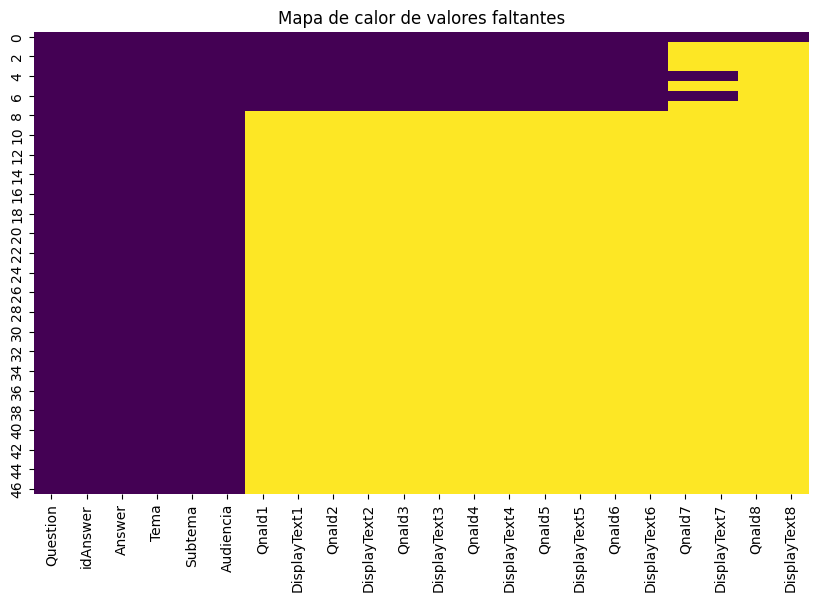

In [ ]:
# Visualización de valores faltantes
plt.figure(figsize=(10, 6))
sns.heatmap(df.isnull(), cbar=False, cmap='viridis')
plt.title('Mapa de calor de valores faltantes')
plt.show()

In [ ]:
# 2. Estadísticas resumidas
print("\nEstadísticas resumidas del conjunto de datos:")
print(df.describe(include='all'))


Estadísticas resumidas del conjunto de datos:
           Question      idAnswer                                Answer  \
count            47     47.000000                                    47   
unique           47           NaN                                    47   
top     Otros Temas           NaN  Algunas de las preguntas frecuentes:   
freq              1           NaN                                     1   
mean            NaN  21040.936170                                   NaN   
std             NaN  29156.765073                                   NaN   
min             NaN   5000.000000                                   NaN   
25%             NaN   5303.500000                                   NaN   
50%             NaN   6002.000000                                   NaN   
75%             NaN  25342.000000                                   NaN   
max             NaN  90155.000000                                   NaN   

                        Tema  Subtema Audiencia     

In [ ]:
df

,Question,idAnswer,Answer,Tema,Subtema,Audiencia,QnaId1,DisplayText1,QnaId2,DisplayText2,...,QnaId4,DisplayText4,QnaId5,DisplayText5,QnaId6,DisplayText6,QnaId7,DisplayText7,QnaId8,DisplayText8
0,Otros Temas,5000,Algunas de las preguntas frecuentes:,Preguntas frecuentes,Otros temas,pregfreq,90150.0,Gympass,5100.0,Ciberseguridad,...,5600.0,Eventos,6000.0,mis Constancias,6600.0,mis Viajes,40684.0,Bienestar y Flexibilidad,5000.0,Regresar
1,Gympass,90150,Preguntas frecuentes de **Gympass**,Preguntas frecuentes,Gympass,pregfreq,90151.0,¿Cómo puedo registrarme en Gympass?,90152.0,¿Cuáles son los costos y membresías de Gympass?,...,90154.0,¿Cómo actualizar tu plan de Gympass a uno de m...,90155.0,¿Puedo pausar o cancelar mi plan de Gympass?,5000.0,Regresar,NaN,NaN,NaN,NaN
2,Ciberseguridad,5100,Preguntas frecuentes de **Ciberseguridad**,Preguntas frecuentes,Ciberseguridad,pregfreq,5101.0,¿Cómo instalo el antivirus en mi computadora?,5102.0,¿Mi celular usa antivirus?,...,5104.0,¿Cómo debo de activar la llave Digital?,5105.0,¿Cómo hago para que mi contraseña sea segura?,5000.0,Regresar,NaN,NaN,NaN,NaN
3,Compras,5300,Preguntas frecuentes de **mis Compras**,Preguntas frecuentes,mis Compras,pregfreq,5301.0,Ayuda con una cotización,5302.0,¿En qué casos aplica colocar el folio de refle...,...,5304.0,¿Cómo puedo hacer una compra con pcard?,5305.0,¿Dónde reporto que no me aparece mi orden de c...,5000.0,Regresar,NaN,NaN,NaN,NaN
4,Eventos,5600,Preguntas frecuentes de **Eventos**,Preguntas frecuentes,Eventos,pregfreq,5601.0,¿Cómo solicitar alimentos y bebidas para mi ev...,5602.0,¿Cómo obtener un espacio para evento en campus?,...,5604.0,¿Cuáles son los requisitos para que mi evento ...,5605.0,¿Qué guía me ayudará a implementar acciones so...,5607.0,¿Cómo puedo pedir una sala de conferencias?,5000.0,Regresar,NaN,NaN
5,Mis Constancias,6000,Preguntas frecuentes de **mis Constancias**,Preguntas frecuentes,mis Constancias,pregfreq,6001.0,¿Qué constancias puedo descargar?,6002.0,¿Cómo obtengo una constancia en inglés?,...,6004.0,¿Dónde descargo mi constancia de registro en e...,6005.0,¿Cómo consigo una constancia para trámtiar VISA?,5000.0,Regresar,NaN,NaN,NaN,NaN
6,Viajes,6600,Preguntas frecuentes de **mis Viajes**,Preguntas frecuentes,mis Viajes,pregfreq,6601.0,¿Cómo puedo consultar los hoteles en convenio?,6602.0,¿Cuál es la guía de devolución de sobrantes de...,...,6604.0,¿Cómo puedo obtener una Tarjeta Corporativa?,6605.0,¿Dónde puedo solicitar un Anticipo de viajes?,6607.0,¿Cómo pido mi reembolso de gastos de viaje?,5000.0,Regresar,NaN,NaN
7,Bienestar y Flexibilidad,40684,Preguntas frecuentes de **Bienestar y Flexibil...,Preguntas frecuentes,Bienestar,pregfreq,40685.0,¿Qué actividades deportivas puedo tomar en el ...,40686.0,¿Quiénes pueden acceder a las actividades físi...,...,40688.0,¿Cómo puedo solicitar ayuda a través de la lín...,40689.0,¿Hay algún espacio para meditar en mi campus?,5000.0,Regresar,NaN,NaN,NaN,NaN
8,Ninguna de las anteriores,10000,Siento mucho que por el momento no tengo la in...,Preguntas frecuentes,Ninguna,pregfreq,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,¿Cómo puedo registrarme en Gympass?,90151,Tienes dos opciones para **registrarte en Gymp...,Preguntas frecuentes,Gympass,pregfreq,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# 3. Análisis de valores atípicos para columnas de tipo string (preguntas y respuestas)
from collections import Counter

# Seleccionar columnas de tipo string
string_columns = df.select_dtypes(include=['object']).columns

for col in string_columns:
    # Contar la frecuencia de las palabras en la columna
    all_words = ' '.join(df[col].dropna()).split()
    word_counts = Counter(all_words)

    # Mostrar las palabras más comunes y menos comunes
    print(f"\nFrecuencia de palabras en la columna: '{col}'")
    print("Palabras más comunes:", word_counts.most_common(10))
    print("Palabras menos comunes:", word_counts.most_common()[:-11:-1])

    # Detección de valores atípicos: filas con palabras muy poco comunes
    df[f'{col}_unusual'] = df[col].apply(lambda x: any(word in word_counts and word_counts[word] == 1 for word in str(x).split()) if pd.notnull(x) else False)

    # Mostrar las filas que contienen palabras poco comunes
    outliers = df[df[f'{col}_unusual']]
    print(f"\nValores atípicos detectados en la columna '{col}':")
    print(outliers[[col]].head())



Frecuencia de palabras en la columna: 'Question'
Palabras más comunes: [('de', 21), ('¿Cómo', 20), ('puedo', 9), ('mi', 9), ('para', 9), ('en', 8), ('el', 7), ('una', 7), ('¿Qué', 5), ('la', 5)]
Palabras menos comunes: [('Regresar', 1), ('meditar', 1), ('algún', 1), ('¿Hay', 1), ('través', 1), ('ayuda', 1), ('Tec?', 1), ('ofrece', 1), ('físicas', 1), ('acceder', 1)]

Valores atípicos detectados en la columna 'Question':
          Question
0      Otros Temas
2   Ciberseguridad
3          Compras
4          Eventos
5  Mis Constancias

Frecuencia de palabras en la columna: 'Answer'
Palabras más comunes: [('de', 148), ('a', 71), ('en', 66), ('tu', 54), ('la', 53), ('\\n\\n', 51), ('y', 50), ('el', 42), ('que', 40), ('para', 30)]
Palabras menos comunes: [('principal', 1), ('menú', 1), ('Regresar', 1), ('[**enlace**](https://mitec.itesm.mx/sites/talentoycultura/Regreso_flexible/regreso_flexible/Espacios_de_bienestar.html).', 1), ('disponibilidad,', 1), ('así', 1), ('físico,', 1), ('promover

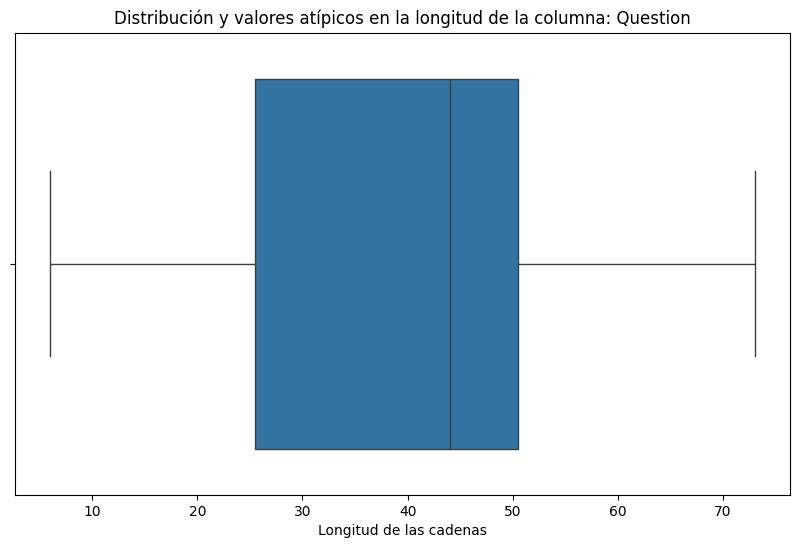


Valores atípicos detectados en la longitud de la columna 'Question':
                                             Question
23  ¿Dónde reporto que no me aparece mi orden de c...
28  ¿Qué guía me ayudará a implementar acciones so...
42  ¿Quiénes pueden acceder a las actividades físi...


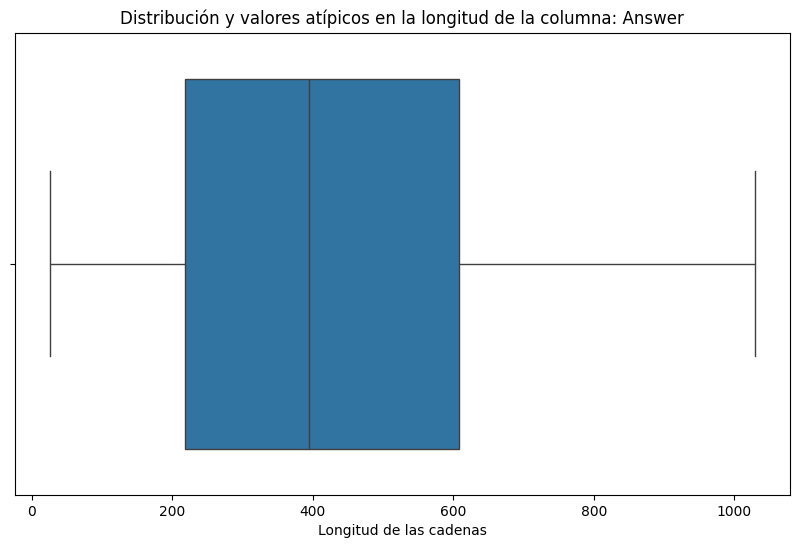


Valores atípicos detectados en la longitud de la columna 'Answer':
                                               Answer
14  Se puede instalar Crowdstrike a dispositivos a...
38  Puedes solicitar tu Tarjeta Corporativa Amex G...
39  Puedes **solicitar tu anticipo de viaje** en *...


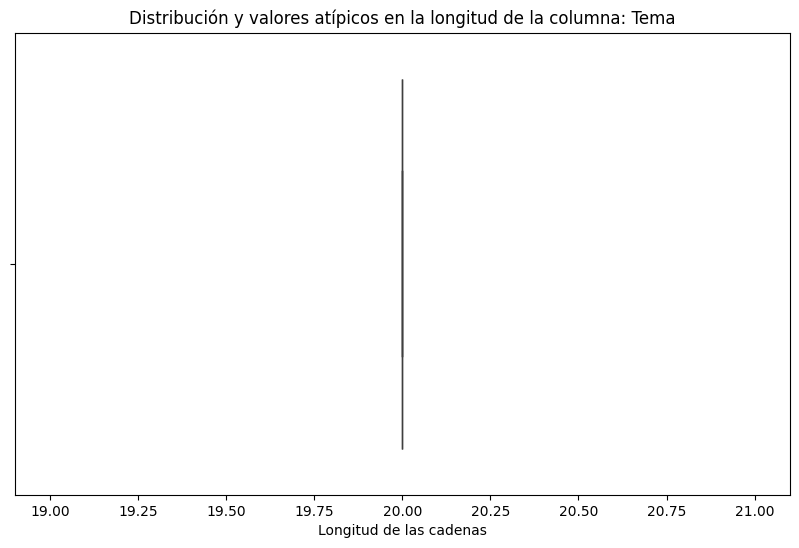


Valores atípicos detectados en la longitud de la columna 'Tema':
Empty DataFrame
Columns: [Tema]
Index: []


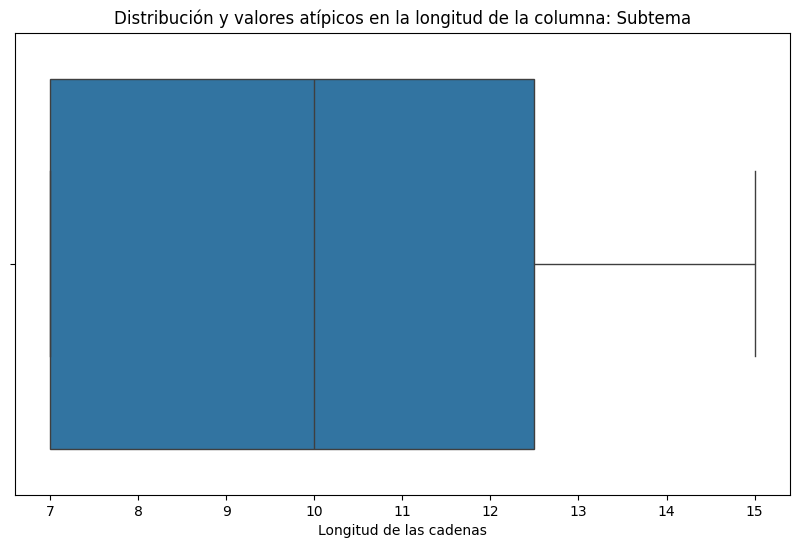


Valores atípicos detectados en la longitud de la columna 'Subtema':
Empty DataFrame
Columns: [Subtema]
Index: []


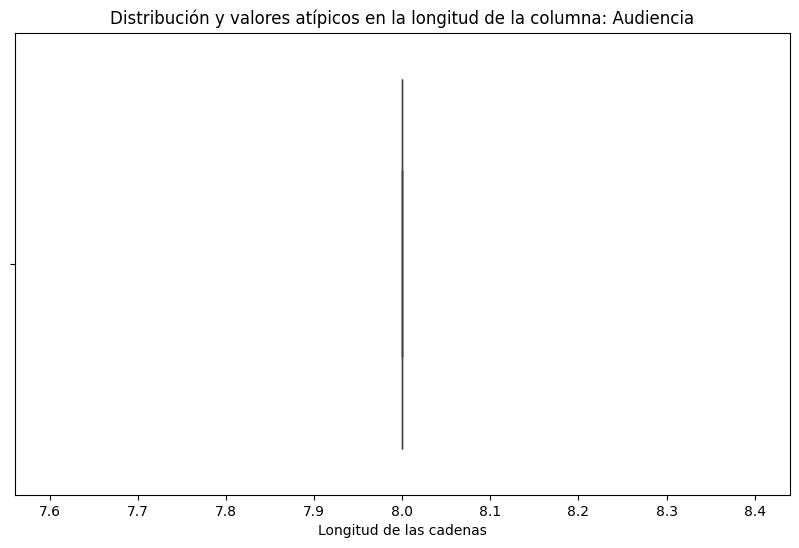


Valores atípicos detectados en la longitud de la columna 'Audiencia':
Empty DataFrame
Columns: [Audiencia]
Index: []


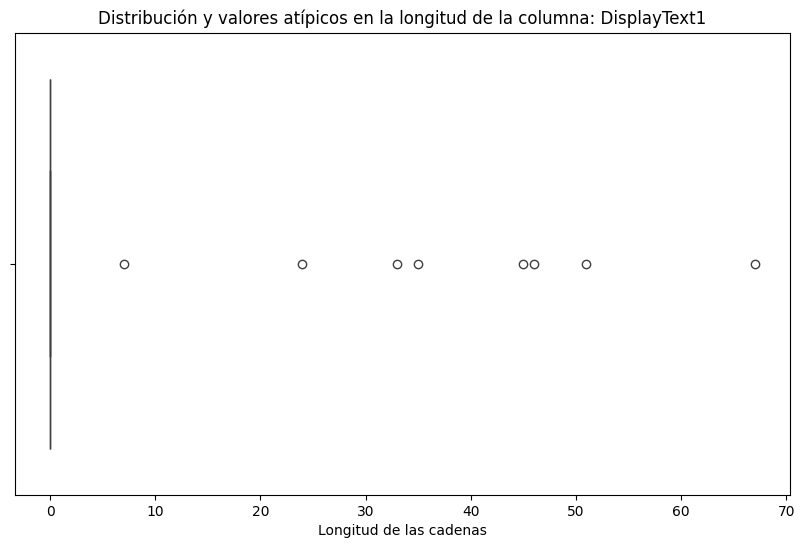


Valores atípicos detectados en la longitud de la columna 'DisplayText1':
                                        DisplayText1
4  ¿Cómo solicitar alimentos y bebidas para mi ev...
6     ¿Cómo puedo consultar los hoteles en convenio?
7  ¿Qué actividades deportivas puedo tomar en el ...


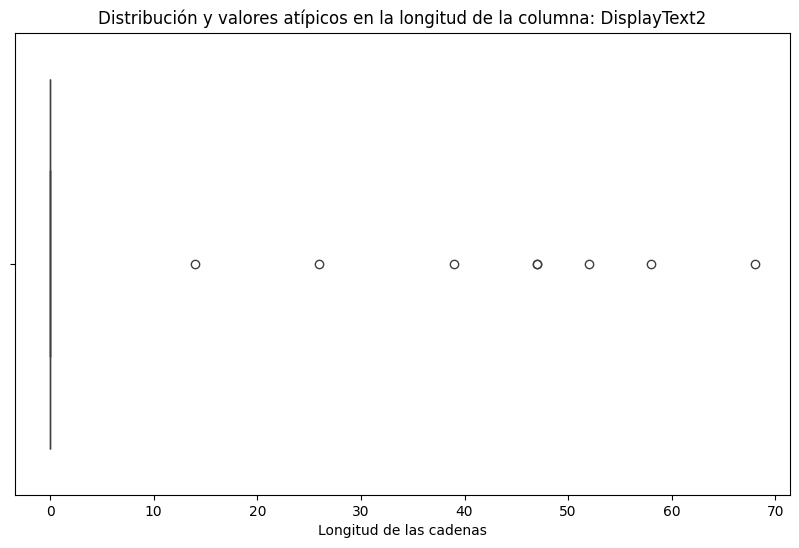


Valores atípicos detectados en la longitud de la columna 'DisplayText2':
                                        DisplayText2
3  ¿En qué casos aplica colocar el folio de refle...
6  ¿Cuál es la guía de devolución de sobrantes de...
7  ¿Quiénes pueden acceder a las actividades físi...


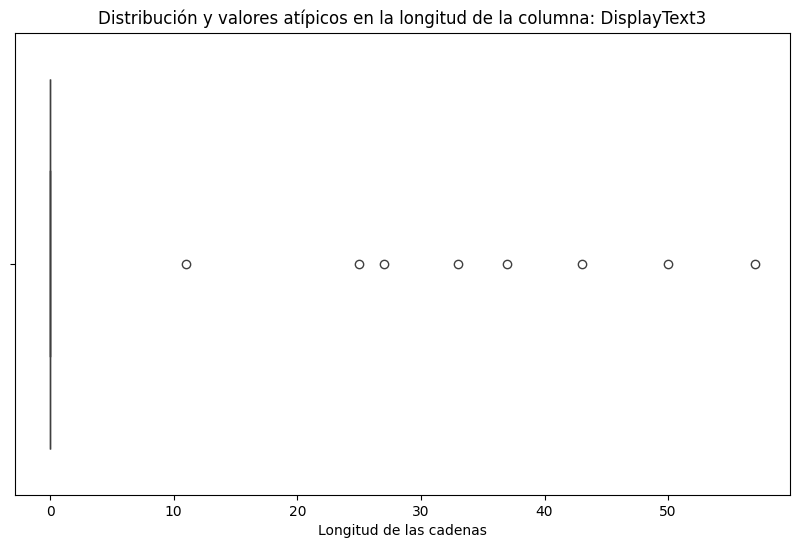


Valores atípicos detectados en la longitud de la columna 'DisplayText3':
                                        DisplayText3
2  ¿Qué tipos de peligros hay por correo electrón...
4        ¿Cómo encontrar proveedores para un evento?
5  ¿Cómo consigo la constancia de impuestos de mi...


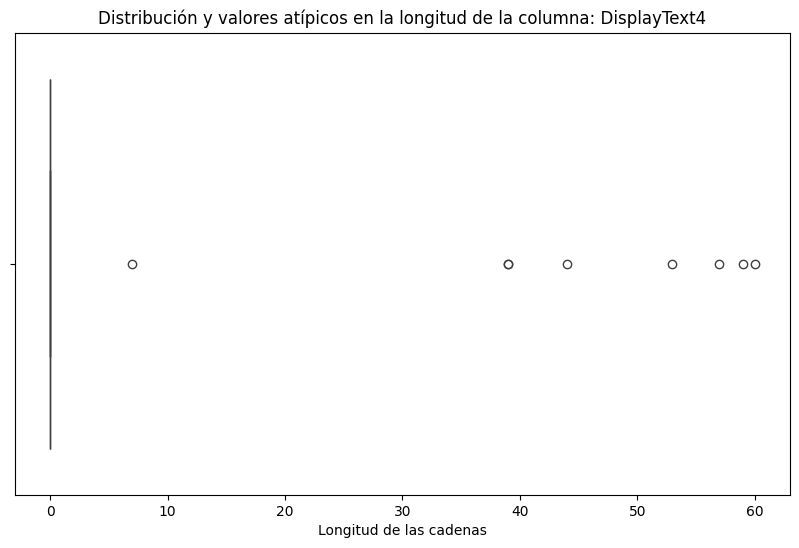


Valores atípicos detectados en la longitud de la columna 'DisplayText4':
                                        DisplayText4
1  ¿Cómo actualizar tu plan de Gympass a uno de m...
4  ¿Cuáles son los requisitos para que mi evento ...
7  ¿Cómo puedo solicitar ayuda a través de la lín...


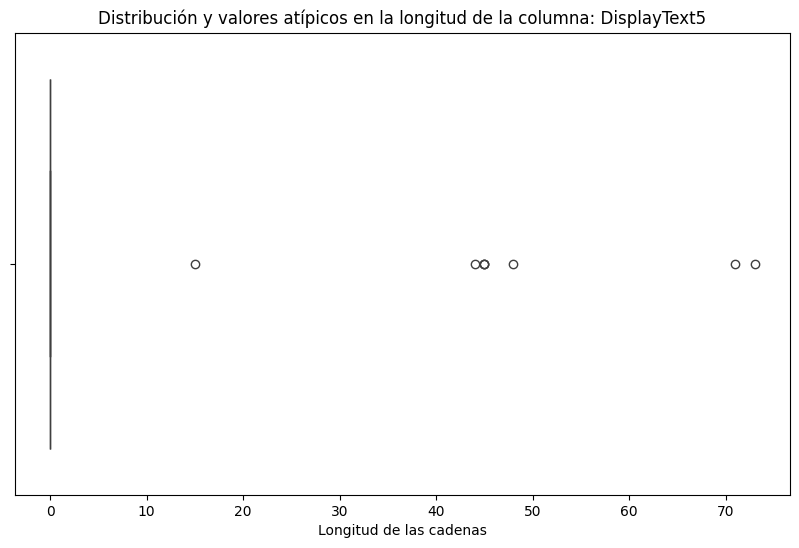


Valores atípicos detectados en la longitud de la columna 'DisplayText5':
                                        DisplayText5
3  ¿Dónde reporto que no me aparece mi orden de c...
4  ¿Qué guía me ayudará a implementar acciones so...
5   ¿Cómo consigo una constancia para trámtiar VISA?


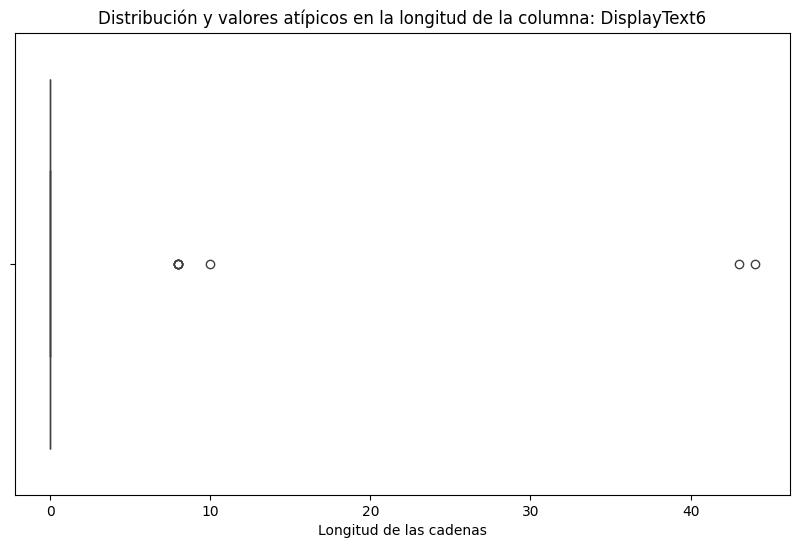


Valores atípicos detectados en la longitud de la columna 'DisplayText6':
                                   DisplayText6
0                                    mis Viajes
4   ¿Cómo puedo pedir una sala de conferencias?
6  ¿Cómo pido mi reembolso de gastos de viaje? 


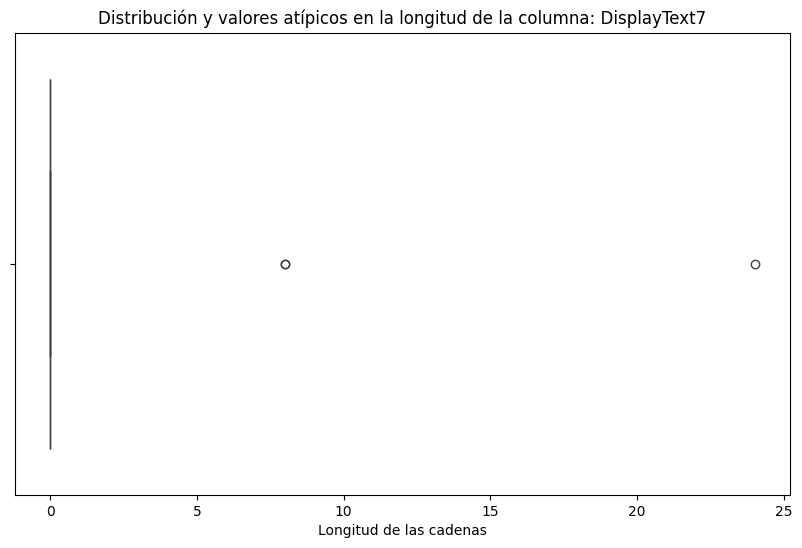


Valores atípicos detectados en la longitud de la columna 'DisplayText7':
               DisplayText7
0  Bienestar y Flexibilidad
4                  Regresar
6                  Regresar


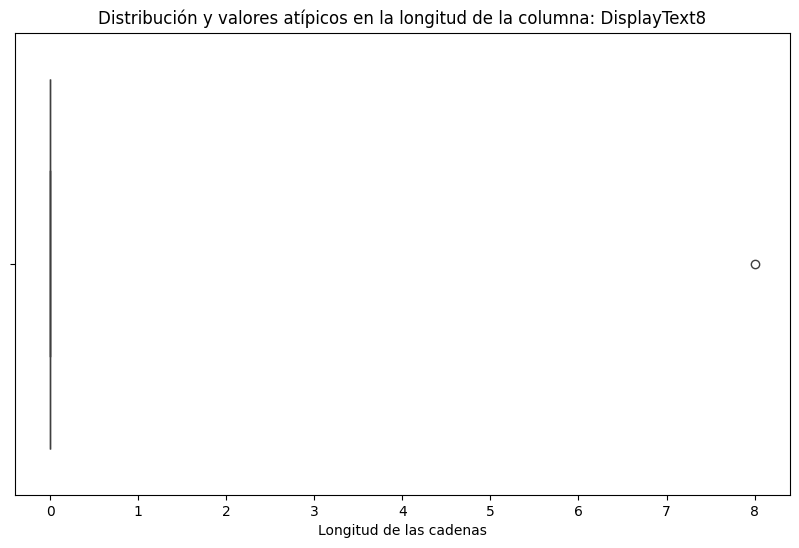


Valores atípicos detectados en la longitud de la columna 'DisplayText8':
  DisplayText8
0     Regresar


In [ ]:
# Visualización de boxplots para detectar valores atípicos
string_columns = df.select_dtypes(include=['object']).columns

for col in string_columns:
    # Calcular la longitud de cada entrada en la columna
    df[f'{col}_length'] = df[col].apply(lambda x: len(str(x)) if pd.notnull(x) else 0)

    # Visualizar la distribución de las longitudes usando un boxplot
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=df[f'{col}_length'])
    plt.title(f'Distribución y valores atípicos en la longitud de la columna: {col}')
    plt.xlabel('Longitud de las cadenas')
    plt.show()

    # Mostrar información sobre los valores atípicos
    outliers = df[df[f'{col}_length'] > df[f'{col}_length'].quantile(0.95)]  # Ejemplo de outliers superiores al percentil 95
    print(f"\nValores atípicos detectados en la longitud de la columna '{col}':")
    print(outliers[[col]].head())


In [ ]:
# 4. Analizar cardinalidad de variables categóricas
categorical_columns = df.select_dtypes(include=['object']).columns
for col in categorical_columns:
    print(f"\nCardinalidad de la columna '{col}': {df[col].nunique()}")


Cardinalidad de la columna 'Question': 47

Cardinalidad de la columna 'Answer': 47

Cardinalidad de la columna 'Tema': 1

Cardinalidad de la columna 'Subtema': 11

Cardinalidad de la columna 'Audiencia': 1

Cardinalidad de la columna 'DisplayText1': 8

Cardinalidad de la columna 'DisplayText2': 8

Cardinalidad de la columna 'DisplayText3': 8

Cardinalidad de la columna 'DisplayText4': 8

Cardinalidad de la columna 'DisplayText5': 8

Cardinalidad de la columna 'DisplayText6': 4

Cardinalidad de la columna 'DisplayText7': 2

Cardinalidad de la columna 'DisplayText8': 1


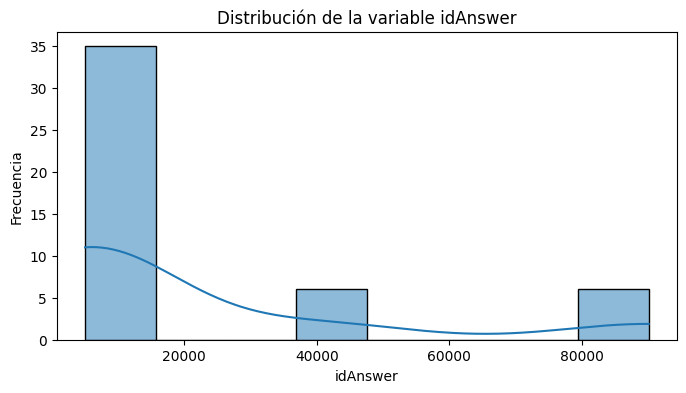

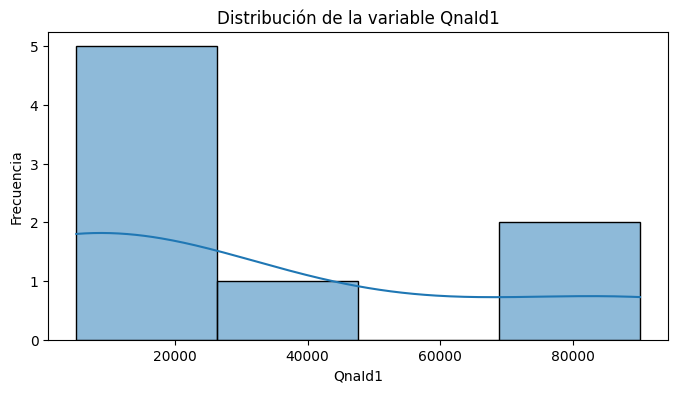

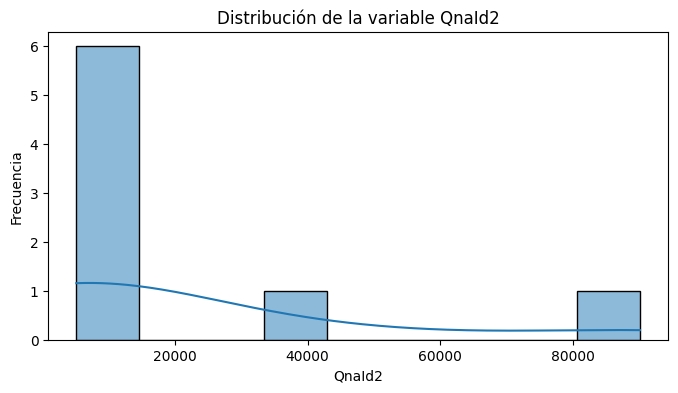

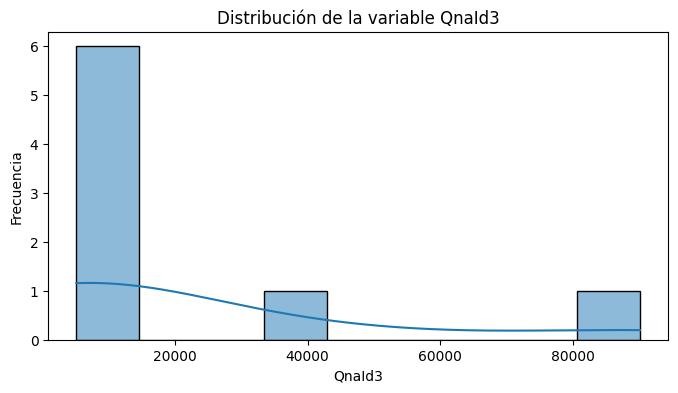

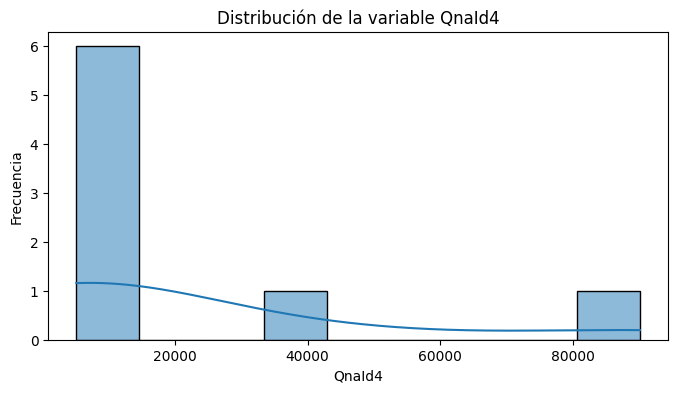

...

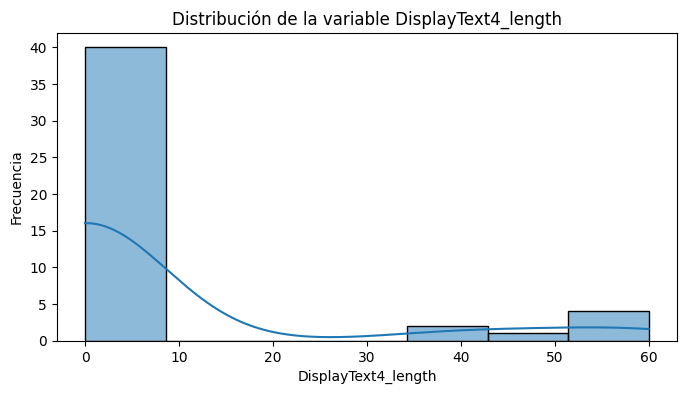

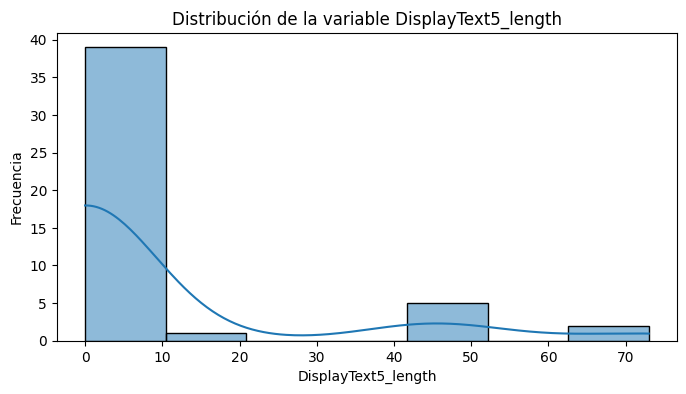

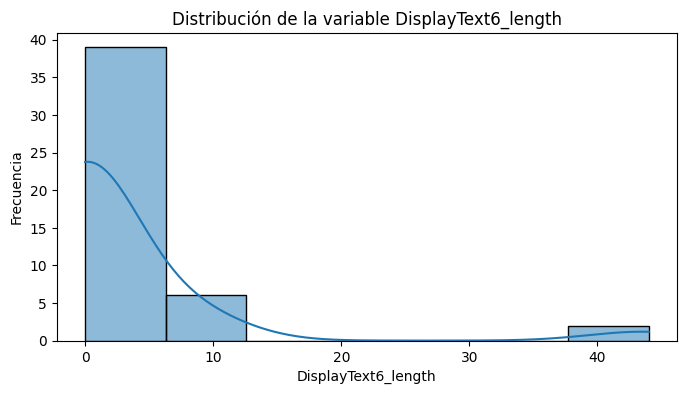

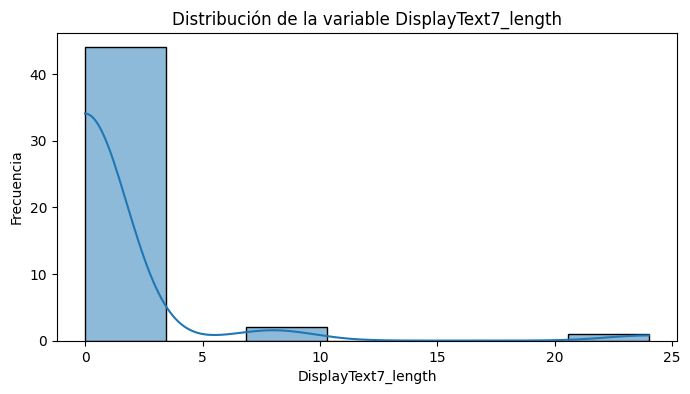

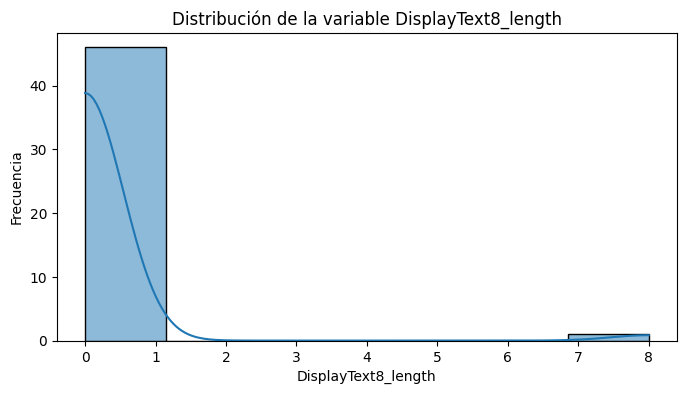

In [ ]:
# 5. Distribuciones de las variables numéricas
numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns  # Seleccionar columnas numéricas actuales

if len(numeric_columns) > 0:
    for col in numeric_columns:
        if col in df.columns:  # Verificar si la columna existe antes de proceder
            plt.figure(figsize=(8, 4))
            sns.histplot(df[col].dropna(), kde=True)
            plt.title(f'Distribución de la variable {col}')
            plt.xlabel(col)
            plt.ylabel('Frecuencia')
            plt.show()
else:
    print("No hay columnas numéricas en el DataFrame para analizar su distribución.")



Tabla de contingencia entre 'Question' y 'Answer':
Answer                                              **Todas y todos nuestros colaboradores pueden acceder a las actividades físicas** 🏋️‍♀️ **que se ofrecen en cada campus**. Toma en cuenta lo siguiente 👇: \n La actividad física a la que te inscribas se acredita por medio de tu perfil de SuccessFactors 👍. \n **Debes cumplir con el 80% de asistencia** 🙋🙋‍♂️. \n Al concluir, podrás descargar el certificado digital que avala dicha acreditación 📜. **En caso de que surja alguna situación por la que no puedas ir a clase, avísale a tu instructor o instructora** ⚠ para que te dé a conocer las alternativas que tienes disponibles para cumplir con la acreditación de tu actividad. Para **más información**, haz clic **en este** 👉 [**enlace**](https://mitec.itesm.mx/sites/talentoycultura/Regreso_flexible/Actividades_Fisicas/ActividadesFisicas.html) 😉.  \
Question                                                                                       

/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 127947 (\N{WEIGHT LIFTER}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 128071 (\N{WHITE DOWN POINTING BACKHAND INDEX}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 128077 (\N{THUMBS UP SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 128587 (\N{HAPPY PERSON RAISING ONE HAND}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 128220 (\N{SCROLL}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 128073 (\N{WHITE RIGHT POINTING BACKHAND INDEX}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.

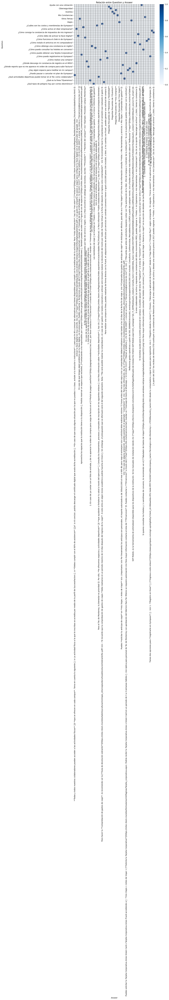


Tabla de contingencia entre 'Question' y 'Tema':
Tema                                                Preguntas frecuentes
Question                                                                
Ayuda con una cotización                                               1
Bienestar y Flexibilidad                                               1
Ciberseguridad                                                         1
Compras                                                                1
Eventos                                                                1
Gympass                                                                1
Mis Constancias                                                        1
Ninguna de las anteriores                                              1
Otros Temas                                                            1
Regresar                                                               1
Viajes                                                                 1
¿

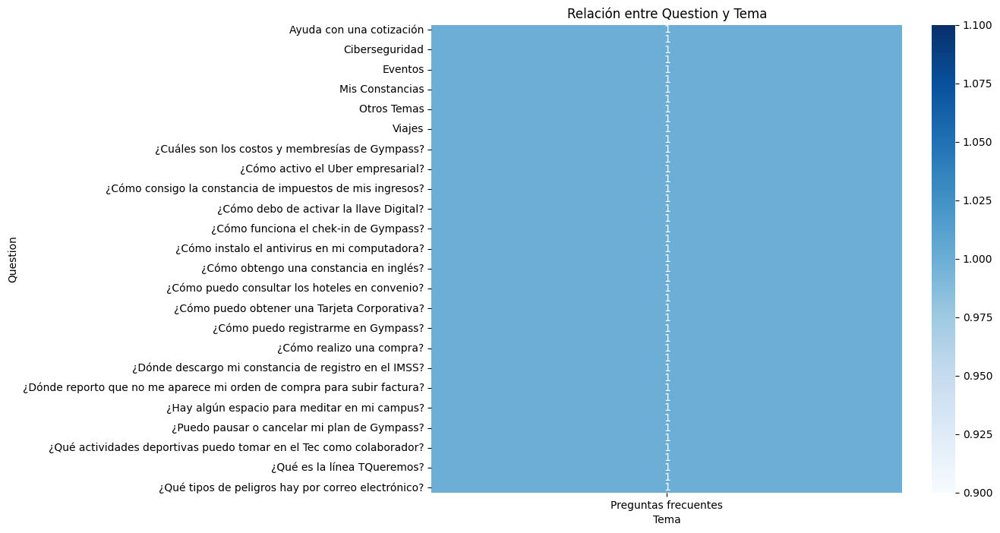


Tabla de contingencia entre 'Question' y 'Subtema':
Subtema                                             Bienestar  Ciberseguridad  \
Question                                                                        
Ayuda con una cotización                                    0               0   
Bienestar y Flexibilidad                                    1               0   
Ciberseguridad                                              0               1   
Compras                                                     0               0   
Eventos                                                     0               0   
Gympass                                                     0               0   
Mis Constancias                                             0               0   
Ninguna de las anteriores                                   0               0   
Otros Temas                                                 0               0   
Regresar                                                

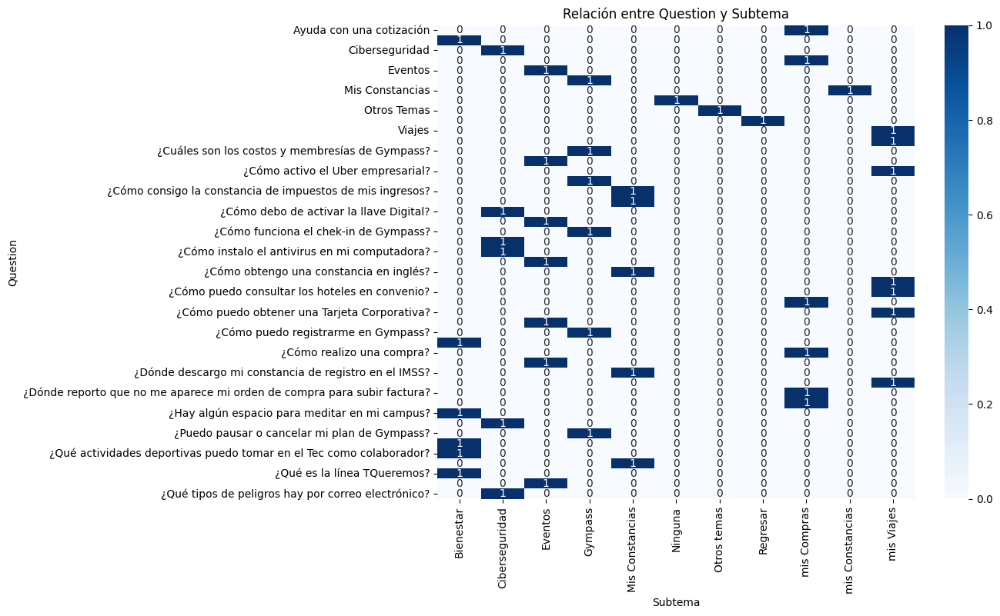


Tabla de contingencia entre 'Question' y 'Audiencia':
Audiencia                                           pregfreq
Question                                                    
Ayuda con una cotización                                   1
Bienestar y Flexibilidad                                   1
Ciberseguridad                                             1
Compras                                                    1
Eventos                                                    1
Gympass                                                    1
Mis Constancias                                            1
Ninguna de las anteriores                                  1
Otros Temas                                                1
Regresar                                                   1
Viajes                                                     1
¿Cuál es la guía de devolución de sobrantes de ...         1
¿Cuáles son los costos y membresías de Gympass?            1
¿Cuáles son los requisitos par

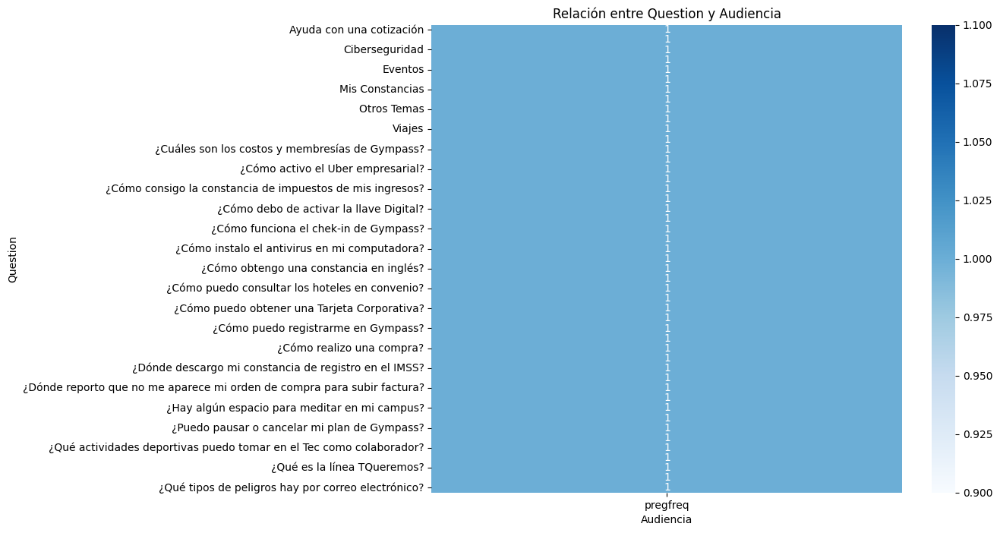


Tabla de contingencia entre 'Question' y 'DisplayText1':
DisplayText1              Ayuda con una cotización  Gympass  \
Question                                                      
Bienestar y Flexibilidad                         0        0   
Ciberseguridad                                   0        0   
Compras                                          1        0   
Eventos                                          0        0   
Gympass                                          0        0   
Mis Constancias                                  0        0   
Otros Temas                                      0        1   
Viajes                                           0        0   

DisplayText1              ¿Cómo instalo el antivirus en mi computadora?  \
Question                                                                  
Bienestar y Flexibilidad                                              0   
Ciberseguridad                                                        1   
Compras    

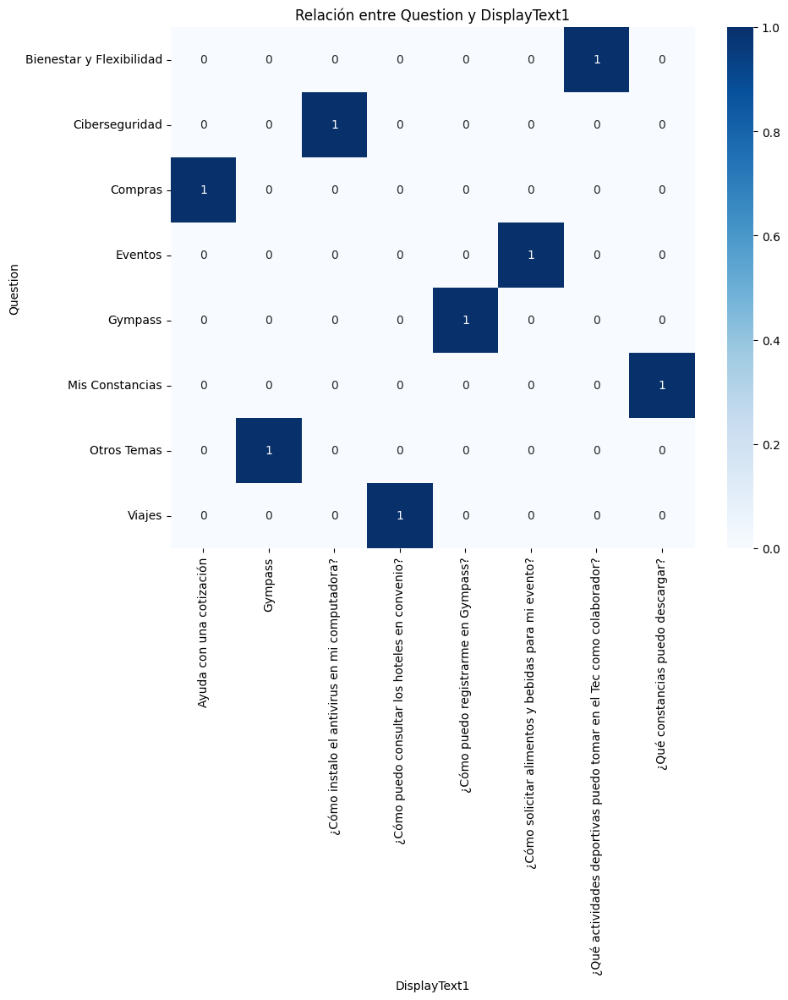


Tabla de contingencia entre 'Question' y 'DisplayText2':
DisplayText2              Ciberseguridad  \
Question                                   
Bienestar y Flexibilidad               0   
Ciberseguridad                         0   
Compras                                0   
Eventos                                0   
Gympass                                0   
Mis Constancias                        0   
Otros Temas                            1   
Viajes                                 0   

DisplayText2              ¿Cuál es la guía de devolución de sobrantes de mis viajes?  \
Question                                                                               
Bienestar y Flexibilidad                                                  0            
Ciberseguridad                                                            0            
Compras                                                                   0            
Eventos                                                      

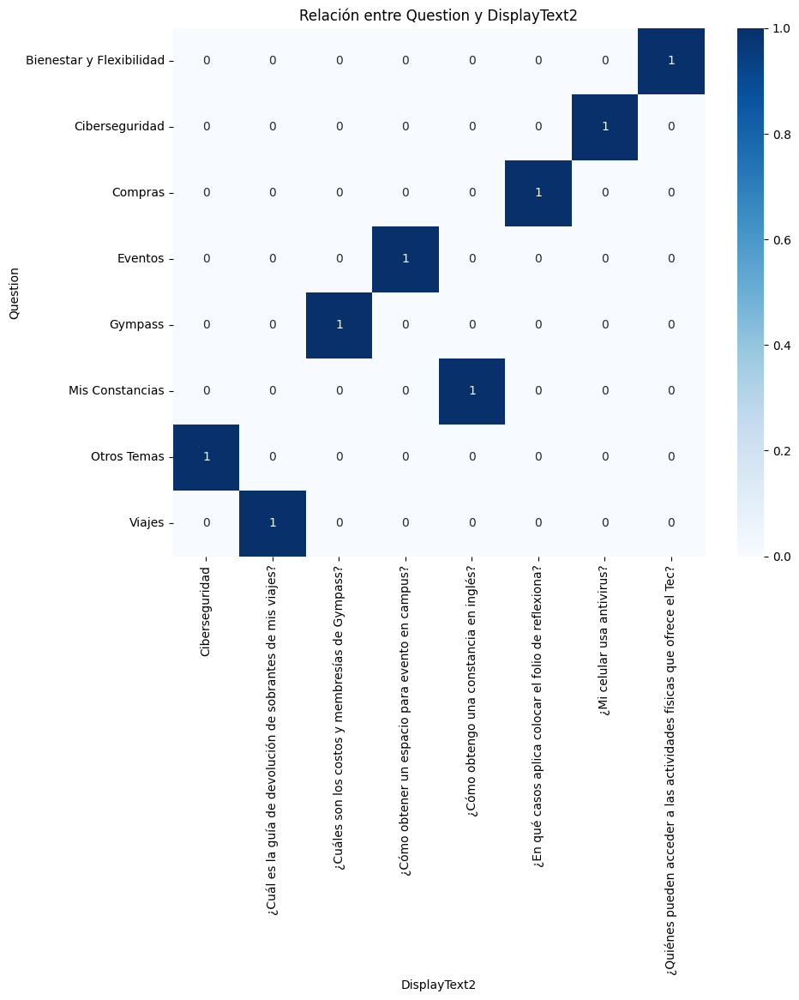


Tabla de contingencia entre 'Question' y 'DisplayText3':
DisplayText3              mis Compras  ¿Cómo activo el Uber empresarial?  \
Question                                                                   
Bienestar y Flexibilidad            0                                  0   
Ciberseguridad                      0                                  0   
Compras                             0                                  0   
Eventos                             0                                  0   
Gympass                             0                                  0   
Mis Constancias                     0                                  0   
Otros Temas                         1                                  0   
Viajes                              0                                  1   

DisplayText3              ¿Cómo consigo la constancia de impuestos de mis ingresos?  \
Question                                                                              
Bienest

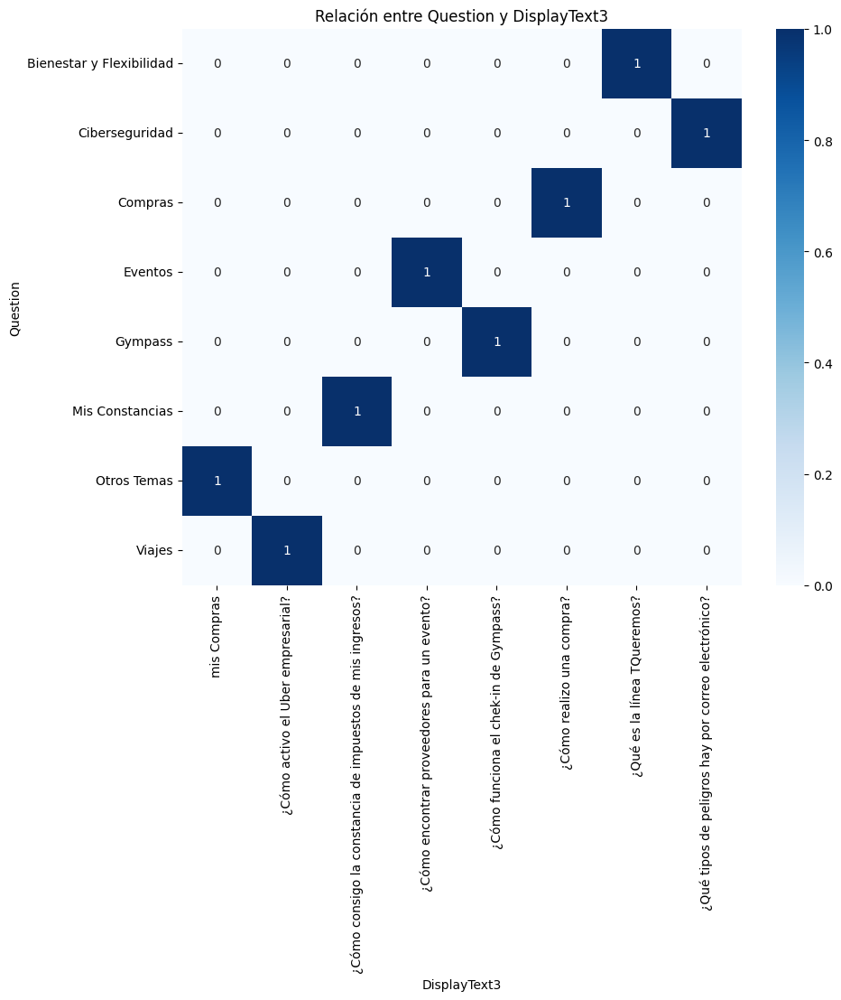


Tabla de contingencia entre 'Question' y 'DisplayText4':
DisplayText4              Eventos  \
Question                            
Bienestar y Flexibilidad        0   
Ciberseguridad                  0   
Compras                         0   
Eventos                         0   
Gympass                         0   
Mis Constancias                 0   
Otros Temas                     1   
Viajes                          0   

DisplayText4              ¿Cuáles son los requisitos para que mi evento sea inclusivo?  \
Question                                                                                 
Bienestar y Flexibilidad                                                  0              
Ciberseguridad                                                            0              
Compras                                                                   0              
Eventos                                                                   1              
Gympass                        

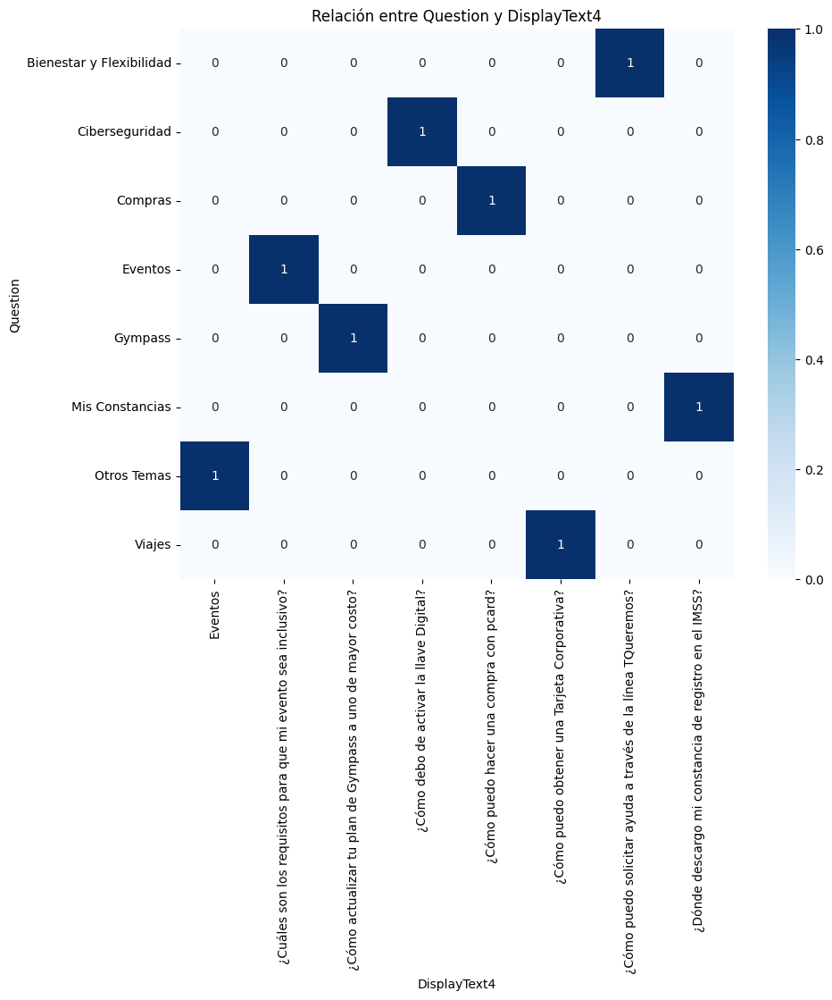


Tabla de contingencia entre 'Question' y 'DisplayText5':
DisplayText5              mis Constancias  \
Question                                    
Bienestar y Flexibilidad                0   
Ciberseguridad                          0   
Compras                                 0   
Eventos                                 0   
Gympass                                 0   
Mis Constancias                         0   
Otros Temas                             1   
Viajes                                  0   

DisplayText5              ¿Cómo consigo una constancia para trámtiar VISA?  \
Question                                                                     
Bienestar y Flexibilidad                                                 0   
Ciberseguridad                                                           0   
Compras                                                                  0   
Eventos                                                                  0   
Gympass                

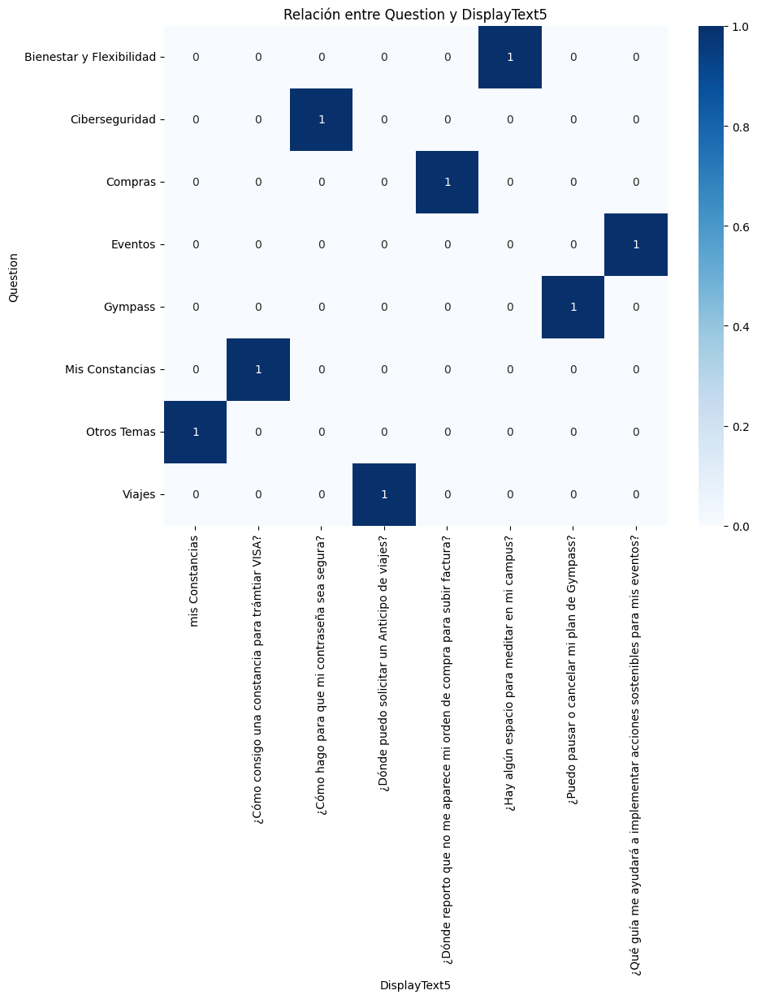


Tabla de contingencia entre 'Question' y 'DisplayText6':
DisplayText6              Regresar  mis Viajes  \
Question                                         
Bienestar y Flexibilidad         1           0   
Ciberseguridad                   1           0   
Compras                          1           0   
Eventos                          0           0   
Gympass                          1           0   
Mis Constancias                  1           0   
Otros Temas                      0           1   
Viajes                           0           0   

DisplayText6              ¿Cómo pido mi reembolso de gastos de viaje?   \
Question                                                                 
Bienestar y Flexibilidad                                             0   
Ciberseguridad                                                       0   
Compras                                                              0   
Eventos                                                              0 

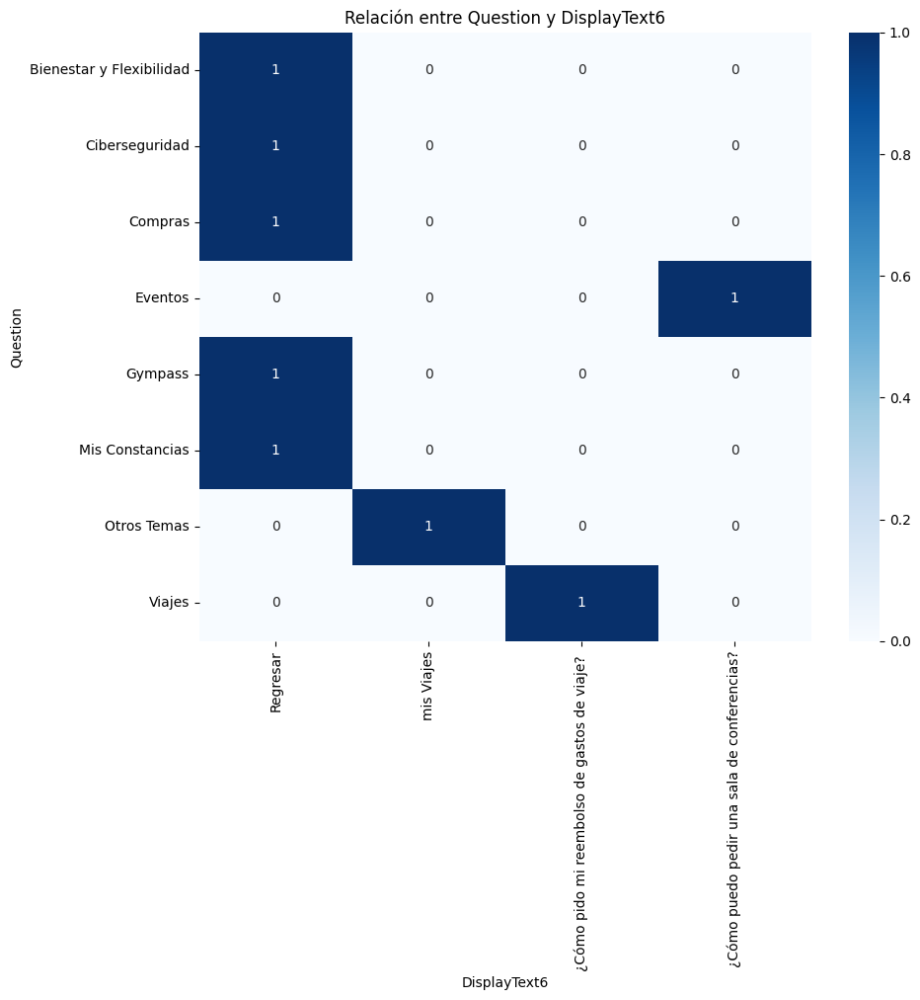


Tabla de contingencia entre 'Question' y 'DisplayText7':
DisplayText7  Bienestar y Flexibilidad  Regresar
Question                                        
Eventos                              0         1
Otros Temas                          1         0
Viajes                               0         1


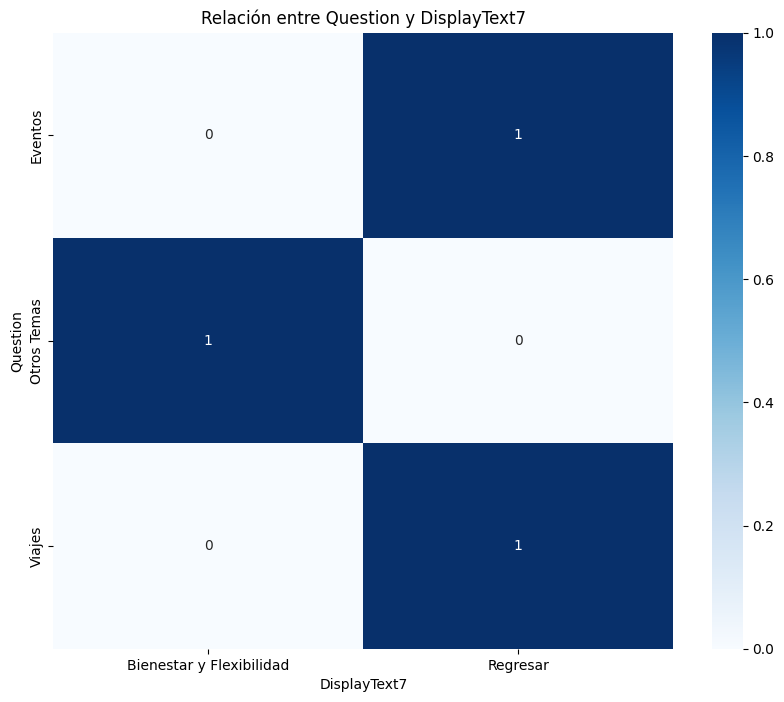


Tabla de contingencia entre 'Question' y 'DisplayText8':
DisplayText8  Regresar
Question              
Otros Temas          1


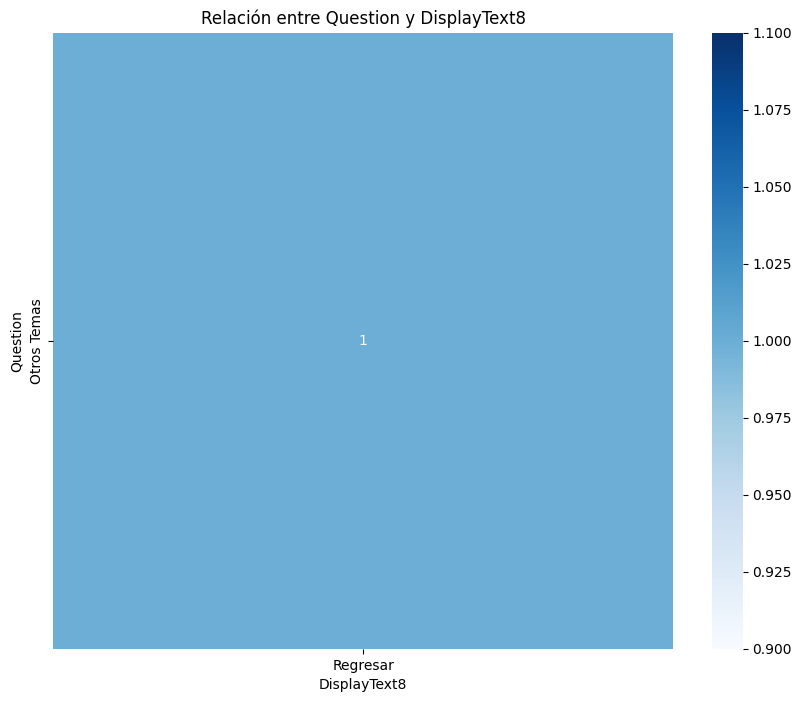


Tabla de contingencia entre 'Answer' y 'Tema':
Tema                                                Preguntas frecuentes
Answer                                                                  
**Todas y todos nuestros colaboradores pueden a...                     1
**Uber empresarial** es una herramienta que per...                     1
Activar tu llave digital es muy sencillo. Da cl...                     1
Algunas de las preguntas frecuentes:                                   1
Aprovecha los espacios que la institución tiene...                     1
El Tec busca que todas las personas que son par...                     1
El Tec cuenta con varios catálogos de proveedor...                     1
En **Campus Monterrey** está a tu disposición u...                     1
En caso de no aparecer tu orden de compra en el...                     1
La línea TQueremos 🤗 es un programa dirigido a ...                     1
Las constancias de autogestión son emitidas en ...                     1
Los

/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 127947 (\N{WEIGHT LIFTER}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 128071 (\N{WHITE DOWN POINTING BACKHAND INDEX}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 128077 (\N{THUMBS UP SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 128587 (\N{HAPPY PERSON RAISING ONE HAND}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 128220 (\N{SCROLL}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 128073 (\N{WHITE RIGHT POINTING BACKHAND INDEX}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.

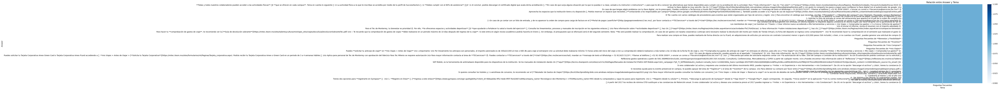


Tabla de contingencia entre 'Answer' y 'Subtema':
Subtema                                             Bienestar  Ciberseguridad  \
Answer                                                                          
**Todas y todos nuestros colaboradores pueden a...          1               0   
**Uber empresarial** es una herramienta que per...          0               0   
Activar tu llave digital es muy sencillo. Da cl...          0               1   
Algunas de las preguntas frecuentes:                        0               0   
Aprovecha los espacios que la institución tiene...          0               0   
El Tec busca que todas las personas que son par...          0               0   
El Tec cuenta con varios catálogos de proveedor...          0               0   
En **Campus Monterrey** está a tu disposición u...          0               0   
En caso de no aparecer tu orden de compra en el...          0               0   
La línea TQueremos 🤗 es un programa dirigido a ...        

/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 127947 (\N{WEIGHT LIFTER}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 128071 (\N{WHITE DOWN POINTING BACKHAND INDEX}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 128077 (\N{THUMBS UP SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 128587 (\N{HAPPY PERSON RAISING ONE HAND}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 128220 (\N{SCROLL}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 128073 (\N{WHITE RIGHT POINTING BACKHAND INDEX}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.

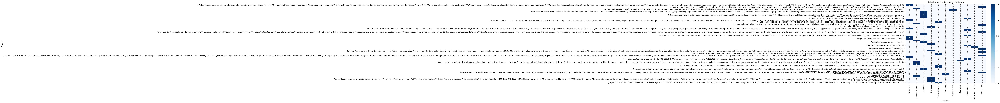


Tabla de contingencia entre 'Answer' y 'Audiencia':
Audiencia                                           pregfreq
Answer                                                      
**Todas y todos nuestros colaboradores pueden a...         1
**Uber empresarial** es una herramienta que per...         1
Activar tu llave digital es muy sencillo. Da cl...         1
Algunas de las preguntas frecuentes:                       1
Aprovecha los espacios que la institución tiene...         1
El Tec busca que todas las personas que son par...         1
El Tec cuenta con varios catálogos de proveedor...         1
En **Campus Monterrey** está a tu disposición u...         1
En caso de no aparecer tu orden de compra en el...         1
La línea TQueremos 🤗 es un programa dirigido a ...         1
Las constancias de autogestión son emitidas en ...         1
Los peligros del correo electrónico son: \n\n *...         1
Los reembolsos de viaje 💰 se tramitan en **Gast...         1
Para consultar los costos y memb

/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 127947 (\N{WEIGHT LIFTER}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 128071 (\N{WHITE DOWN POINTING BACKHAND INDEX}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 128077 (\N{THUMBS UP SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 128587 (\N{HAPPY PERSON RAISING ONE HAND}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 128220 (\N{SCROLL}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 128073 (\N{WHITE RIGHT POINTING BACKHAND INDEX}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.

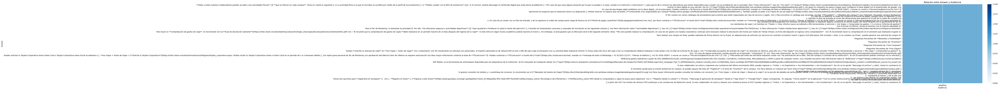


Tabla de contingencia entre 'Answer' y 'DisplayText1':
DisplayText1                                        Ayuda con una cotización  \
Answer                                                                         
Algunas de las preguntas frecuentes:                                       0   
Preguntas frecuentes de **Bienestar y Flexibili...                         0   
Preguntas frecuentes de **Ciberseguridad**                                 0   
Preguntas frecuentes de **Eventos**                                        0   
Preguntas frecuentes de **Gympass**                                        0   
Preguntas frecuentes de **mis Compras**                                    1   
Preguntas frecuentes de **mis Constancias**                                0   
Preguntas frecuentes de **mis Viajes**                                     0   

DisplayText1                                        Gympass  \
Answer                                                        
Algunas de las pr

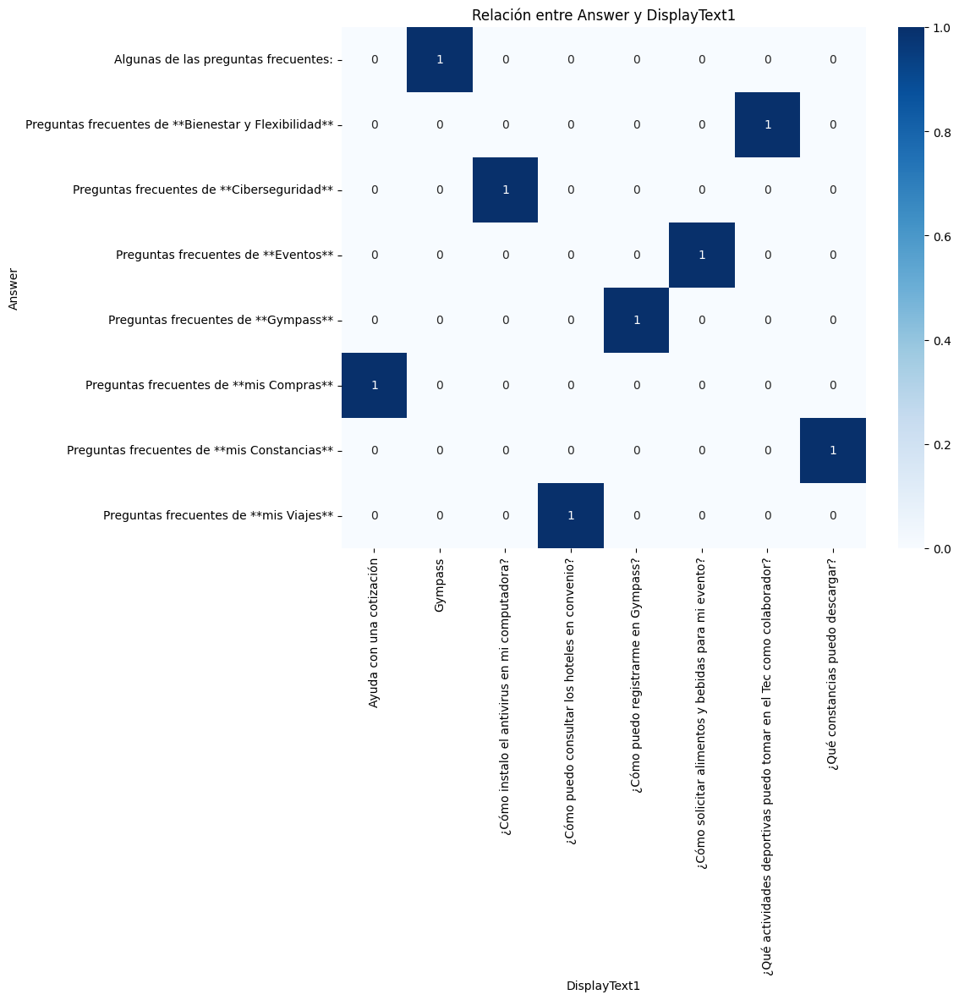


Tabla de contingencia entre 'Answer' y 'DisplayText2':
DisplayText2                                        Ciberseguridad  \
Answer                                                               
Algunas de las preguntas frecuentes:                             1   
Preguntas frecuentes de **Bienestar y Flexibili...               0   
Preguntas frecuentes de **Ciberseguridad**                       0   
Preguntas frecuentes de **Eventos**                              0   
Preguntas frecuentes de **Gympass**                              0   
Preguntas frecuentes de **mis Compras**                          0   
Preguntas frecuentes de **mis Constancias**                      0   
Preguntas frecuentes de **mis Viajes**                           0   

DisplayText2                                        ¿Cuál es la guía de devolución de sobrantes de mis viajes?  \
Answer                                                                                                           
Algunas de las 

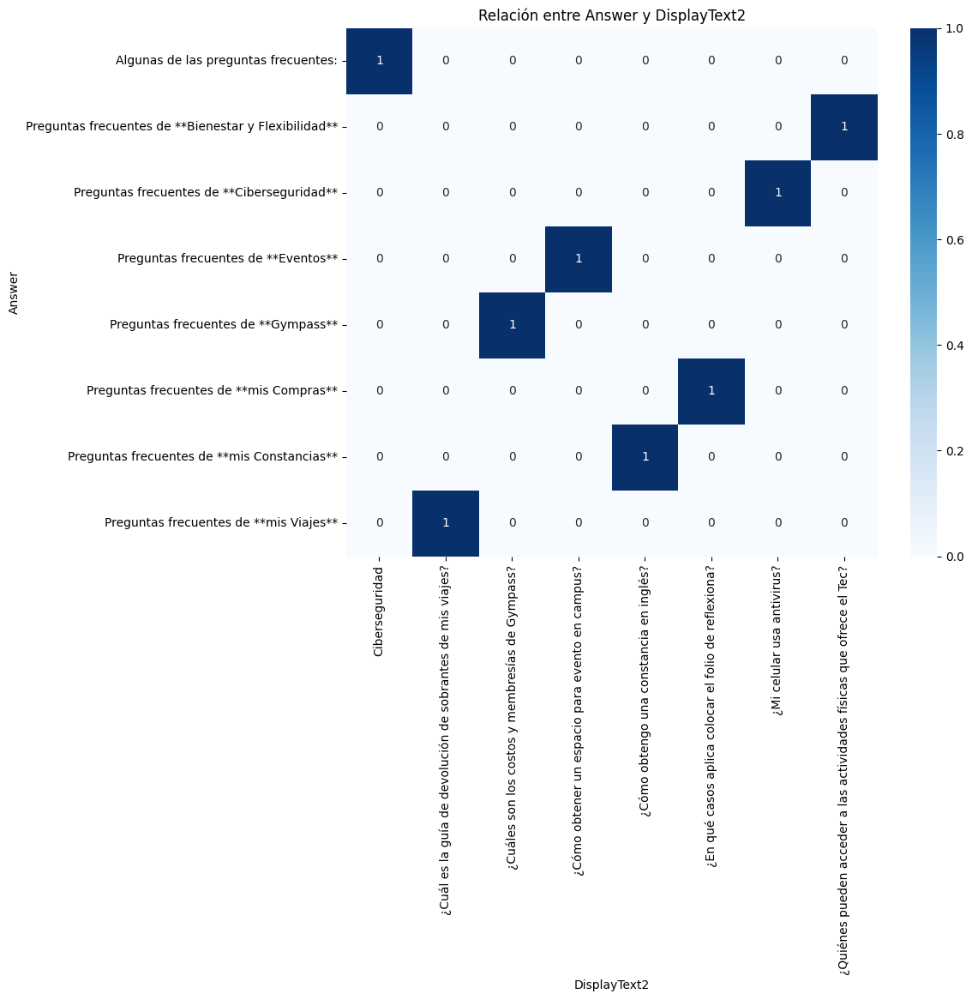


Tabla de contingencia entre 'Answer' y 'DisplayText3':
DisplayText3                                        mis Compras  \
Answer                                                            
Algunas de las preguntas frecuentes:                          1   
Preguntas frecuentes de **Bienestar y Flexibili...            0   
Preguntas frecuentes de **Ciberseguridad**                    0   
Preguntas frecuentes de **Eventos**                           0   
Preguntas frecuentes de **Gympass**                           0   
Preguntas frecuentes de **mis Compras**                       0   
Preguntas frecuentes de **mis Constancias**                   0   
Preguntas frecuentes de **mis Viajes**                        0   

DisplayText3                                        ¿Cómo activo el Uber empresarial?  \
Answer                                                                                  
Algunas de las preguntas frecuentes:                                                0   
Pregun

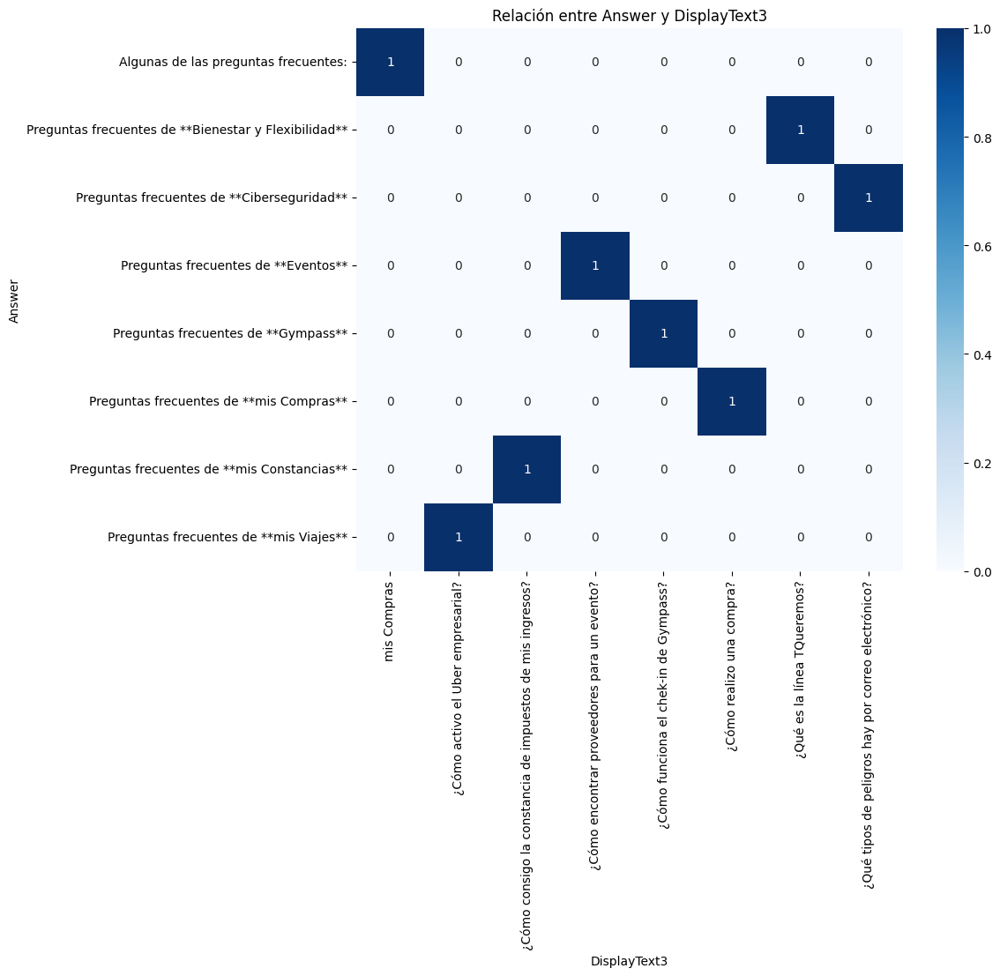


Tabla de contingencia entre 'Answer' y 'DisplayText4':
DisplayText4                                        Eventos  \
Answer                                                        
Algunas de las preguntas frecuentes:                      1   
Preguntas frecuentes de **Bienestar y Flexibili...        0   
Preguntas frecuentes de **Ciberseguridad**                0   
Preguntas frecuentes de **Eventos**                       0   
Preguntas frecuentes de **Gympass**                       0   
Preguntas frecuentes de **mis Compras**                   0   
Preguntas frecuentes de **mis Constancias**               0   
Preguntas frecuentes de **mis Viajes**                    0   

DisplayText4                                        ¿Cuáles son los requisitos para que mi evento sea inclusivo?  \
Answer                                                                                                             
Algunas de las preguntas frecuentes:                                             

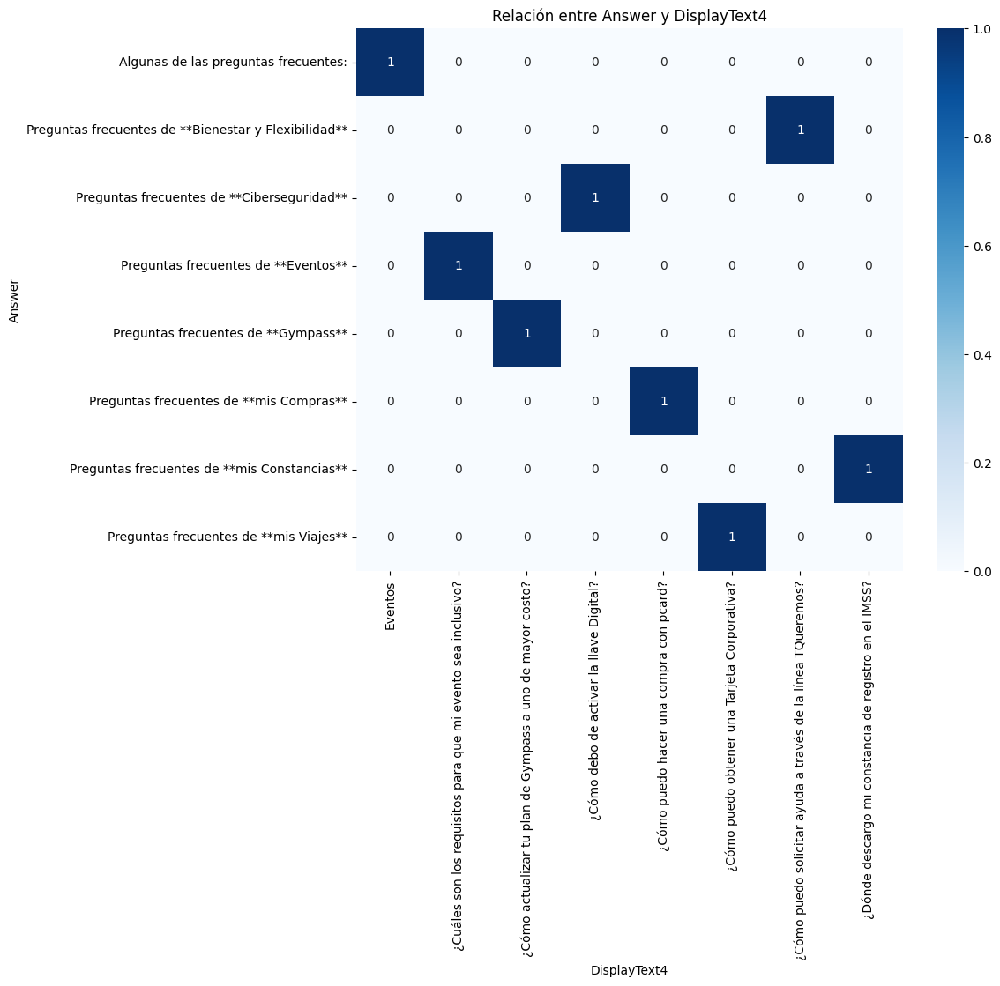


Tabla de contingencia entre 'Answer' y 'DisplayText5':
DisplayText5                                        mis Constancias  \
Answer                                                                
Algunas de las preguntas frecuentes:                              1   
Preguntas frecuentes de **Bienestar y Flexibili...                0   
Preguntas frecuentes de **Ciberseguridad**                        0   
Preguntas frecuentes de **Eventos**                               0   
Preguntas frecuentes de **Gympass**                               0   
Preguntas frecuentes de **mis Compras**                           0   
Preguntas frecuentes de **mis Constancias**                       0   
Preguntas frecuentes de **mis Viajes**                            0   

DisplayText5                                        ¿Cómo consigo una constancia para trámtiar VISA?  \
Answer                                                                                                 
Algunas de las preguntas 

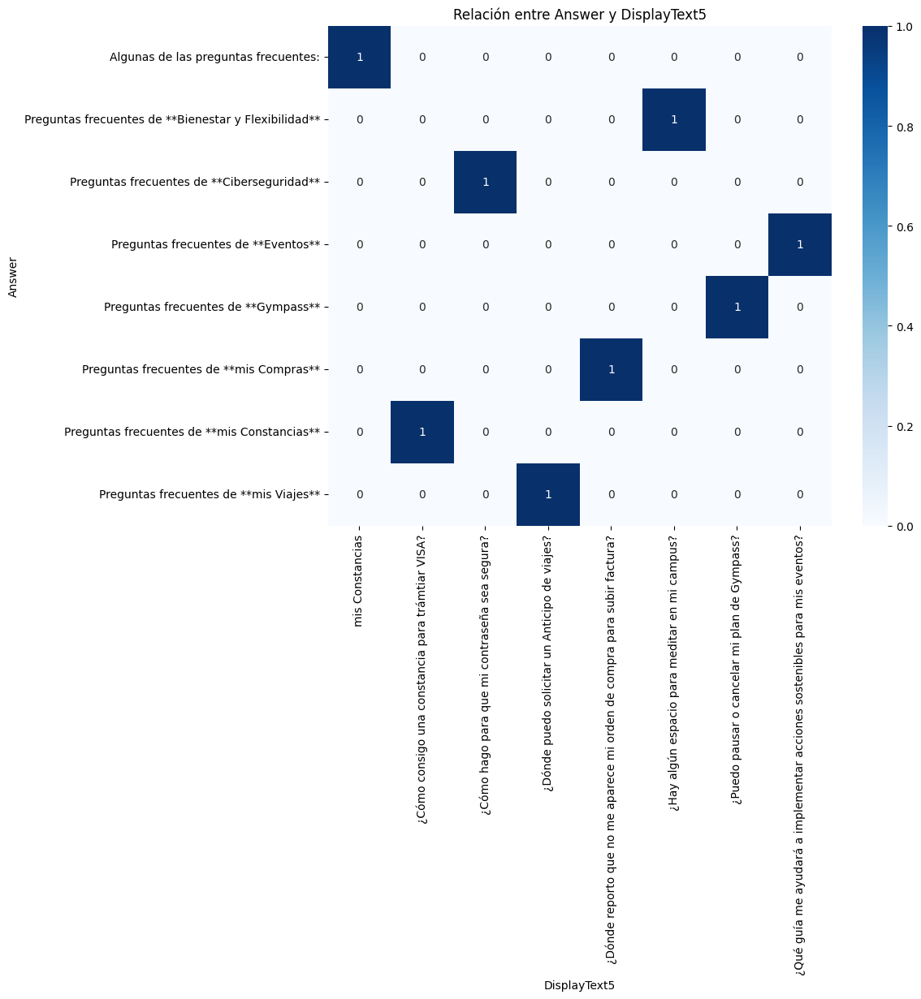


Tabla de contingencia entre 'Answer' y 'DisplayText6':
DisplayText6                                        Regresar  mis Viajes  \
Answer                                                                     
Algunas de las preguntas frecuentes:                       0           1   
Preguntas frecuentes de **Bienestar y Flexibili...         1           0   
Preguntas frecuentes de **Ciberseguridad**                 1           0   
Preguntas frecuentes de **Eventos**                        0           0   
Preguntas frecuentes de **Gympass**                        1           0   
Preguntas frecuentes de **mis Compras**                    1           0   
Preguntas frecuentes de **mis Constancias**                1           0   
Preguntas frecuentes de **mis Viajes**                     0           0   

DisplayText6                                        ¿Cómo pido mi reembolso de gastos de viaje?   \
Answer                                                                             

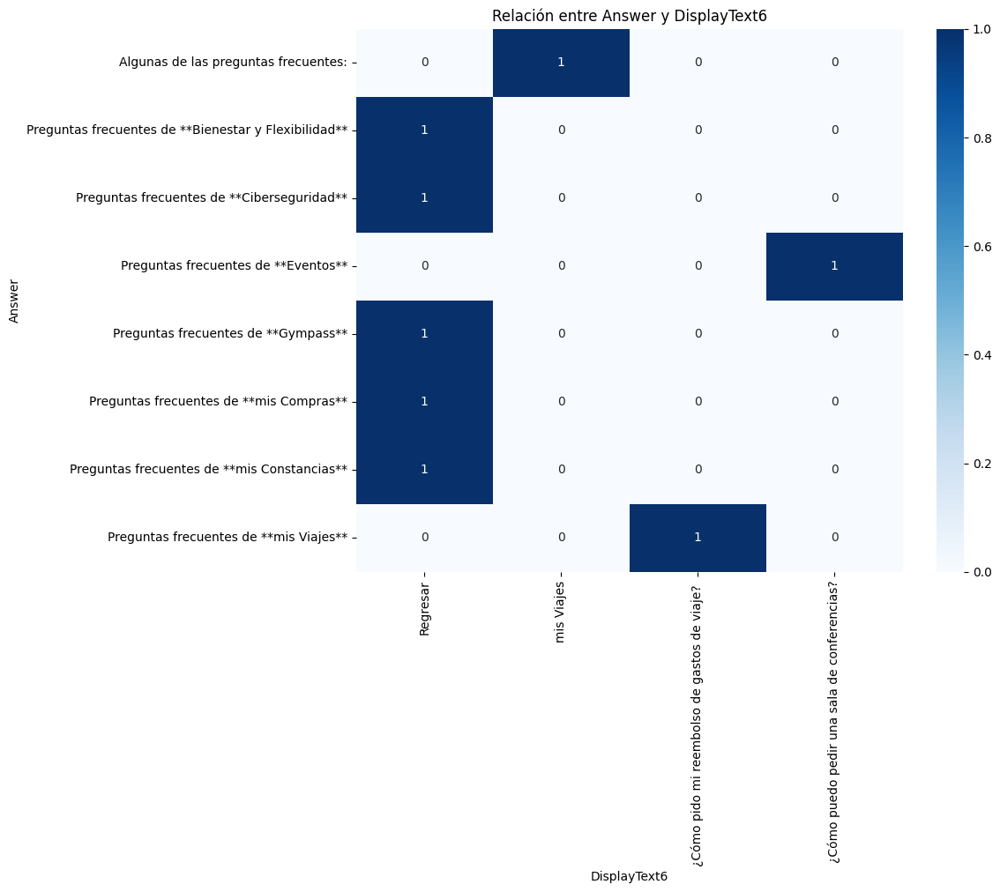


Tabla de contingencia entre 'Answer' y 'DisplayText7':
DisplayText7                            Bienestar y Flexibilidad  Regresar
Answer                                                                    
Algunas de las preguntas frecuentes:                           1         0
Preguntas frecuentes de **Eventos**                            0         1
Preguntas frecuentes de **mis Viajes**                         0         1


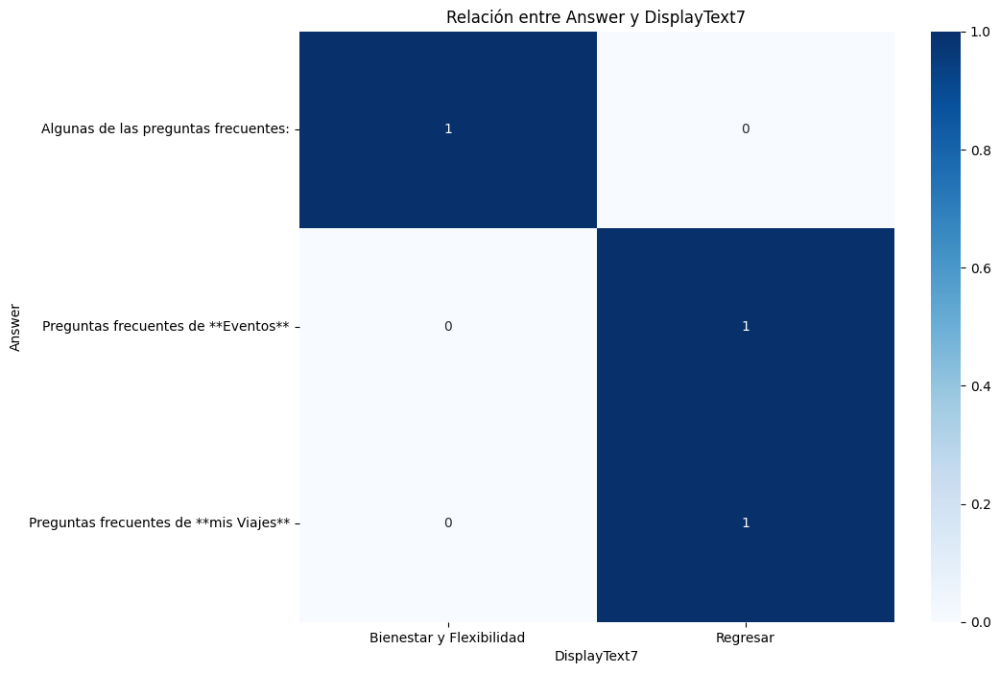


Tabla de contingencia entre 'Answer' y 'DisplayText8':
DisplayText8                          Regresar
Answer                                        
Algunas de las preguntas frecuentes:         1


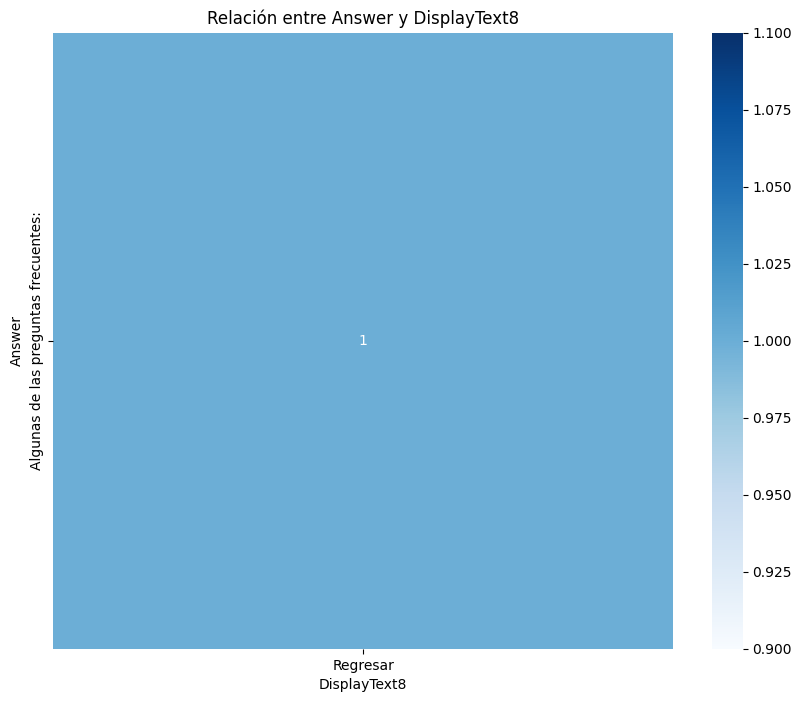


Tabla de contingencia entre 'Tema' y 'Subtema':
Subtema               Bienestar  Ciberseguridad  Eventos  Gympass  \
Tema                                                                
Preguntas frecuentes          6               6        7        6   

Subtema               Mis Constancias  Ninguna  Otros temas  Regresar  \
Tema                                                                    
Preguntas frecuentes                5        1            1         1   

Subtema               mis Compras  mis Constancias  mis Viajes  
Tema                                                            
Preguntas frecuentes            6                1           7  


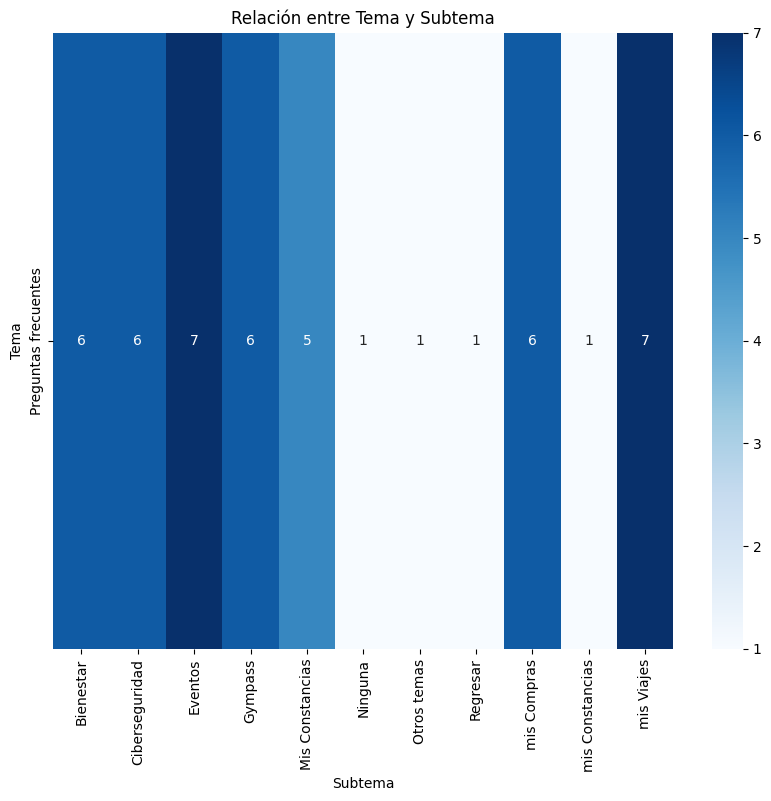


Tabla de contingencia entre 'Tema' y 'Audiencia':
Audiencia             pregfreq
Tema                          
Preguntas frecuentes        47


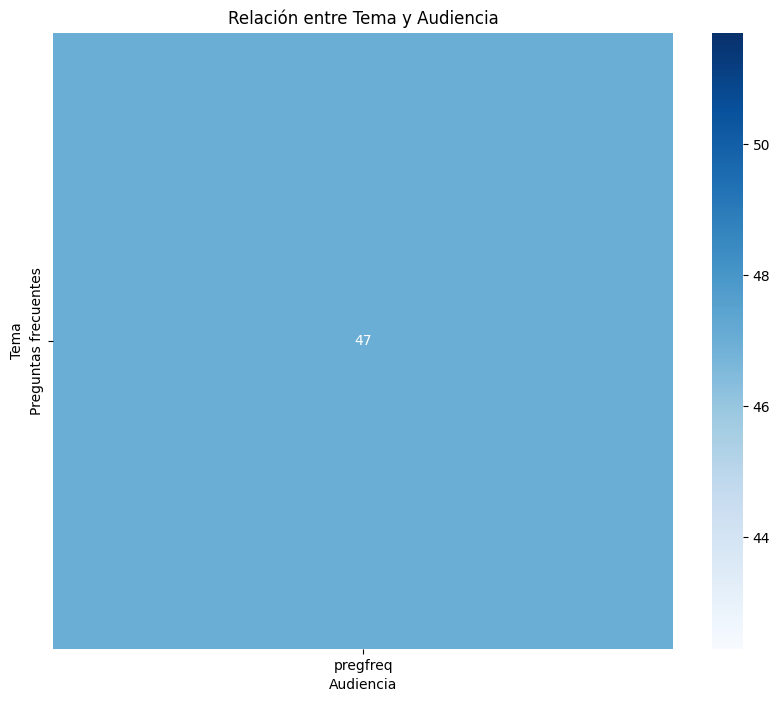


Tabla de contingencia entre 'Tema' y 'DisplayText1':
DisplayText1          Ayuda con una cotización  Gympass  \
Tema                                                      
Preguntas frecuentes                         1        1   

DisplayText1          ¿Cómo instalo el antivirus en mi computadora?  \
Tema                                                                  
Preguntas frecuentes                                              1   

DisplayText1          ¿Cómo puedo consultar los hoteles en convenio?  \
Tema                                                                   
Preguntas frecuentes                                               1   

DisplayText1          ¿Cómo puedo registrarme en Gympass?  \
Tema                                                        
Preguntas frecuentes                                    1   

DisplayText1          ¿Cómo solicitar alimentos y bebidas para mi evento?  \
Tema                                                                        

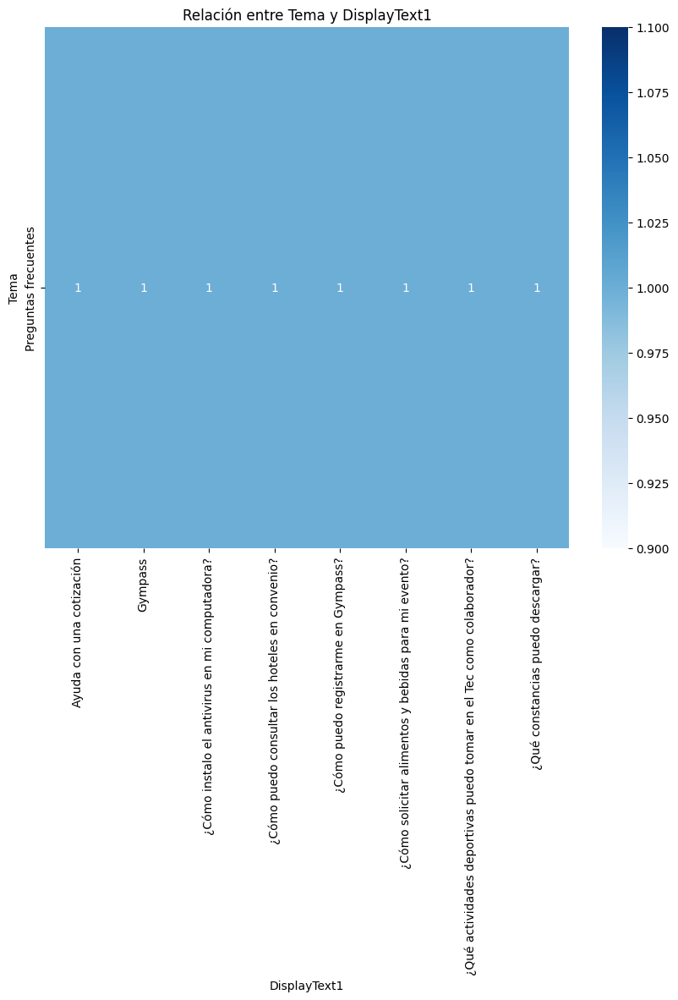


Tabla de contingencia entre 'Tema' y 'DisplayText2':
DisplayText2          Ciberseguridad  \
Tema                                   
Preguntas frecuentes               1   

DisplayText2          ¿Cuál es la guía de devolución de sobrantes de mis viajes?  \
Tema                                                                               
Preguntas frecuentes                                                  1            

DisplayText2          ¿Cuáles son los costos y membresías de Gympass?  \
Tema                                                                    
Preguntas frecuentes                                                1   

DisplayText2          ¿Cómo obtener un espacio para evento en campus?  \
Tema                                                                    
Preguntas frecuentes                                                1   

DisplayText2          ¿Cómo obtengo una constancia en inglés?  \
Tema                                                            
Pr

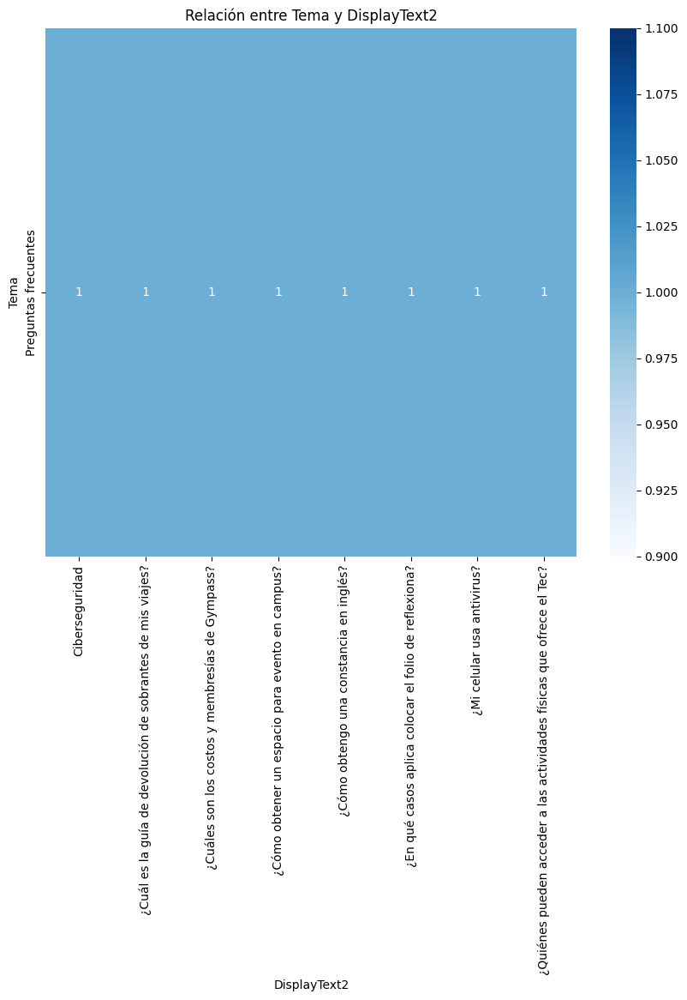


Tabla de contingencia entre 'Tema' y 'DisplayText3':
DisplayText3          mis Compras  ¿Cómo activo el Uber empresarial?  \
Tema                                                                   
Preguntas frecuentes            1                                  1   

DisplayText3          ¿Cómo consigo la constancia de impuestos de mis ingresos?  \
Tema                                                                              
Preguntas frecuentes                                                  1           

DisplayText3          ¿Cómo encontrar proveedores para un evento?  \
Tema                                                                
Preguntas frecuentes                                            1   

DisplayText3          ¿Cómo funciona el chek-in de Gympass?  \
Tema                                                          
Preguntas frecuentes                                      1   

DisplayText3          ¿Cómo realizo una compra?  ¿Qué es la línea TQueremos?  \
T

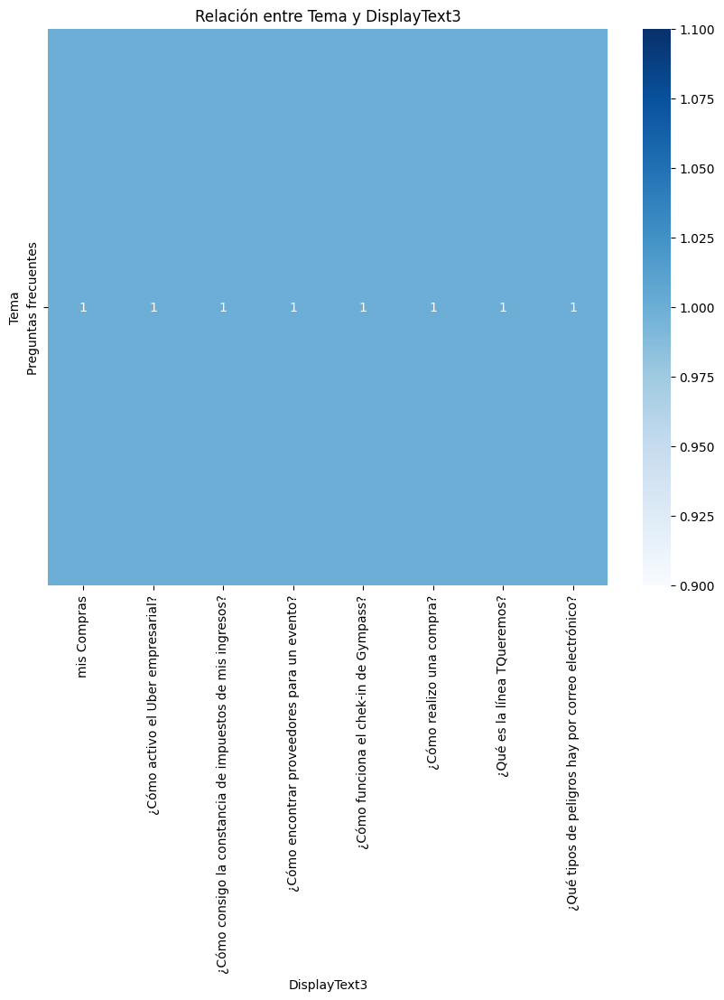


Tabla de contingencia entre 'Tema' y 'DisplayText4':
DisplayText4          Eventos  \
Tema                            
Preguntas frecuentes        1   

DisplayText4          ¿Cuáles son los requisitos para que mi evento sea inclusivo?  \
Tema                                                                                 
Preguntas frecuentes                                                  1              

DisplayText4          ¿Cómo actualizar tu plan de Gympass a uno de mayor costo?  \
Tema                                                                              
Preguntas frecuentes                                                  1           

DisplayText4          ¿Cómo debo de activar la llave Digital?  \
Tema                                                            
Preguntas frecuentes                                        1   

DisplayText4          ¿Cómo puedo hacer una compra con pcard?  \
Tema                                                            
Preguntas f

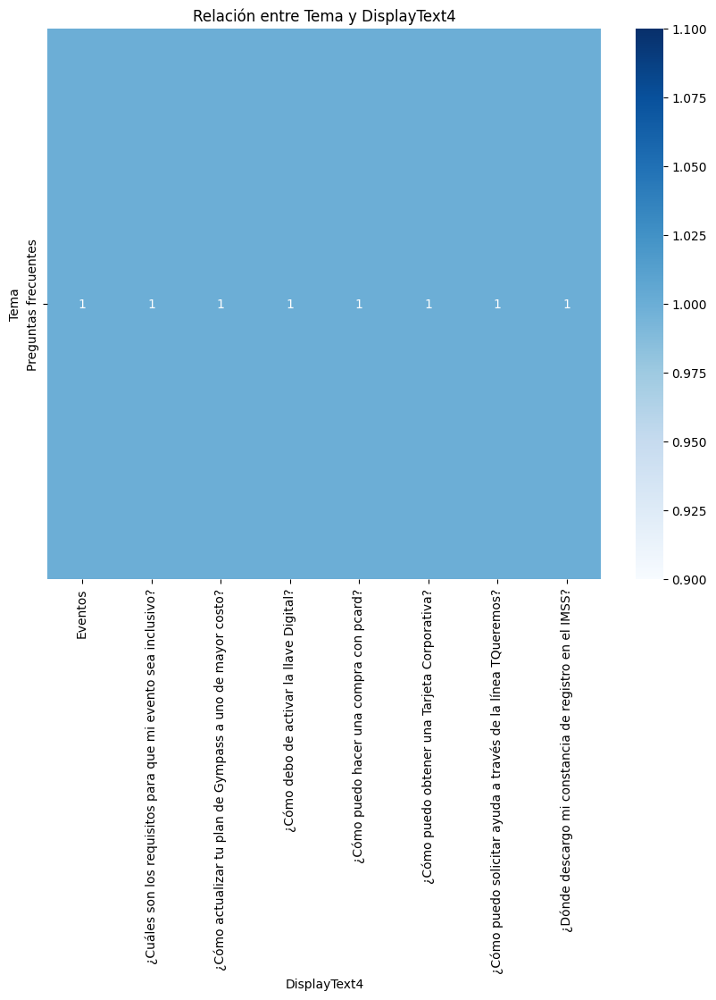


Tabla de contingencia entre 'Tema' y 'DisplayText5':
DisplayText5          mis Constancias  \
Tema                                    
Preguntas frecuentes                1   

DisplayText5          ¿Cómo consigo una constancia para trámtiar VISA?  \
Tema                                                                     
Preguntas frecuentes                                                 1   

DisplayText5          ¿Cómo hago para que mi contraseña sea segura?  \
Tema                                                                  
Preguntas frecuentes                                              1   

DisplayText5          ¿Dónde puedo solicitar un Anticipo de viajes?  \
Tema                                                                  
Preguntas frecuentes                                              1   

DisplayText5          ¿Dónde reporto que no me aparece mi orden de compra para subir factura?  \
Tema                                                                      

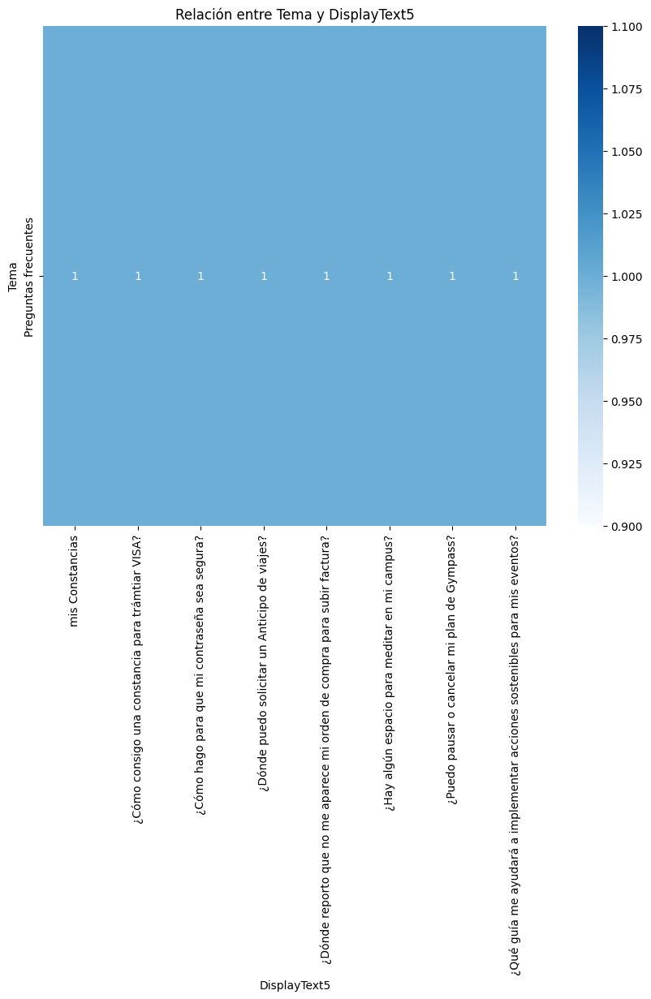


Tabla de contingencia entre 'Tema' y 'DisplayText6':
DisplayText6          Regresar  mis Viajes  \
Tema                                         
Preguntas frecuentes         5           1   

DisplayText6          ¿Cómo pido mi reembolso de gastos de viaje?   \
Tema                                                                 
Preguntas frecuentes                                             1   

DisplayText6          ¿Cómo puedo pedir una sala de conferencias?  
Tema                                                               
Preguntas frecuentes                                            1  


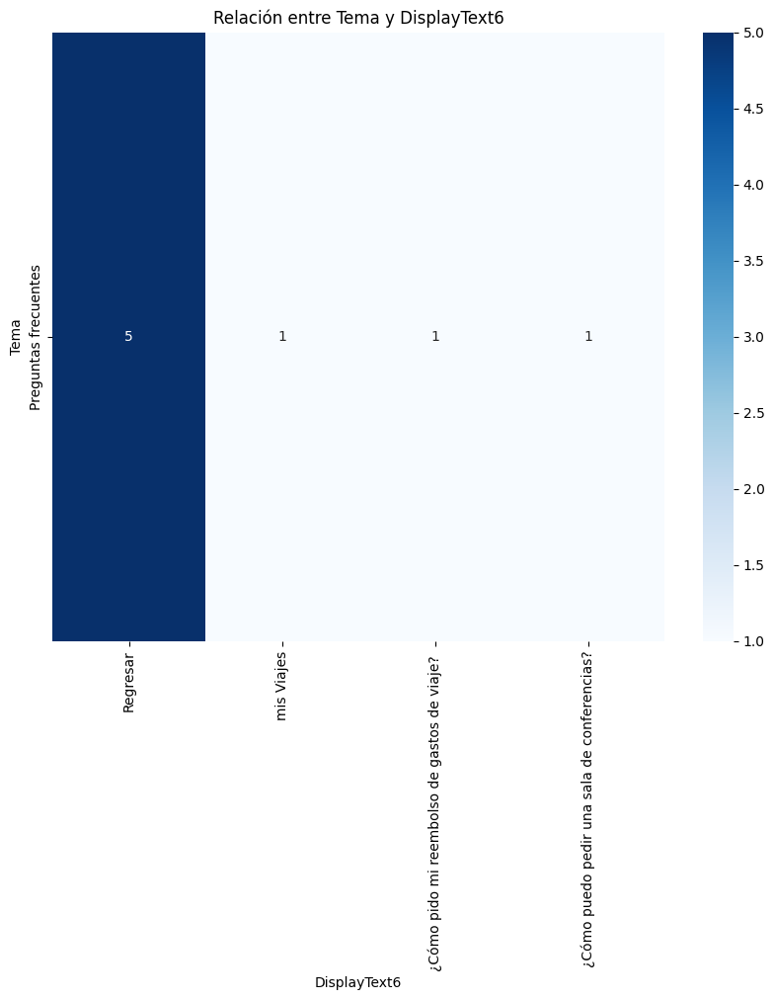


Tabla de contingencia entre 'Tema' y 'DisplayText7':
DisplayText7          Bienestar y Flexibilidad  Regresar
Tema                                                    
Preguntas frecuentes                         1         2


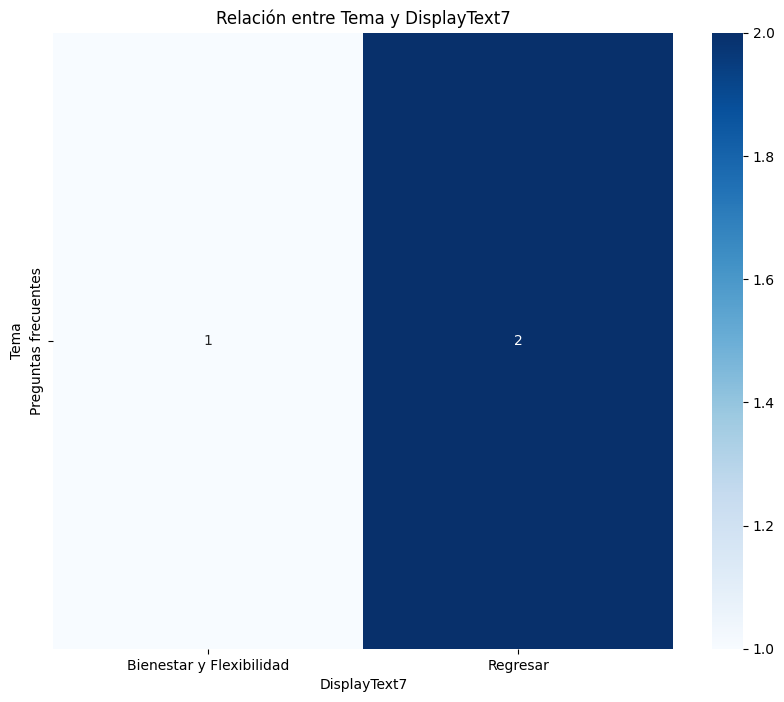


Tabla de contingencia entre 'Tema' y 'DisplayText8':
DisplayText8          Regresar
Tema                          
Preguntas frecuentes         1


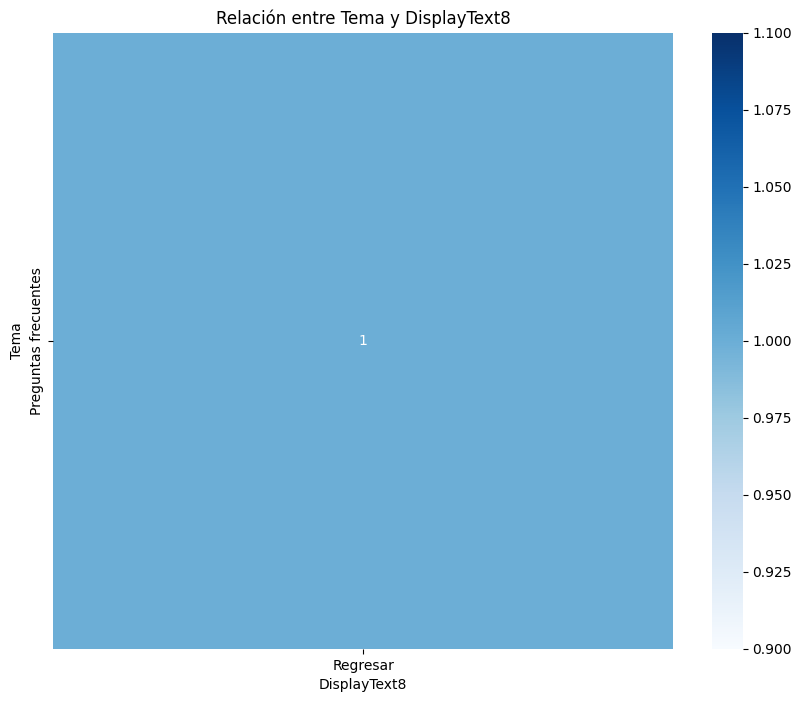


Tabla de contingencia entre 'Subtema' y 'Audiencia':
Audiencia        pregfreq
Subtema                  
Bienestar               6
Ciberseguridad          6
Eventos                 7
Gympass                 6
Mis Constancias         5
Ninguna                 1
Otros temas             1
Regresar                1
mis Compras             6
mis Constancias         1
mis Viajes              7


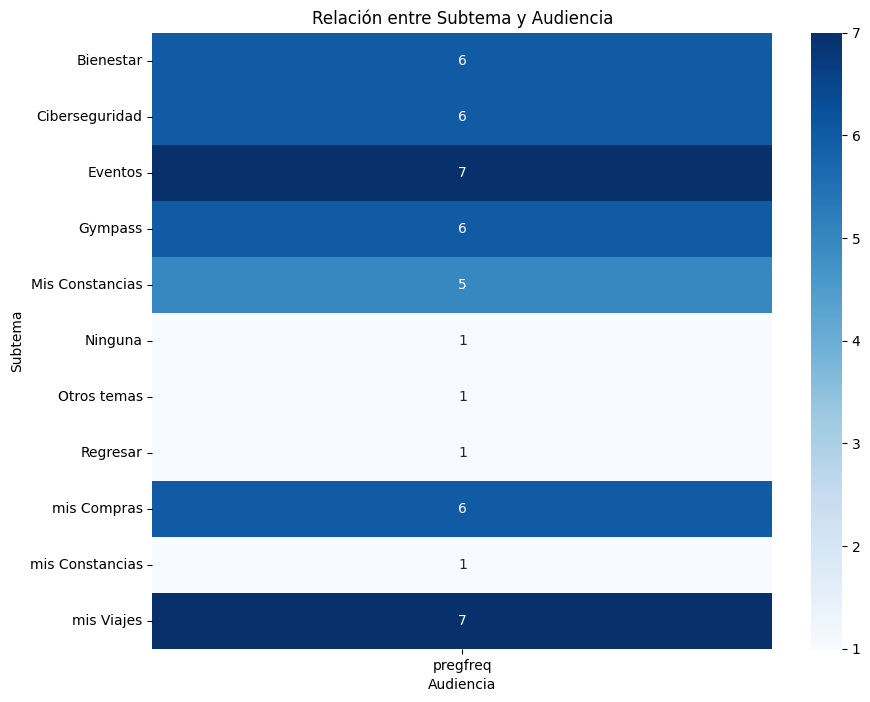


Tabla de contingencia entre 'Subtema' y 'DisplayText1':
DisplayText1     Ayuda con una cotización  Gympass  \
Subtema                                              
Bienestar                               0        0   
Ciberseguridad                          0        0   
Eventos                                 0        0   
Gympass                                 0        0   
Otros temas                             0        1   
mis Compras                             1        0   
mis Constancias                         0        0   
mis Viajes                              0        0   

DisplayText1     ¿Cómo instalo el antivirus en mi computadora?  \
Subtema                                                          
Bienestar                                                    0   
Ciberseguridad                                               1   
Eventos                                                      0   
Gympass                                                      0   
Otros 

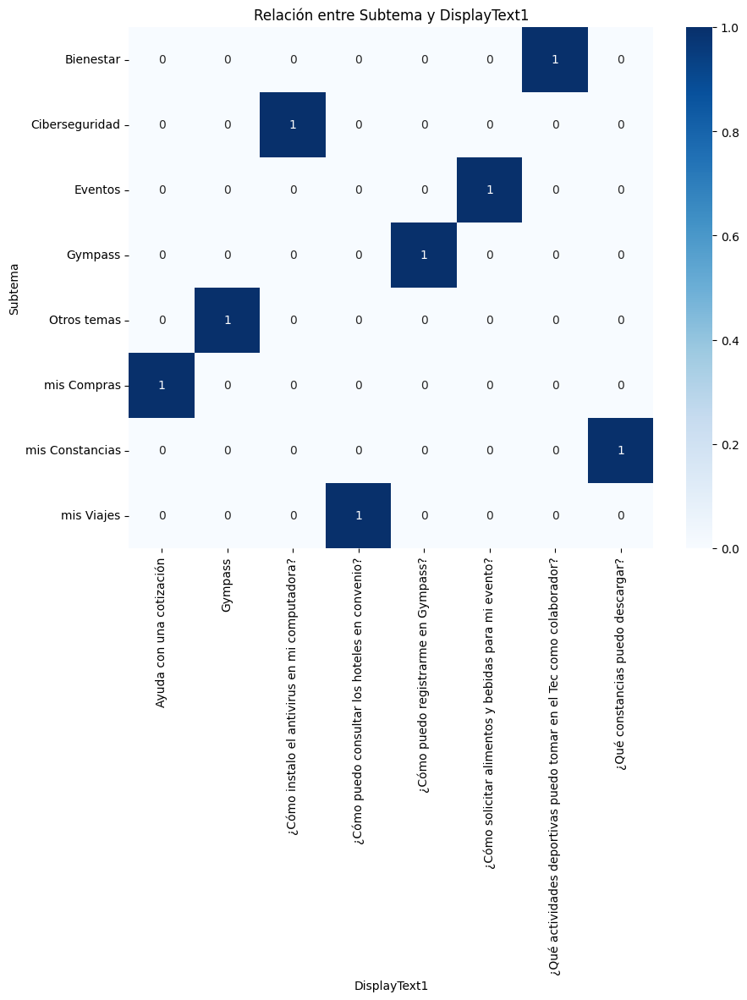


Tabla de contingencia entre 'Subtema' y 'DisplayText2':
DisplayText2     Ciberseguridad  \
Subtema                           
Bienestar                     0   
Ciberseguridad                0   
Eventos                       0   
Gympass                       0   
Otros temas                   1   
mis Compras                   0   
mis Constancias               0   
mis Viajes                    0   

DisplayText2     ¿Cuál es la guía de devolución de sobrantes de mis viajes?  \
Subtema                                                                       
Bienestar                                                        0            
Ciberseguridad                                                   0            
Eventos                                                          0            
Gympass                                                          0            
Otros temas                                                      0            
mis Compras                            

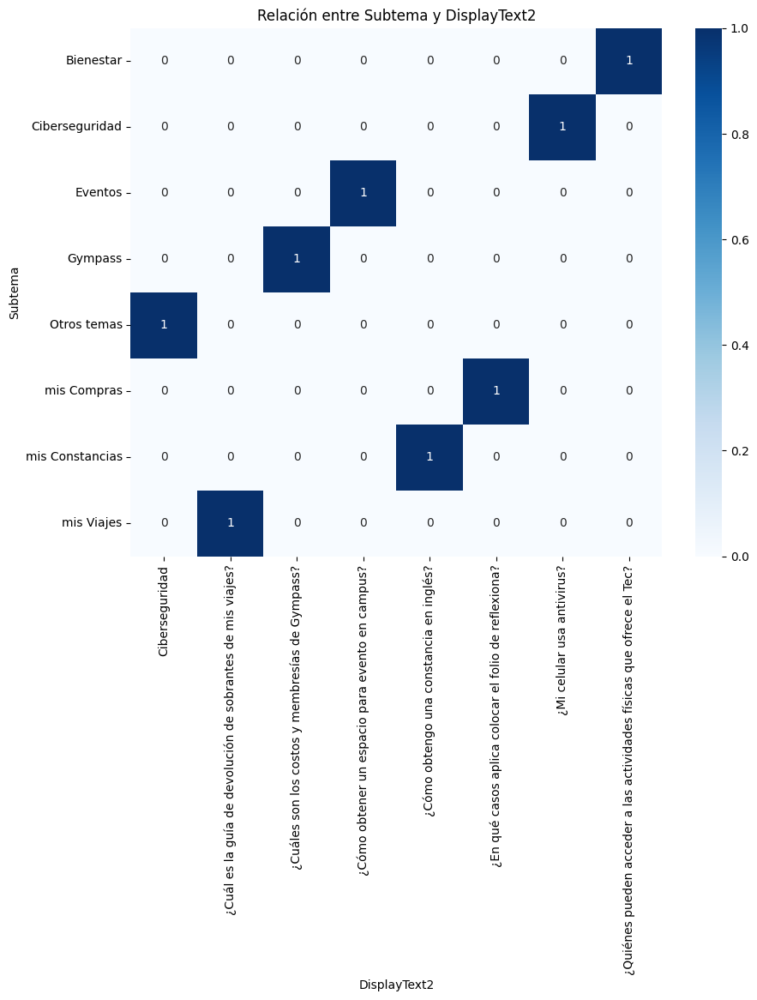


Tabla de contingencia entre 'Subtema' y 'DisplayText3':
DisplayText3     mis Compras  ¿Cómo activo el Uber empresarial?  \
Subtema                                                           
Bienestar                  0                                  0   
Ciberseguridad             0                                  0   
Eventos                    0                                  0   
Gympass                    0                                  0   
Otros temas                1                                  0   
mis Compras                0                                  0   
mis Constancias            0                                  0   
mis Viajes                 0                                  1   

DisplayText3     ¿Cómo consigo la constancia de impuestos de mis ingresos?  \
Subtema                                                                      
Bienestar                                                        0           
Ciberseguridad                        

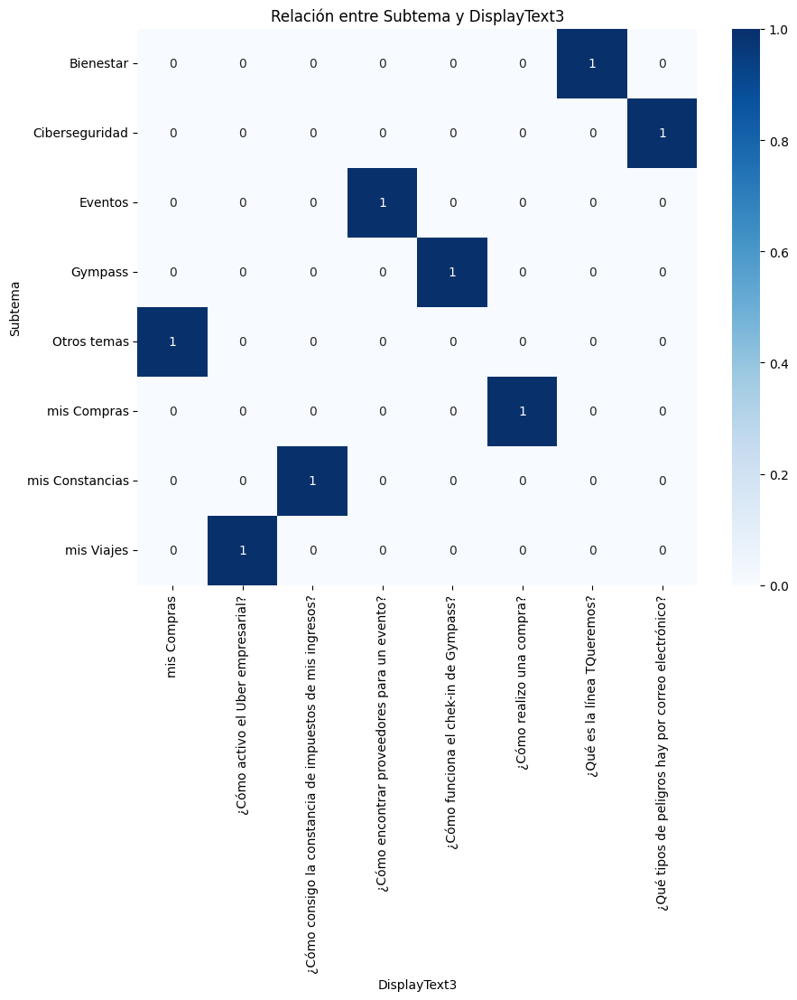


Tabla de contingencia entre 'Subtema' y 'DisplayText4':
DisplayText4     Eventos  \
Subtema                    
Bienestar              0   
Ciberseguridad         0   
Eventos                0   
Gympass                0   
Otros temas            1   
mis Compras            0   
mis Constancias        0   
mis Viajes             0   

DisplayText4     ¿Cuáles son los requisitos para que mi evento sea inclusivo?  \
Subtema                                                                         
Bienestar                                                        0              
Ciberseguridad                                                   0              
Eventos                                                          1              
Gympass                                                          0              
Otros temas                                                      0              
mis Compras                                                      0              
mis Constancia

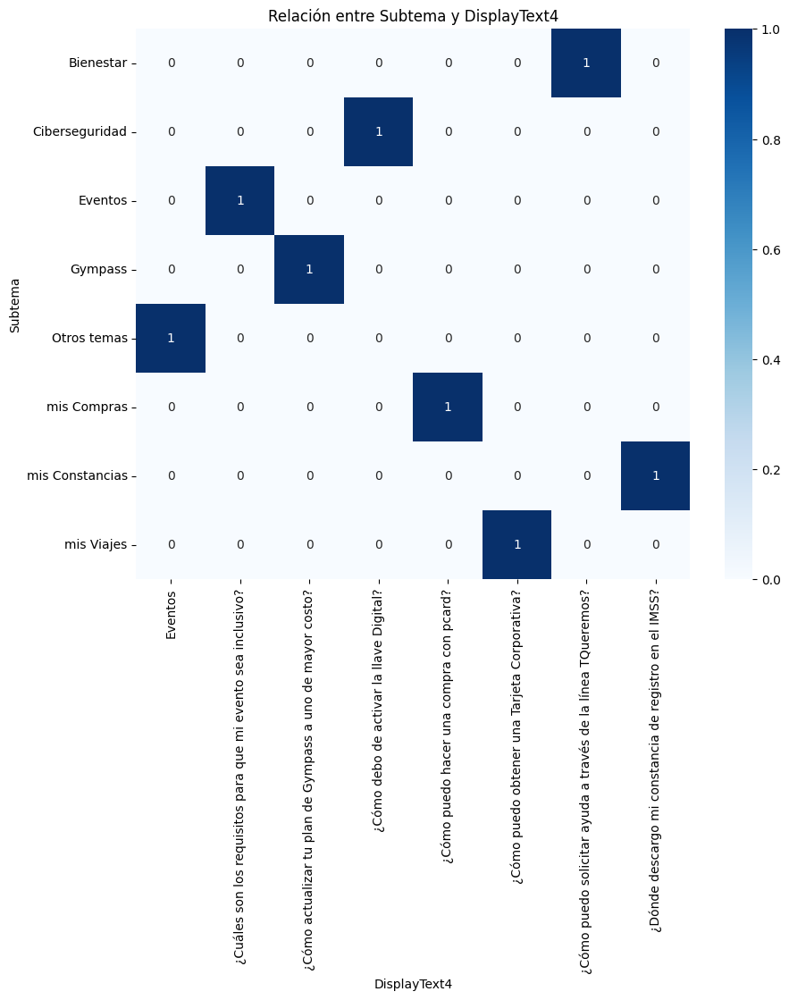


Tabla de contingencia entre 'Subtema' y 'DisplayText5':
DisplayText5     mis Constancias  \
Subtema                            
Bienestar                      0   
Ciberseguridad                 0   
Eventos                        0   
Gympass                        0   
Otros temas                    1   
mis Compras                    0   
mis Constancias                0   
mis Viajes                     0   

DisplayText5     ¿Cómo consigo una constancia para trámtiar VISA?  \
Subtema                                                             
Bienestar                                                       0   
Ciberseguridad                                                  0   
Eventos                                                         0   
Gympass                                                         0   
Otros temas                                                     0   
mis Compras                                                     0   
mis Constancias               

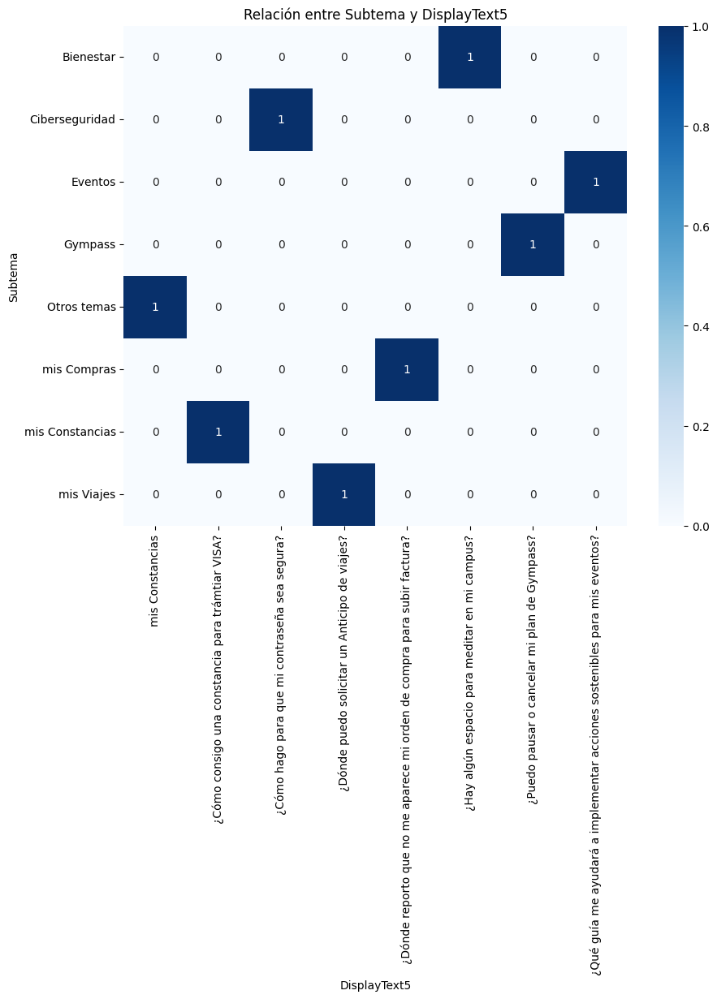


Tabla de contingencia entre 'Subtema' y 'DisplayText6':
DisplayText6     Regresar  mis Viajes  \
Subtema                                 
Bienestar               1           0   
Ciberseguridad          1           0   
Eventos                 0           0   
Gympass                 1           0   
Otros temas             0           1   
mis Compras             1           0   
mis Constancias         1           0   
mis Viajes              0           0   

DisplayText6     ¿Cómo pido mi reembolso de gastos de viaje?   \
Subtema                                                         
Bienestar                                                   0   
Ciberseguridad                                              0   
Eventos                                                     0   
Gympass                                                     0   
Otros temas                                                 0   
mis Compras                                                 0   
mis Constanc

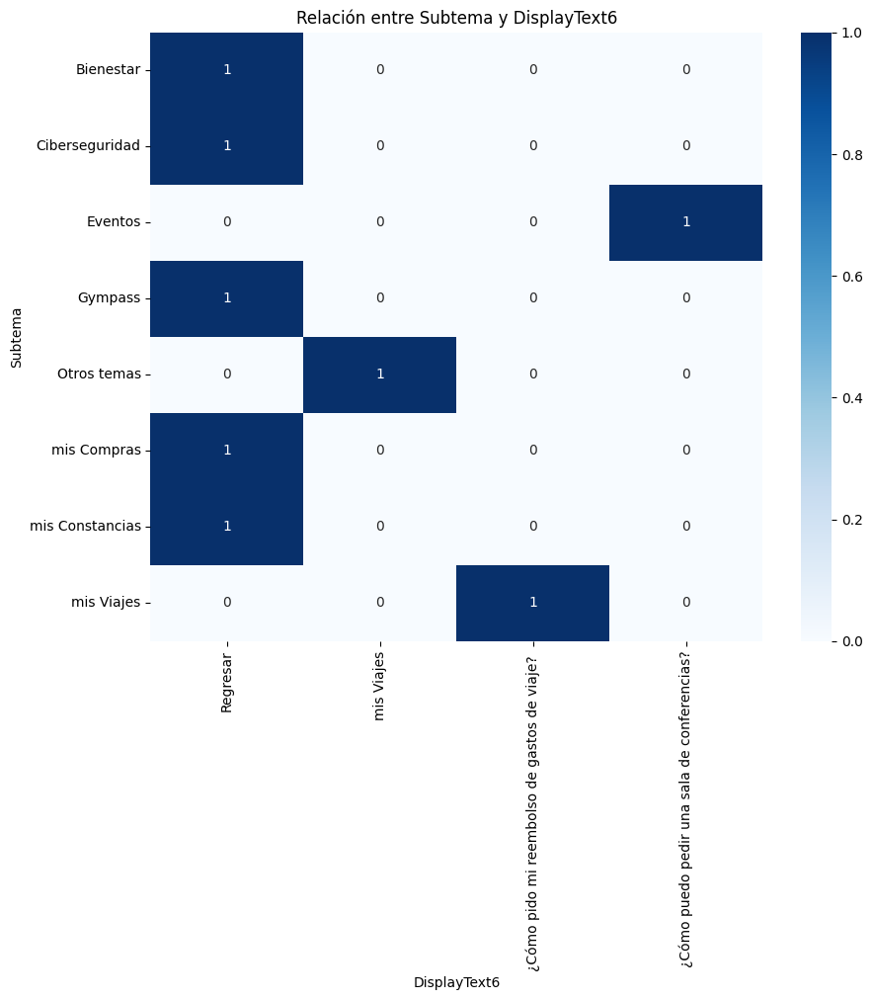


Tabla de contingencia entre 'Subtema' y 'DisplayText7':
DisplayText7  Bienestar y Flexibilidad  Regresar
Subtema                                         
Eventos                              0         1
Otros temas                          1         0
mis Viajes                           0         1


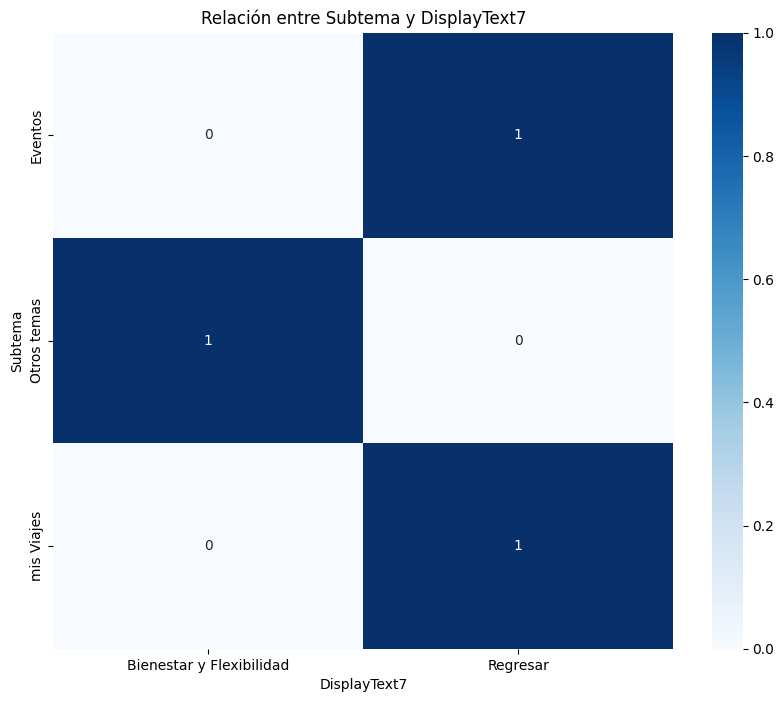


Tabla de contingencia entre 'Subtema' y 'DisplayText8':
DisplayText8  Regresar
Subtema               
Otros temas          1


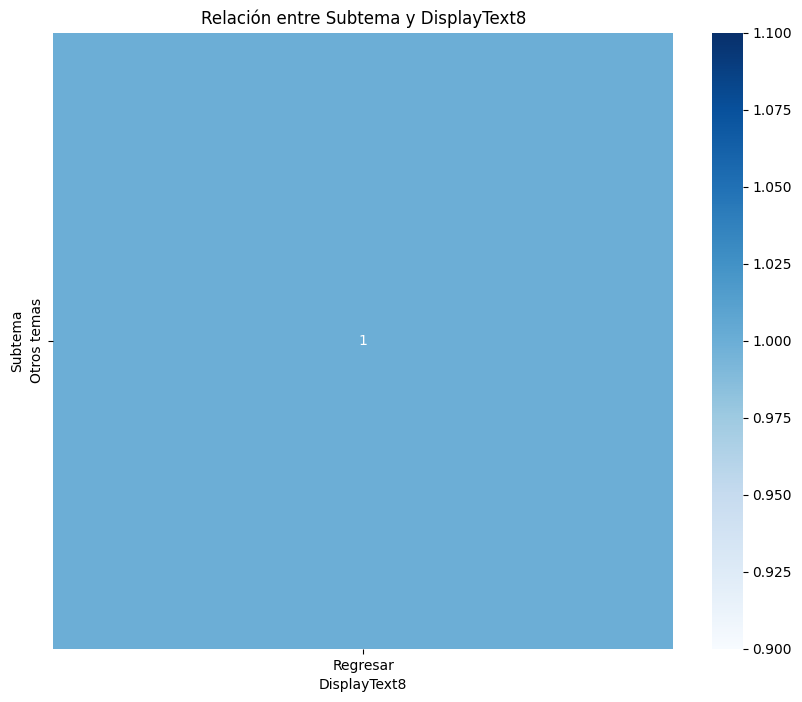


Tabla de contingencia entre 'Audiencia' y 'DisplayText1':
DisplayText1  Ayuda con una cotización  Gympass  \
Audiencia                                         
pregfreq                             1        1   

DisplayText1  ¿Cómo instalo el antivirus en mi computadora?  \
Audiencia                                                     
pregfreq                                                  1   

DisplayText1  ¿Cómo puedo consultar los hoteles en convenio?  \
Audiencia                                                      
pregfreq                                                   1   

DisplayText1  ¿Cómo puedo registrarme en Gympass?  \
Audiencia                                           
pregfreq                                        1   

DisplayText1  ¿Cómo solicitar alimentos y bebidas para mi evento?  \
Audiencia                                                           
pregfreq                                                      1     

DisplayText1  ¿Qué actividades depor

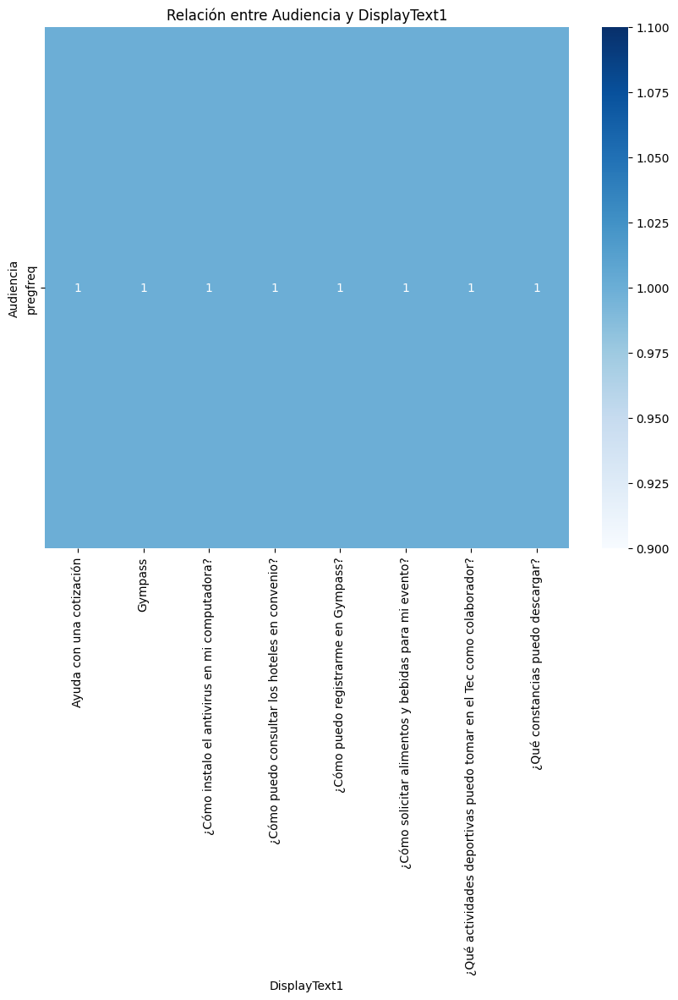


Tabla de contingencia entre 'Audiencia' y 'DisplayText2':
DisplayText2  Ciberseguridad  \
Audiencia                      
pregfreq                   1   

DisplayText2  ¿Cuál es la guía de devolución de sobrantes de mis viajes?  \
Audiencia                                                                  
pregfreq                                                      1            

DisplayText2  ¿Cuáles son los costos y membresías de Gympass?  \
Audiencia                                                       
pregfreq                                                    1   

DisplayText2  ¿Cómo obtener un espacio para evento en campus?  \
Audiencia                                                       
pregfreq                                                    1   

DisplayText2  ¿Cómo obtengo una constancia en inglés?  \
Audiencia                                               
pregfreq                                            1   

DisplayText2  ¿En qué casos aplica colocar el folio

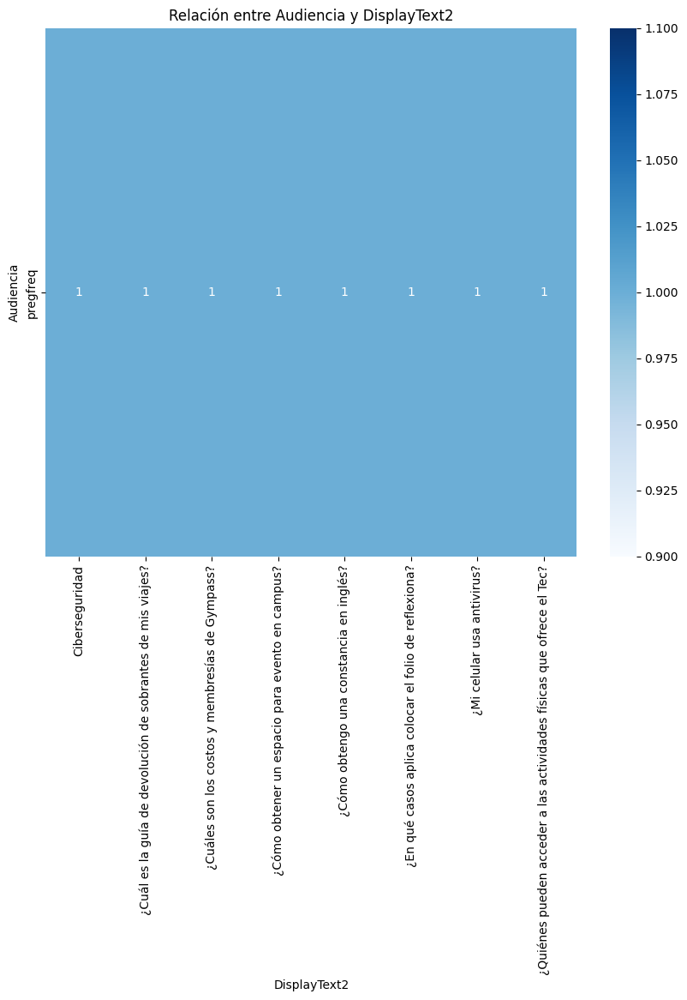


Tabla de contingencia entre 'Audiencia' y 'DisplayText3':
DisplayText3  mis Compras  ¿Cómo activo el Uber empresarial?  \
Audiencia                                                      
pregfreq                1                                  1   

DisplayText3  ¿Cómo consigo la constancia de impuestos de mis ingresos?  \
Audiencia                                                                 
pregfreq                                                      1           

DisplayText3  ¿Cómo encontrar proveedores para un evento?  \
Audiencia                                                   
pregfreq                                                1   

DisplayText3  ¿Cómo funciona el chek-in de Gympass?  \
Audiencia                                             
pregfreq                                          1   

DisplayText3  ¿Cómo realizo una compra?  ¿Qué es la línea TQueremos?  \
Audiencia                                                              
pregfreq                    

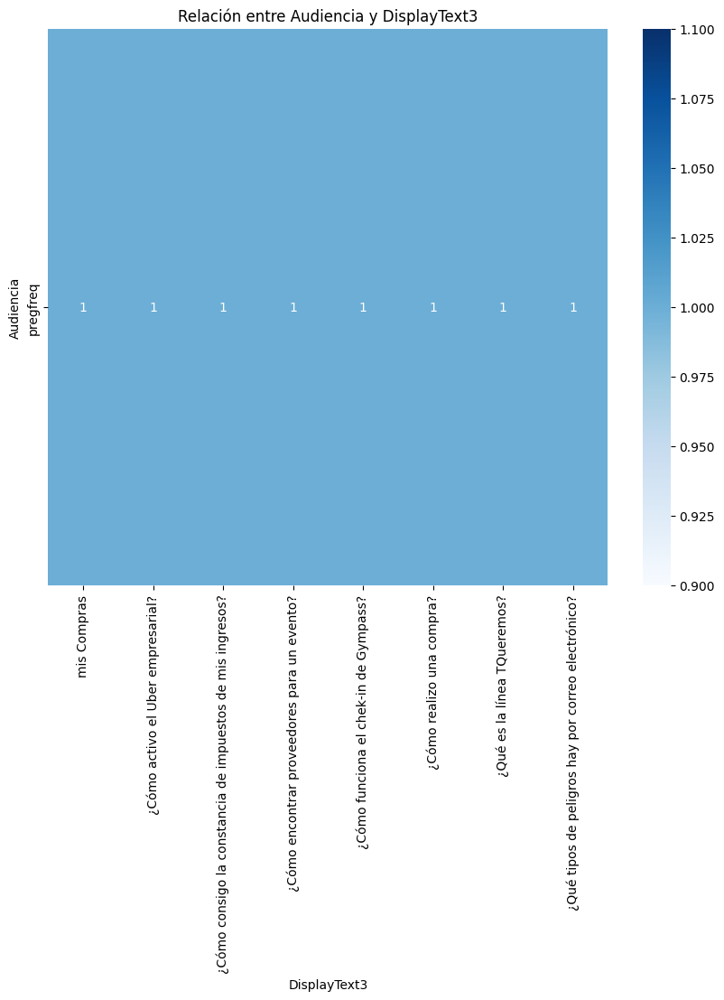


Tabla de contingencia entre 'Audiencia' y 'DisplayText4':
DisplayText4  Eventos  \
Audiencia               
pregfreq            1   

DisplayText4  ¿Cuáles son los requisitos para que mi evento sea inclusivo?  \
Audiencia                                                                    
pregfreq                                                      1              

DisplayText4  ¿Cómo actualizar tu plan de Gympass a uno de mayor costo?  \
Audiencia                                                                 
pregfreq                                                      1           

DisplayText4  ¿Cómo debo de activar la llave Digital?  \
Audiencia                                               
pregfreq                                            1   

DisplayText4  ¿Cómo puedo hacer una compra con pcard?  \
Audiencia                                               
pregfreq                                            1   

DisplayText4  ¿Cómo puedo obtener una Tarjeta Corporativa?  

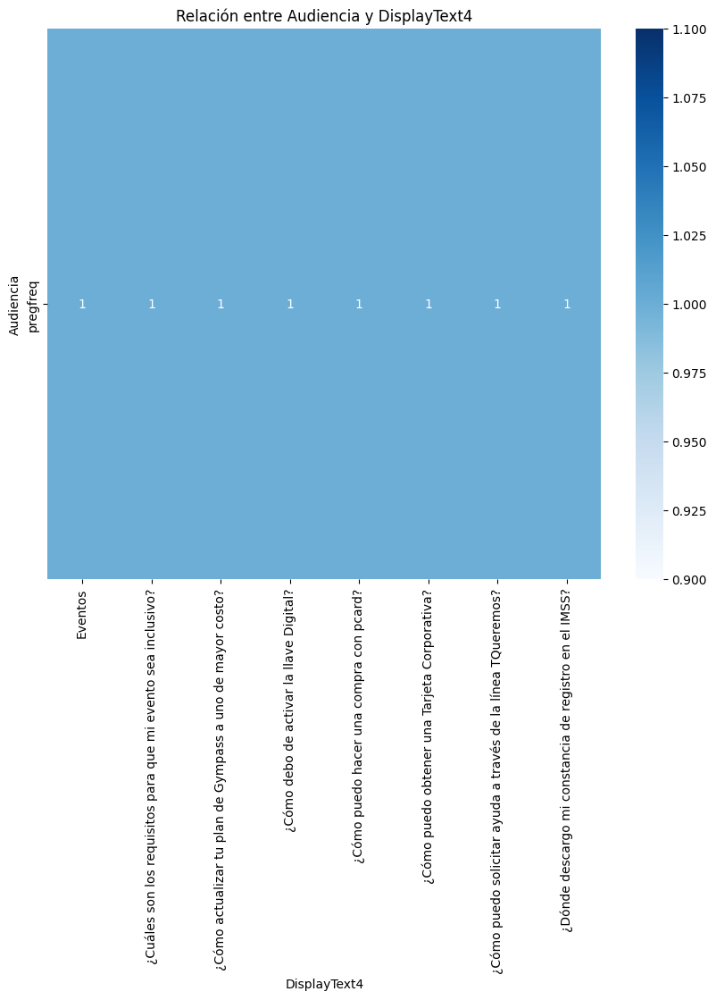


Tabla de contingencia entre 'Audiencia' y 'DisplayText5':
DisplayText5  mis Constancias  \
Audiencia                       
pregfreq                    1   

DisplayText5  ¿Cómo consigo una constancia para trámtiar VISA?  \
Audiencia                                                        
pregfreq                                                     1   

DisplayText5  ¿Cómo hago para que mi contraseña sea segura?  \
Audiencia                                                     
pregfreq                                                  1   

DisplayText5  ¿Dónde puedo solicitar un Anticipo de viajes?  \
Audiencia                                                     
pregfreq                                                  1   

DisplayText5  ¿Dónde reporto que no me aparece mi orden de compra para subir factura?  \
Audiencia                                                                               
pregfreq                                                      1                     

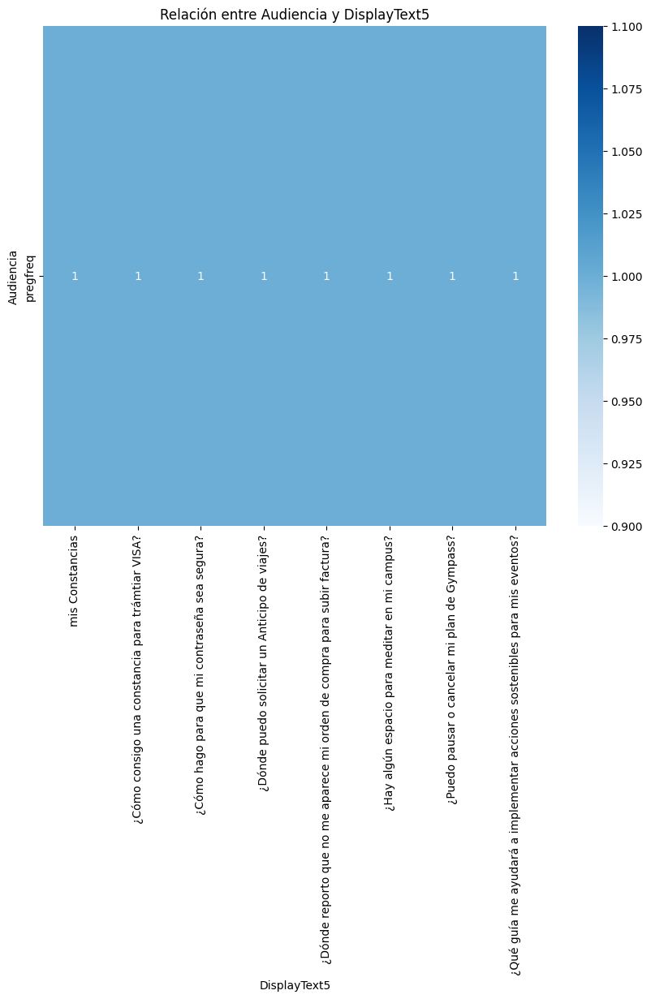


Tabla de contingencia entre 'Audiencia' y 'DisplayText6':
DisplayText6  Regresar  mis Viajes  \
Audiencia                            
pregfreq             5           1   

DisplayText6  ¿Cómo pido mi reembolso de gastos de viaje?   \
Audiencia                                                    
pregfreq                                                 1   

DisplayText6  ¿Cómo puedo pedir una sala de conferencias?  
Audiencia                                                  
pregfreq                                                1  


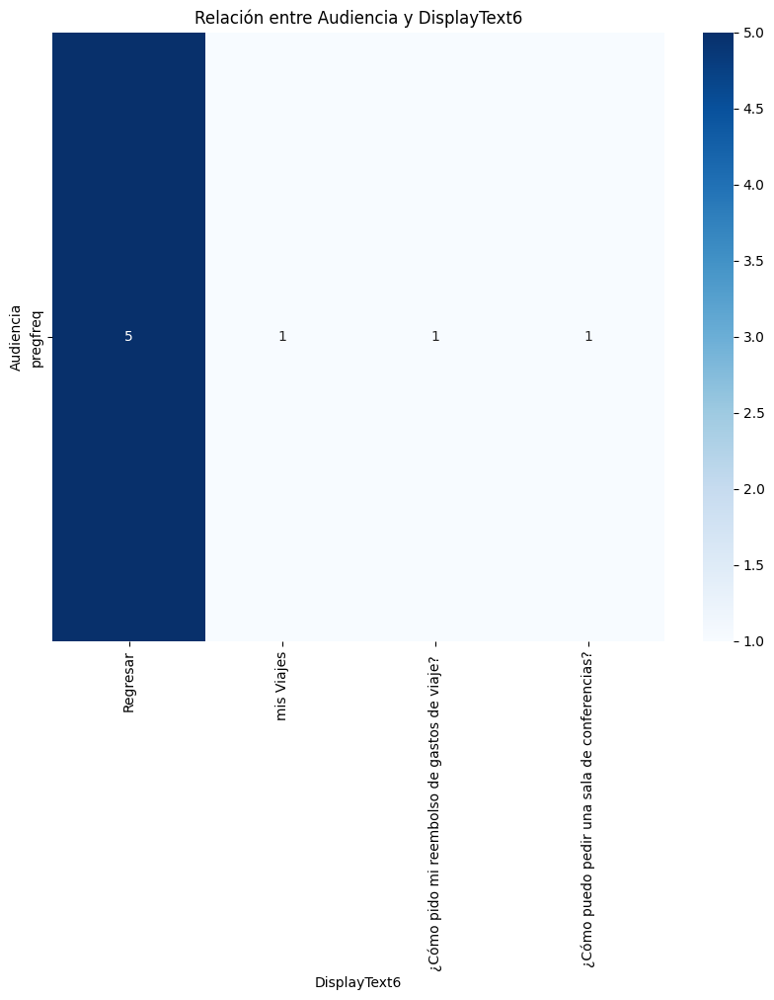


Tabla de contingencia entre 'Audiencia' y 'DisplayText7':
DisplayText7  Bienestar y Flexibilidad  Regresar
Audiencia                                       
pregfreq                             1         2


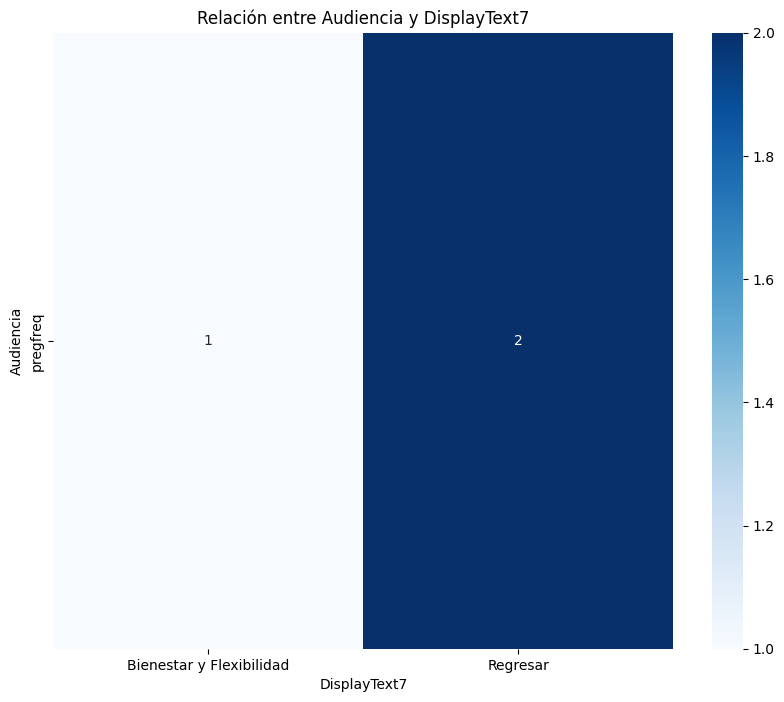


Tabla de contingencia entre 'Audiencia' y 'DisplayText8':
DisplayText8  Regresar
Audiencia             
pregfreq             1


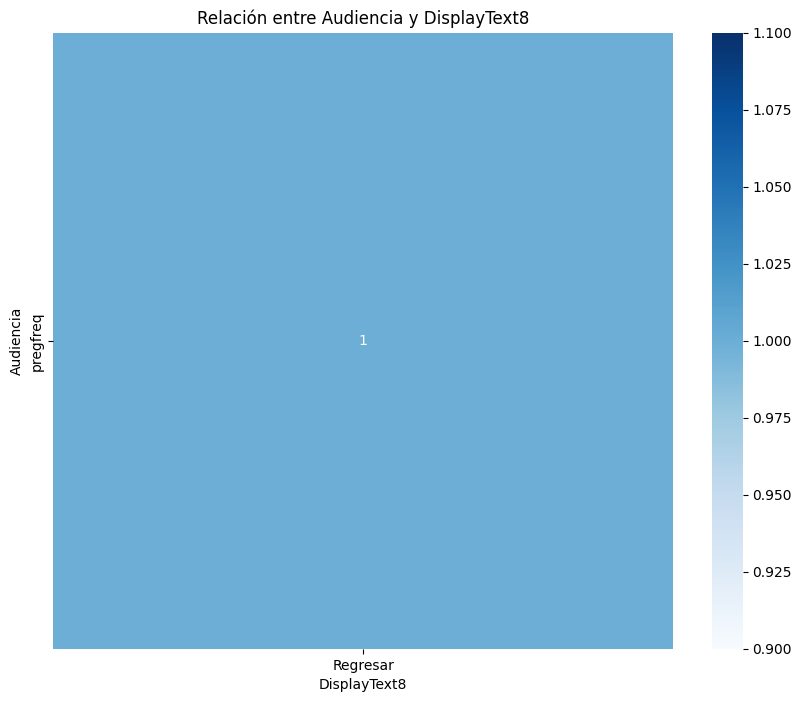


Tabla de contingencia entre 'DisplayText1' y 'DisplayText2':
DisplayText2                                        Ciberseguridad  \
DisplayText1                                                         
Ayuda con una cotización                                         0   
Gympass                                                          1   
¿Cómo instalo el antivirus en mi computadora?                    0   
¿Cómo puedo consultar los hoteles en convenio?                   0   
¿Cómo puedo registrarme en Gympass?                              0   
¿Cómo solicitar alimentos y bebidas para mi eve...               0   
¿Qué actividades deportivas puedo tomar en el T...               0   
¿Qué constancias puedo descargar?                                0   

DisplayText2                                        ¿Cuál es la guía de devolución de sobrantes de mis viajes?  \
DisplayText1                                                                                                     
Ayuda con

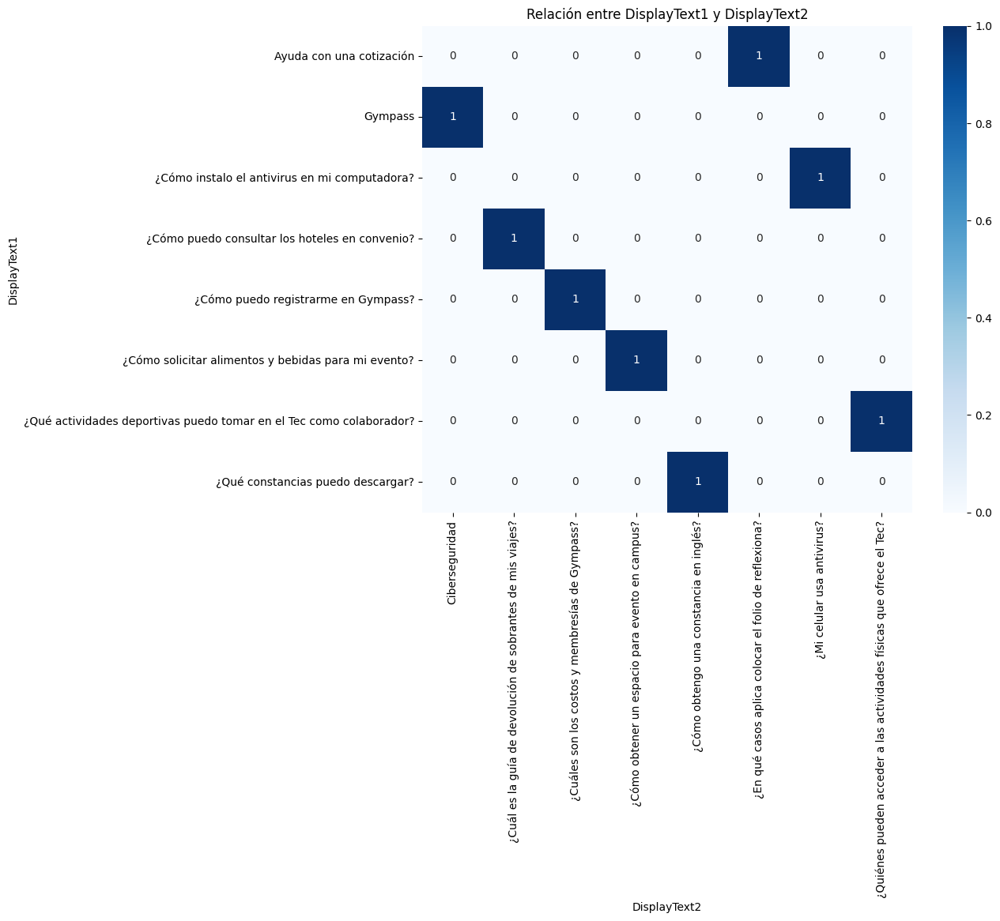


Tabla de contingencia entre 'DisplayText1' y 'DisplayText3':
DisplayText3                                        mis Compras  \
DisplayText1                                                      
Ayuda con una cotización                                      0   
Gympass                                                       1   
¿Cómo instalo el antivirus en mi computadora?                 0   
¿Cómo puedo consultar los hoteles en convenio?                0   
¿Cómo puedo registrarme en Gympass?                           0   
¿Cómo solicitar alimentos y bebidas para mi eve...            0   
¿Qué actividades deportivas puedo tomar en el T...            0   
¿Qué constancias puedo descargar?                             0   

DisplayText3                                        ¿Cómo activo el Uber empresarial?  \
DisplayText1                                                                            
Ayuda con una cotización                                                            0   


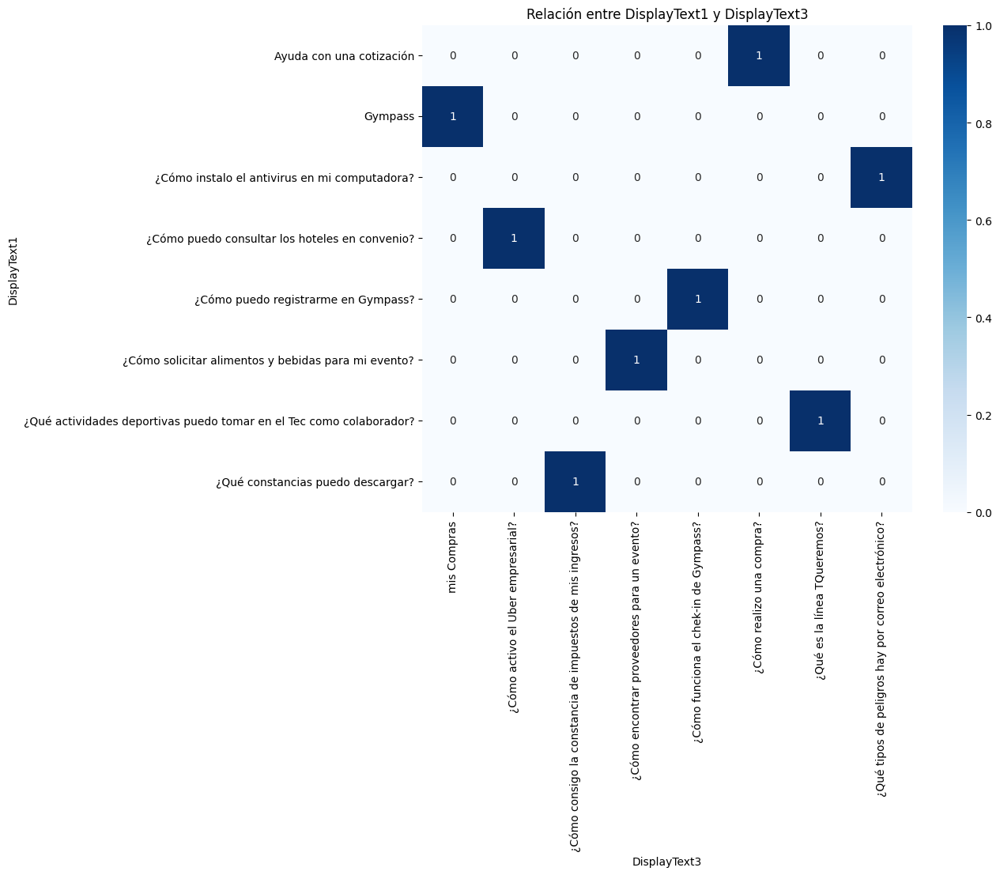


Tabla de contingencia entre 'DisplayText1' y 'DisplayText4':
DisplayText4                                        Eventos  \
DisplayText1                                                  
Ayuda con una cotización                                  0   
Gympass                                                   1   
¿Cómo instalo el antivirus en mi computadora?             0   
¿Cómo puedo consultar los hoteles en convenio?            0   
¿Cómo puedo registrarme en Gympass?                       0   
¿Cómo solicitar alimentos y bebidas para mi eve...        0   
¿Qué actividades deportivas puedo tomar en el T...        0   
¿Qué constancias puedo descargar?                         0   

DisplayText4                                        ¿Cuáles son los requisitos para que mi evento sea inclusivo?  \
DisplayText1                                                                                                       
Ayuda con una cotización                                                   

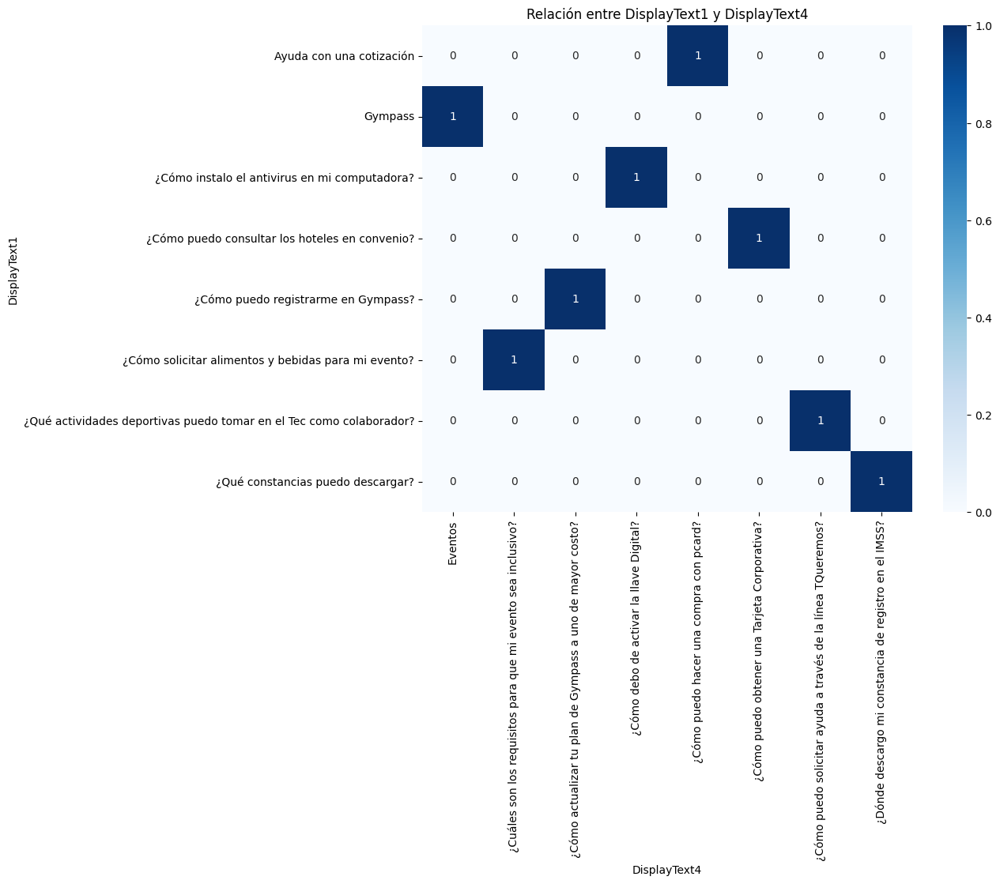


Tabla de contingencia entre 'DisplayText1' y 'DisplayText5':
DisplayText5                                        mis Constancias  \
DisplayText1                                                          
Ayuda con una cotización                                          0   
Gympass                                                           1   
¿Cómo instalo el antivirus en mi computadora?                     0   
¿Cómo puedo consultar los hoteles en convenio?                    0   
¿Cómo puedo registrarme en Gympass?                               0   
¿Cómo solicitar alimentos y bebidas para mi eve...                0   
¿Qué actividades deportivas puedo tomar en el T...                0   
¿Qué constancias puedo descargar?                                 0   

DisplayText5                                        ¿Cómo consigo una constancia para trámtiar VISA?  \
DisplayText1                                                                                           
Ayuda con una cotiz

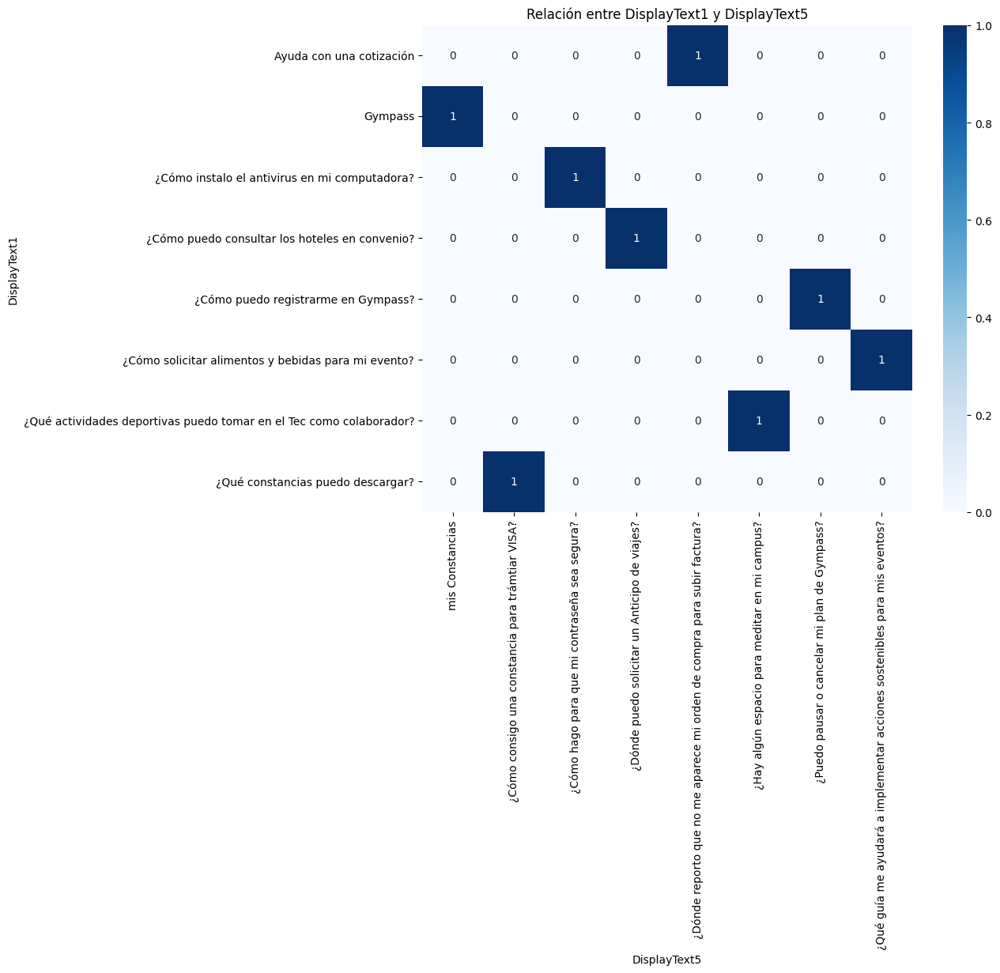


Tabla de contingencia entre 'DisplayText1' y 'DisplayText6':
DisplayText6                                        Regresar  mis Viajes  \
DisplayText1                                                               
Ayuda con una cotización                                   1           0   
Gympass                                                    0           1   
¿Cómo instalo el antivirus en mi computadora?              1           0   
¿Cómo puedo consultar los hoteles en convenio?             0           0   
¿Cómo puedo registrarme en Gympass?                        1           0   
¿Cómo solicitar alimentos y bebidas para mi eve...         0           0   
¿Qué actividades deportivas puedo tomar en el T...         1           0   
¿Qué constancias puedo descargar?                          1           0   

DisplayText6                                        ¿Cómo pido mi reembolso de gastos de viaje?   \
DisplayText1                                                                 

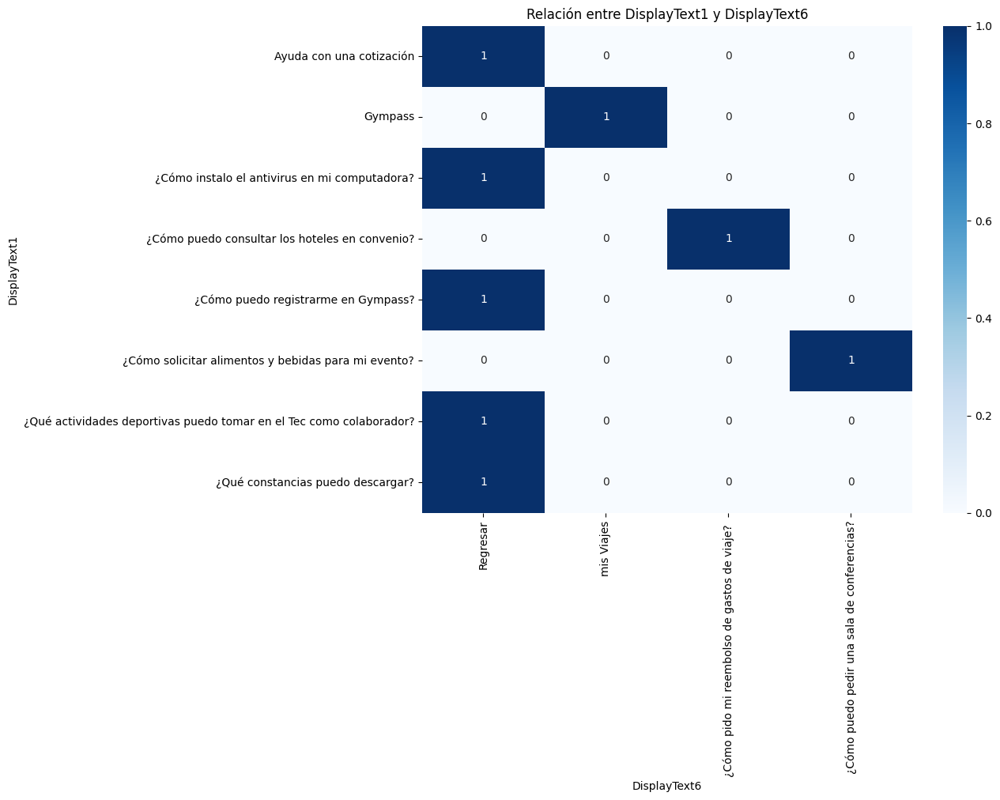


Tabla de contingencia entre 'DisplayText1' y 'DisplayText7':
DisplayText7                                        Bienestar y Flexibilidad  \
DisplayText1                                                                   
Gympass                                                                    1   
¿Cómo puedo consultar los hoteles en convenio?                             0   
¿Cómo solicitar alimentos y bebidas para mi eve...                         0   

DisplayText7                                        Regresar  
DisplayText1                                                  
Gympass                                                    0  
¿Cómo puedo consultar los hoteles en convenio?             1  
¿Cómo solicitar alimentos y bebidas para mi eve...         1  


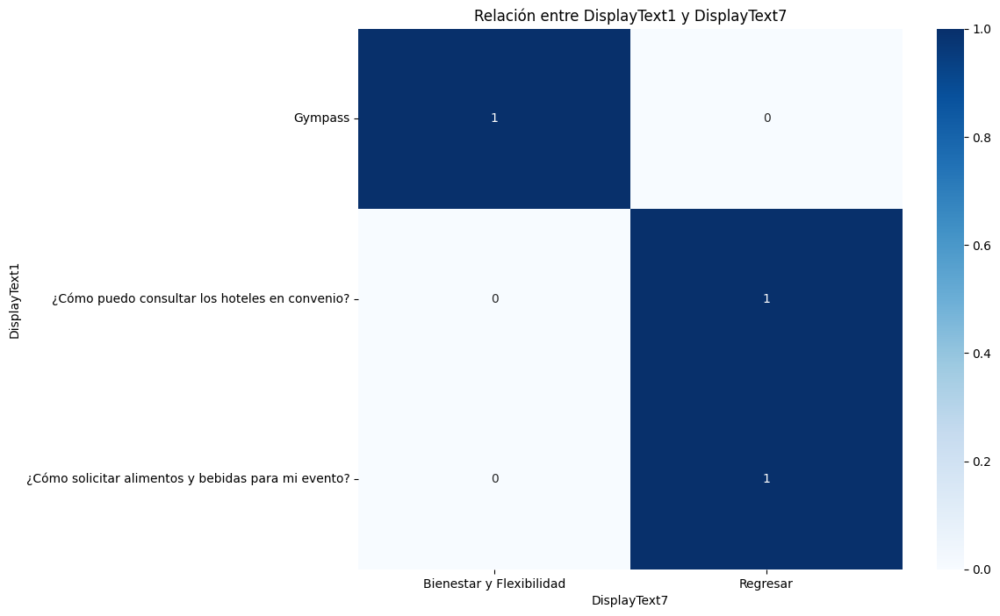


Tabla de contingencia entre 'DisplayText1' y 'DisplayText8':
DisplayText8  Regresar
DisplayText1          
Gympass              1


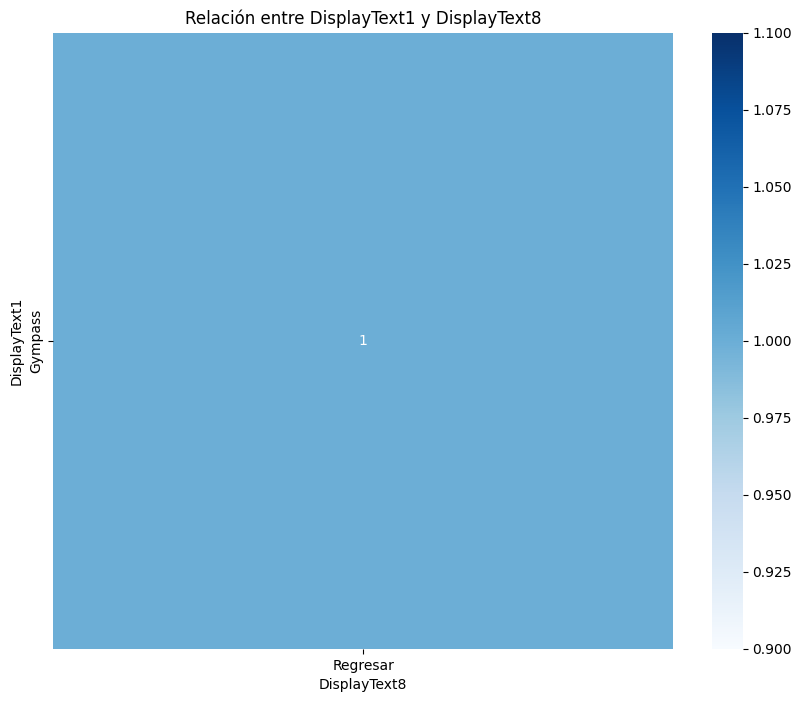


Tabla de contingencia entre 'DisplayText2' y 'DisplayText3':
DisplayText3                                        mis Compras  \
DisplayText2                                                      
Ciberseguridad                                                1   
¿Cuál es la guía de devolución de sobrantes de ...            0   
¿Cuáles son los costos y membresías de Gympass?               0   
¿Cómo obtener un espacio para evento en campus?               0   
¿Cómo obtengo una constancia en inglés?                       0   
¿En qué casos aplica colocar el folio de reflex...            0   
¿Mi celular usa antivirus?                                    0   
¿Quiénes pueden acceder a las actividades físic...            0   

DisplayText3                                        ¿Cómo activo el Uber empresarial?  \
DisplayText2                                                                            
Ciberseguridad                                                                      0   


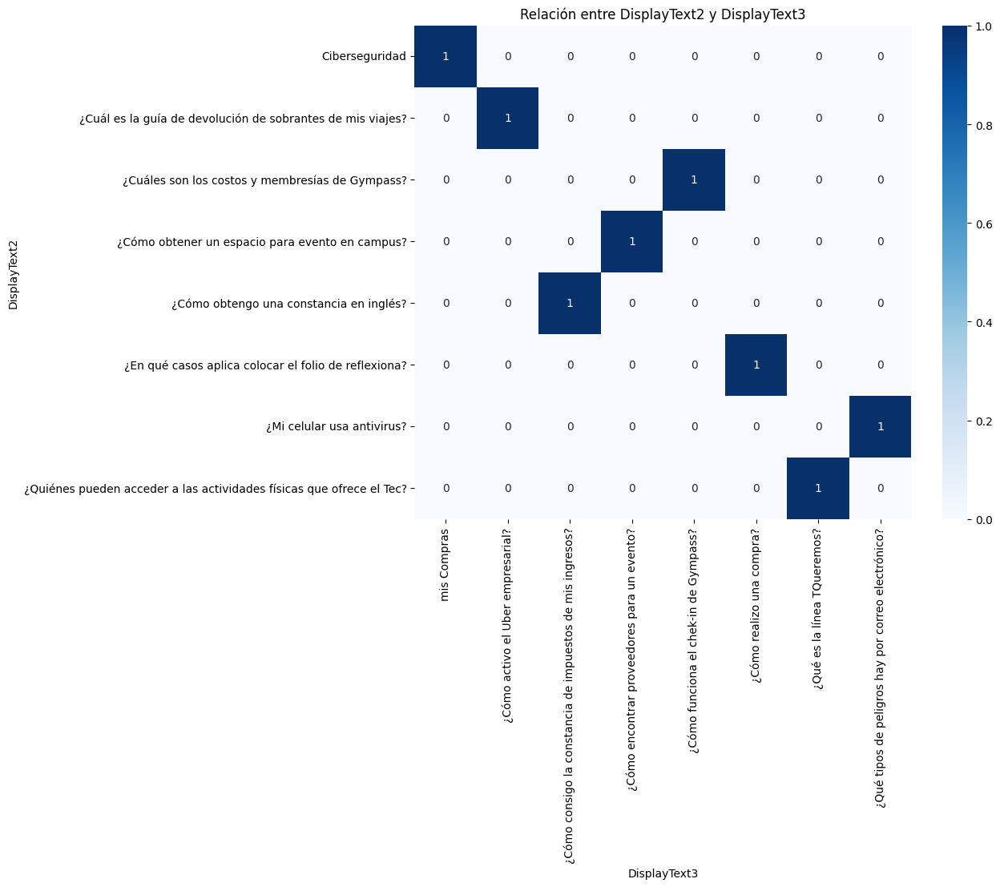


Tabla de contingencia entre 'DisplayText2' y 'DisplayText4':
DisplayText4                                        Eventos  \
DisplayText2                                                  
Ciberseguridad                                            1   
¿Cuál es la guía de devolución de sobrantes de ...        0   
¿Cuáles son los costos y membresías de Gympass?           0   
¿Cómo obtener un espacio para evento en campus?           0   
¿Cómo obtengo una constancia en inglés?                   0   
¿En qué casos aplica colocar el folio de reflex...        0   
¿Mi celular usa antivirus?                                0   
¿Quiénes pueden acceder a las actividades físic...        0   

DisplayText4                                        ¿Cuáles son los requisitos para que mi evento sea inclusivo?  \
DisplayText2                                                                                                       
Ciberseguridad                                                             

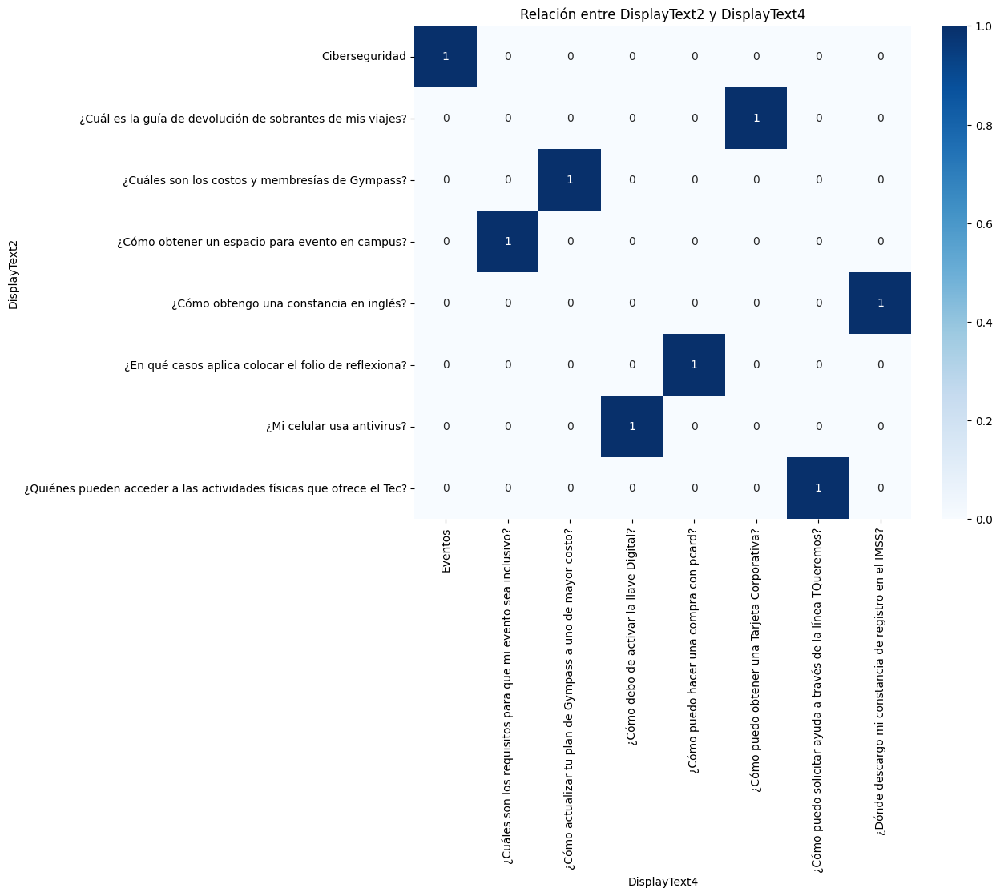


Tabla de contingencia entre 'DisplayText2' y 'DisplayText5':
DisplayText5                                        mis Constancias  \
DisplayText2                                                          
Ciberseguridad                                                    1   
¿Cuál es la guía de devolución de sobrantes de ...                0   
¿Cuáles son los costos y membresías de Gympass?                   0   
¿Cómo obtener un espacio para evento en campus?                   0   
¿Cómo obtengo una constancia en inglés?                           0   
¿En qué casos aplica colocar el folio de reflex...                0   
¿Mi celular usa antivirus?                                        0   
¿Quiénes pueden acceder a las actividades físic...                0   

DisplayText5                                        ¿Cómo consigo una constancia para trámtiar VISA?  \
DisplayText2                                                                                           
Ciberseguridad     

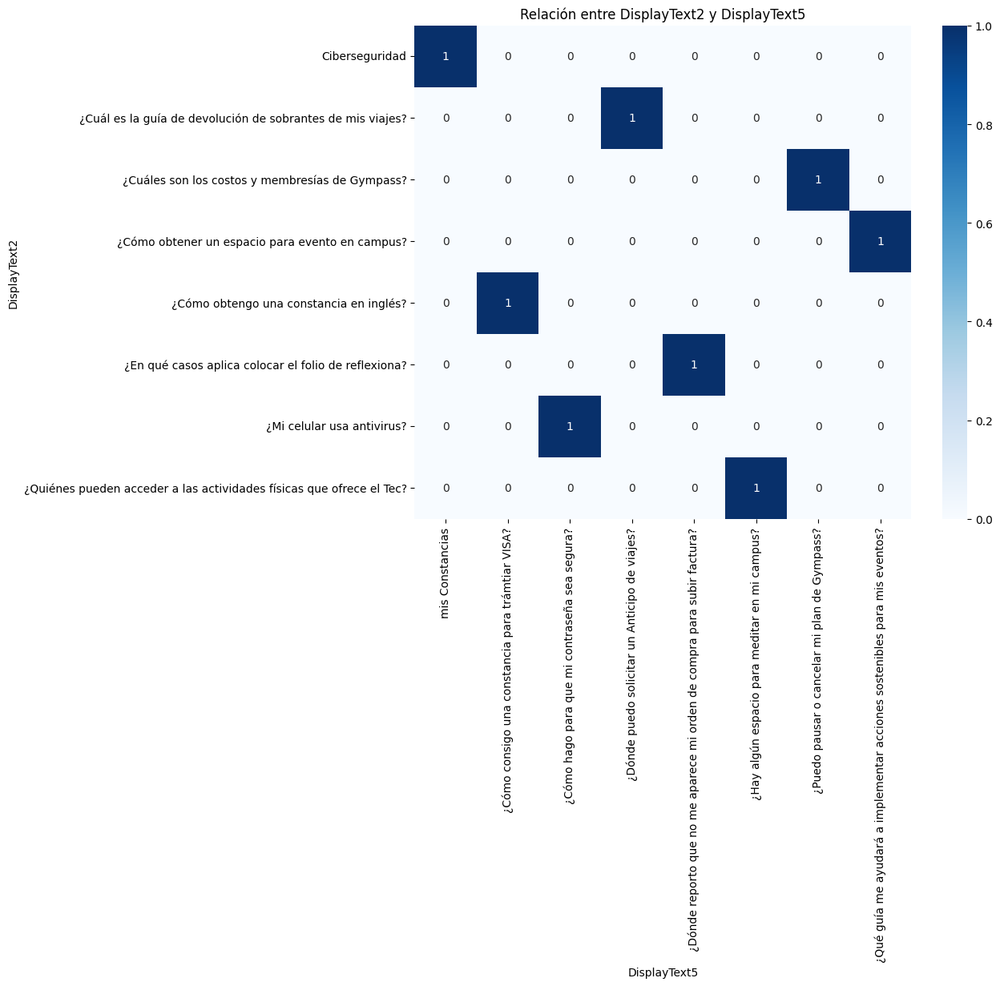


Tabla de contingencia entre 'DisplayText2' y 'DisplayText6':
DisplayText6                                        Regresar  mis Viajes  \
DisplayText2                                                               
Ciberseguridad                                             0           1   
¿Cuál es la guía de devolución de sobrantes de ...         0           0   
¿Cuáles son los costos y membresías de Gympass?            1           0   
¿Cómo obtener un espacio para evento en campus?            0           0   
¿Cómo obtengo una constancia en inglés?                    1           0   
¿En qué casos aplica colocar el folio de reflex...         1           0   
¿Mi celular usa antivirus?                                 1           0   
¿Quiénes pueden acceder a las actividades físic...         1           0   

DisplayText6                                        ¿Cómo pido mi reembolso de gastos de viaje?   \
DisplayText2                                                                 

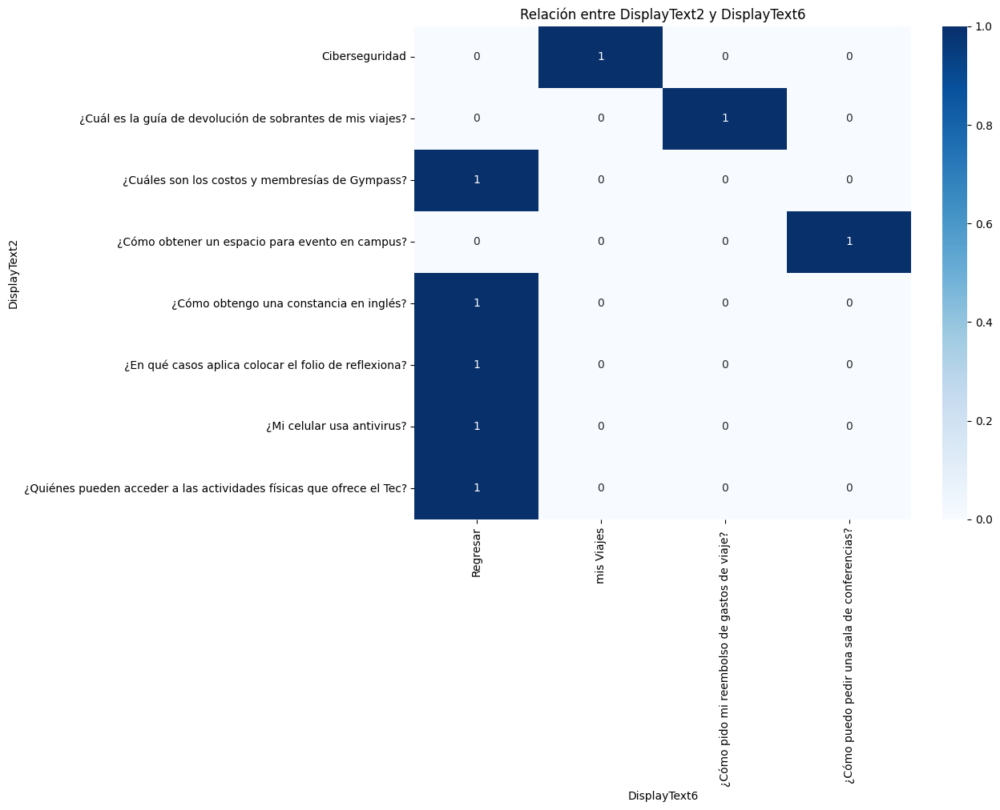


Tabla de contingencia entre 'DisplayText2' y 'DisplayText7':
DisplayText7                                        Bienestar y Flexibilidad  \
DisplayText2                                                                   
Ciberseguridad                                                             1   
¿Cuál es la guía de devolución de sobrantes de ...                         0   
¿Cómo obtener un espacio para evento en campus?                            0   

DisplayText7                                        Regresar  
DisplayText2                                                  
Ciberseguridad                                             0  
¿Cuál es la guía de devolución de sobrantes de ...         1  
¿Cómo obtener un espacio para evento en campus?            1  


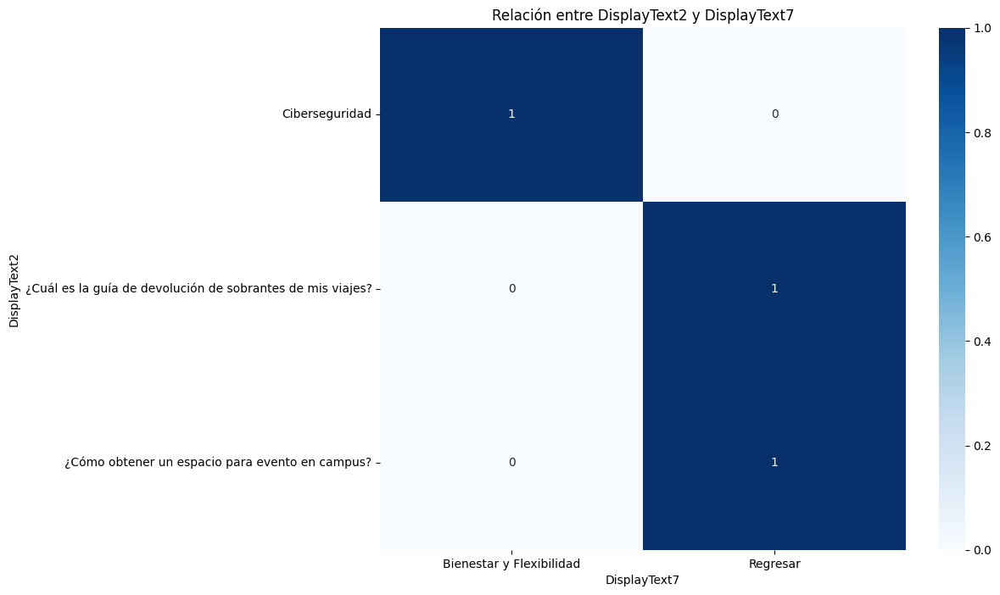


Tabla de contingencia entre 'DisplayText2' y 'DisplayText8':
DisplayText8    Regresar
DisplayText2            
Ciberseguridad         1


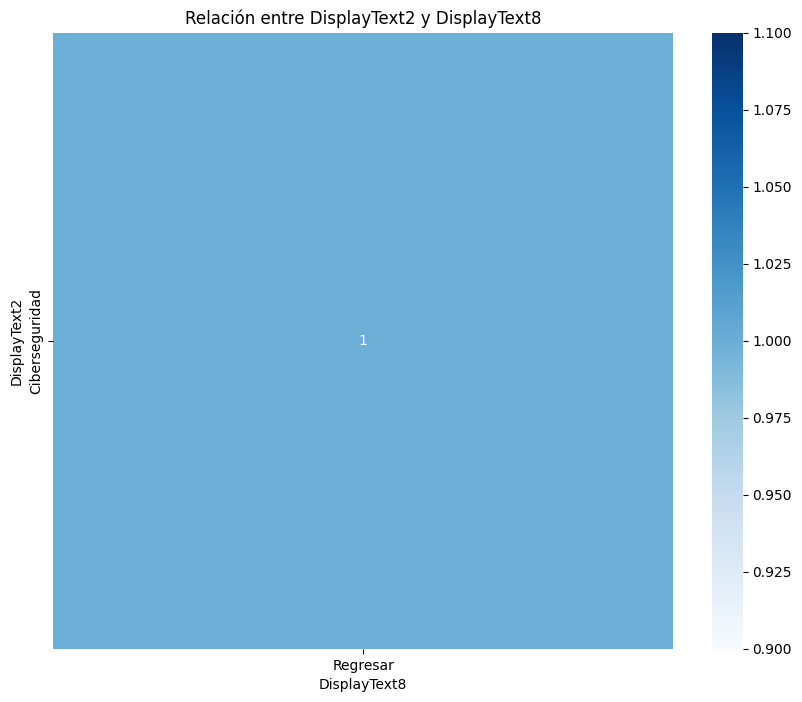


Tabla de contingencia entre 'DisplayText3' y 'DisplayText4':
DisplayText4                                        Eventos  \
DisplayText3                                                  
mis Compras                                               1   
¿Cómo activo el Uber empresarial?                         0   
¿Cómo consigo la constancia de impuestos de mis...        0   
¿Cómo encontrar proveedores para un evento?               0   
¿Cómo funciona el chek-in de Gympass?                     0   
¿Cómo realizo una compra?                                 0   
¿Qué es la línea TQueremos?                               0   
¿Qué tipos de peligros hay por correo electrónico?        0   

DisplayText4                                        ¿Cuáles son los requisitos para que mi evento sea inclusivo?  \
DisplayText3                                                                                                       
mis Compras                                                                

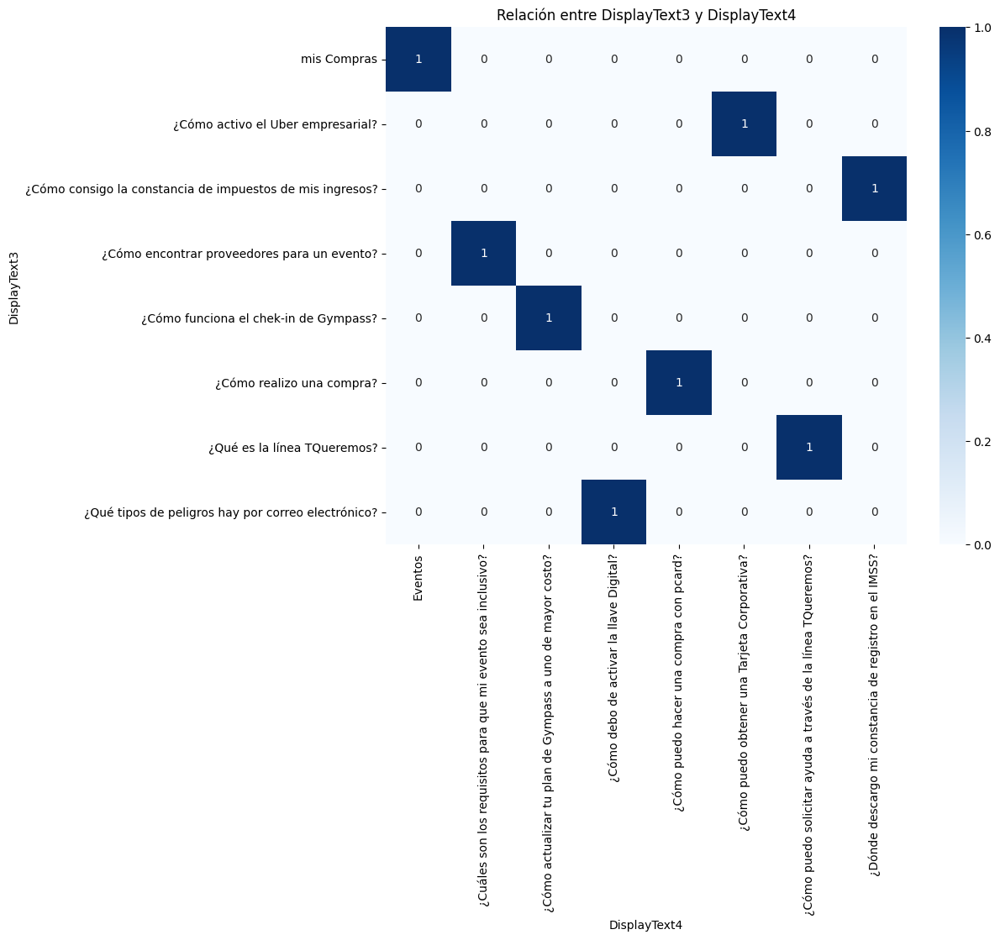


Tabla de contingencia entre 'DisplayText3' y 'DisplayText5':
DisplayText5                                        mis Constancias  \
DisplayText3                                                          
mis Compras                                                       1   
¿Cómo activo el Uber empresarial?                                 0   
¿Cómo consigo la constancia de impuestos de mis...                0   
¿Cómo encontrar proveedores para un evento?                       0   
¿Cómo funciona el chek-in de Gympass?                             0   
¿Cómo realizo una compra?                                         0   
¿Qué es la línea TQueremos?                                       0   
¿Qué tipos de peligros hay por correo electrónico?                0   

DisplayText5                                        ¿Cómo consigo una constancia para trámtiar VISA?  \
DisplayText3                                                                                           
mis Compras        

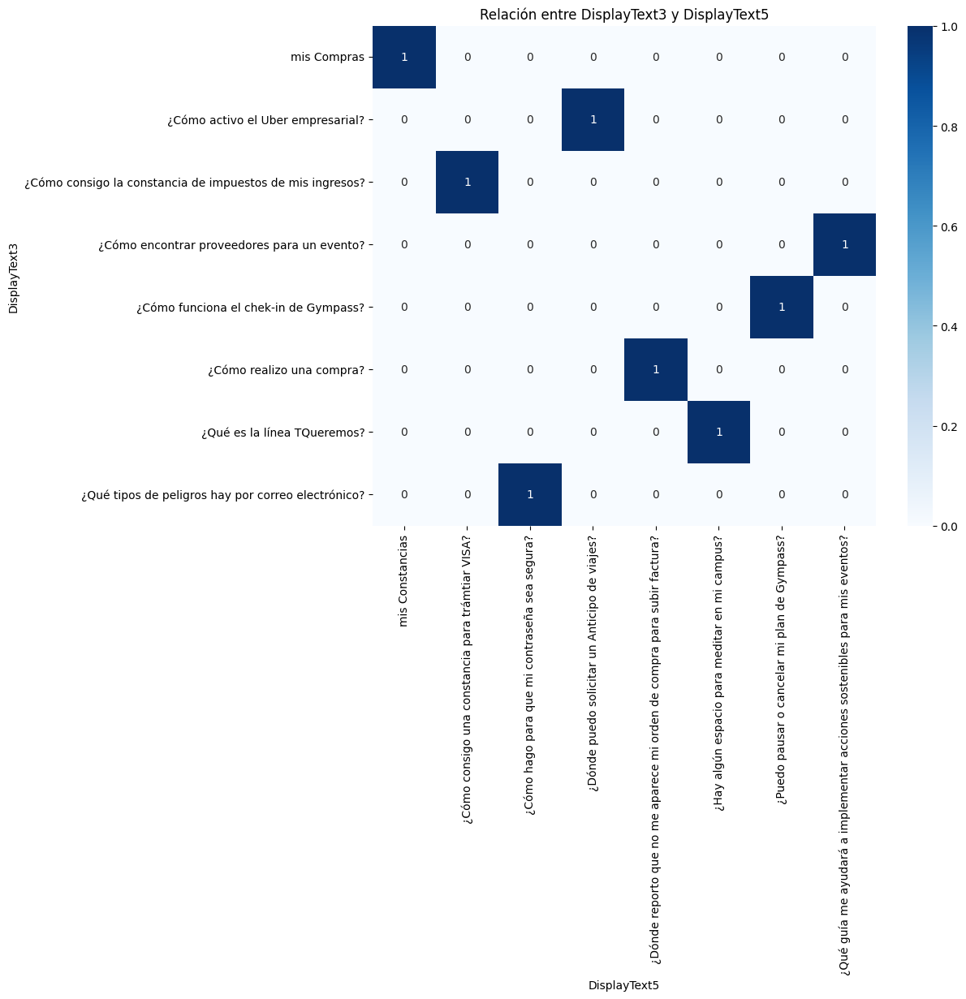


Tabla de contingencia entre 'DisplayText3' y 'DisplayText6':
DisplayText6                                        Regresar  mis Viajes  \
DisplayText3                                                               
mis Compras                                                0           1   
¿Cómo activo el Uber empresarial?                          0           0   
¿Cómo consigo la constancia de impuestos de mis...         1           0   
¿Cómo encontrar proveedores para un evento?                0           0   
¿Cómo funciona el chek-in de Gympass?                      1           0   
¿Cómo realizo una compra?                                  1           0   
¿Qué es la línea TQueremos?                                1           0   
¿Qué tipos de peligros hay por correo electrónico?         1           0   

DisplayText6                                        ¿Cómo pido mi reembolso de gastos de viaje?   \
DisplayText3                                                                 

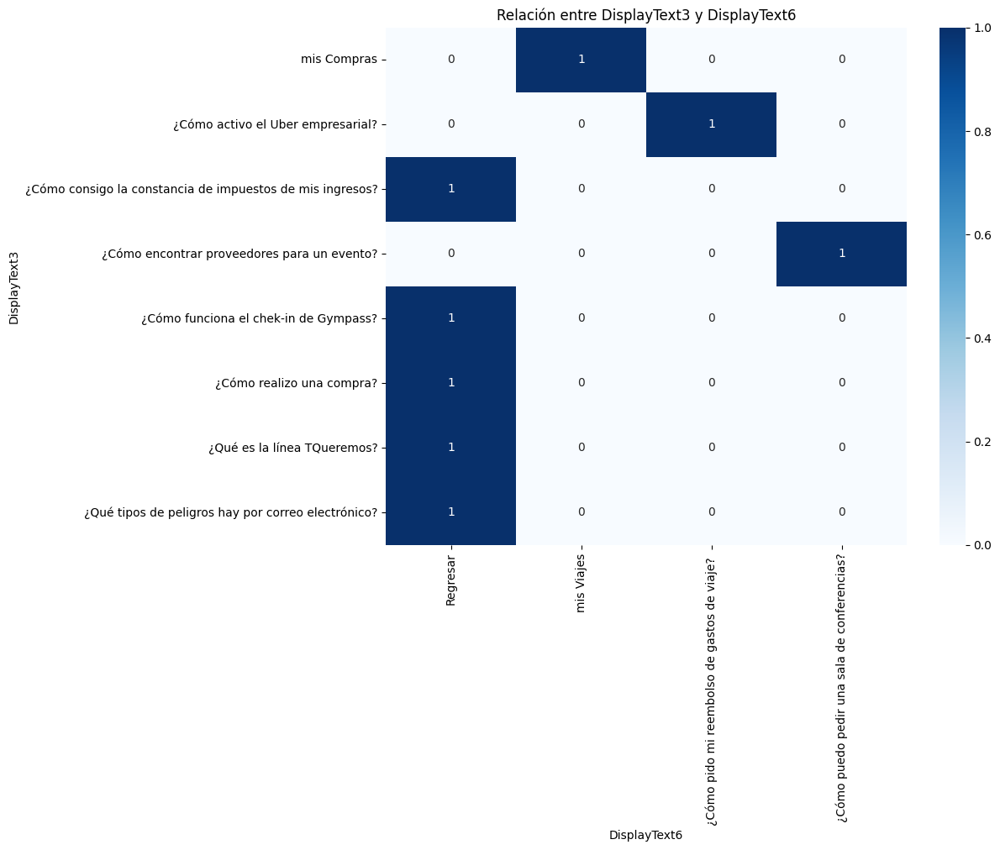


Tabla de contingencia entre 'DisplayText3' y 'DisplayText7':
DisplayText7                                 Bienestar y Flexibilidad  \
DisplayText3                                                            
mis Compras                                                         1   
¿Cómo activo el Uber empresarial?                                   0   
¿Cómo encontrar proveedores para un evento?                         0   

DisplayText7                                 Regresar  
DisplayText3                                           
mis Compras                                         0  
¿Cómo activo el Uber empresarial?                   1  
¿Cómo encontrar proveedores para un evento?         1  


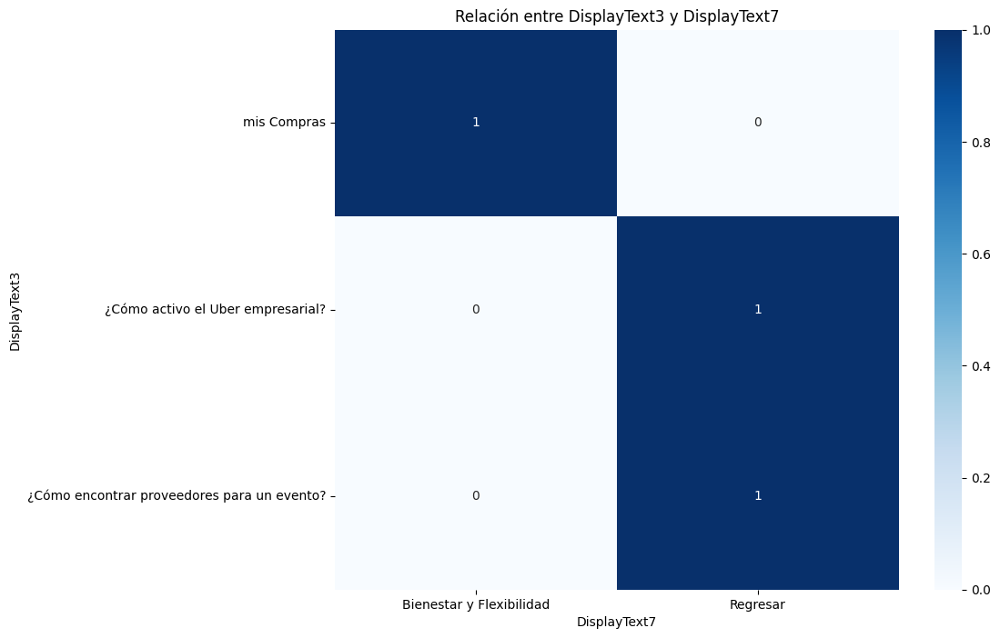


Tabla de contingencia entre 'DisplayText3' y 'DisplayText8':
DisplayText8  Regresar
DisplayText3          
mis Compras          1


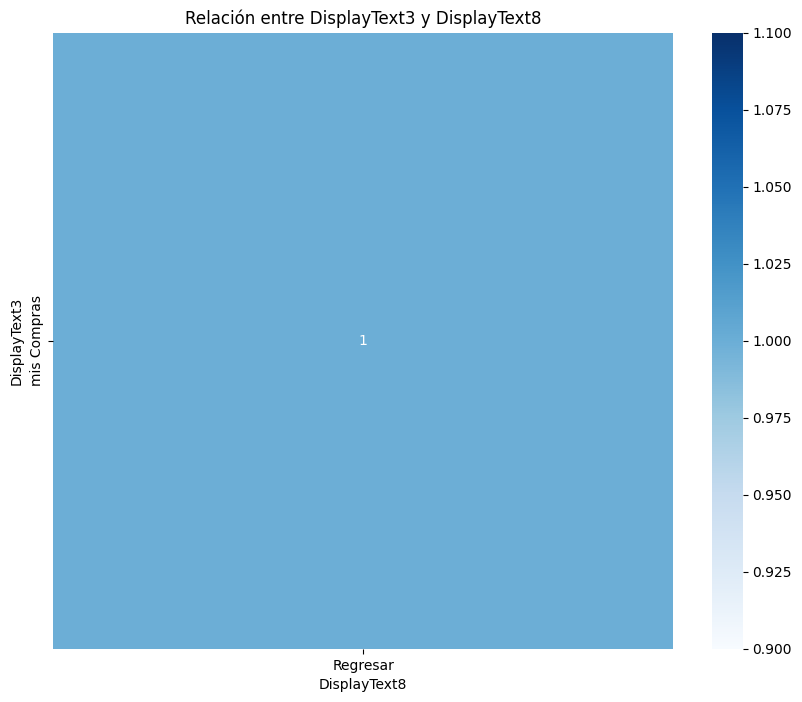


Tabla de contingencia entre 'DisplayText4' y 'DisplayText5':
DisplayText5                                        mis Constancias  \
DisplayText4                                                          
Eventos                                                           1   
¿Cuáles son los requisitos para que mi evento s...                0   
¿Cómo actualizar tu plan de Gympass a uno de ma...                0   
¿Cómo debo de activar la llave Digital?                           0   
¿Cómo puedo hacer una compra con pcard?                           0   
¿Cómo puedo obtener una Tarjeta Corporativa?                      0   
¿Cómo puedo solicitar ayuda a través de la líne...                0   
¿Dónde descargo mi constancia de registro en el...                0   

DisplayText5                                        ¿Cómo consigo una constancia para trámtiar VISA?  \
DisplayText4                                                                                           
Eventos            

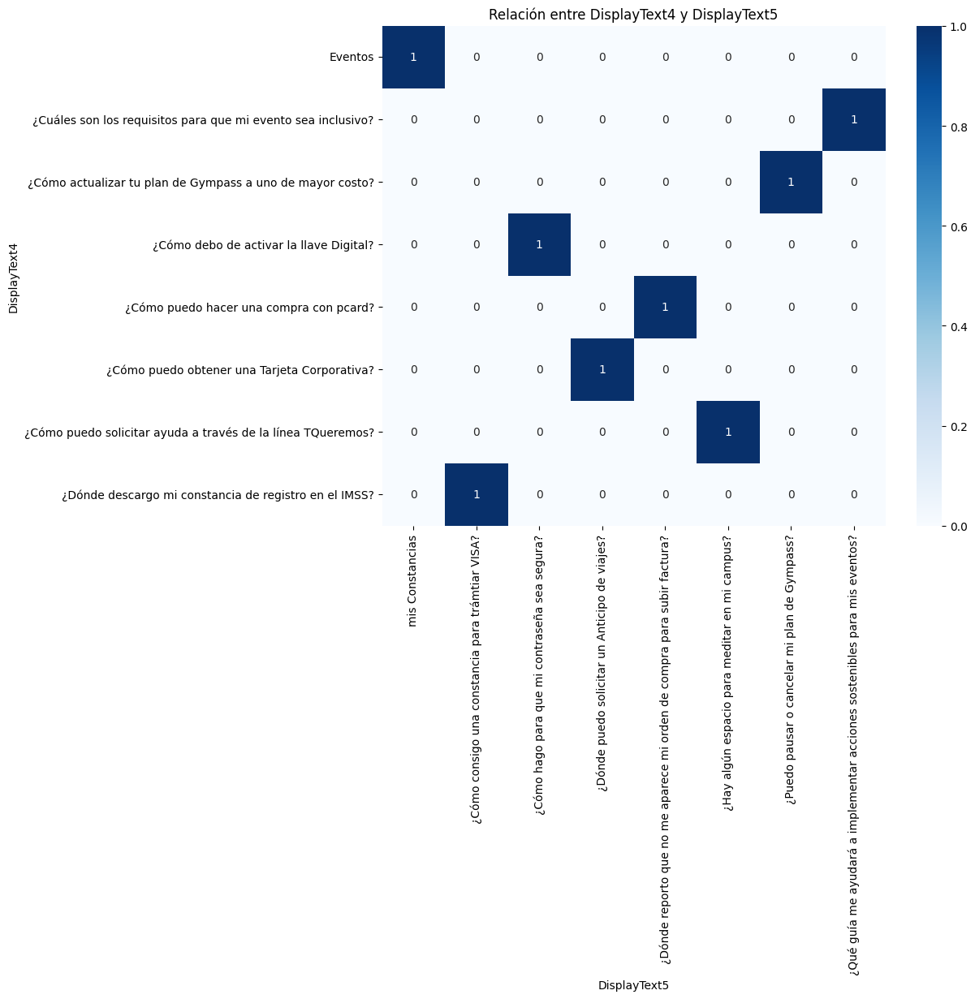


Tabla de contingencia entre 'DisplayText4' y 'DisplayText6':
DisplayText6                                        Regresar  mis Viajes  \
DisplayText4                                                               
Eventos                                                    0           1   
¿Cuáles son los requisitos para que mi evento s...         0           0   
¿Cómo actualizar tu plan de Gympass a uno de ma...         1           0   
¿Cómo debo de activar la llave Digital?                    1           0   
¿Cómo puedo hacer una compra con pcard?                    1           0   
¿Cómo puedo obtener una Tarjeta Corporativa?               0           0   
¿Cómo puedo solicitar ayuda a través de la líne...         1           0   
¿Dónde descargo mi constancia de registro en el...         1           0   

DisplayText6                                        ¿Cómo pido mi reembolso de gastos de viaje?   \
DisplayText4                                                                 

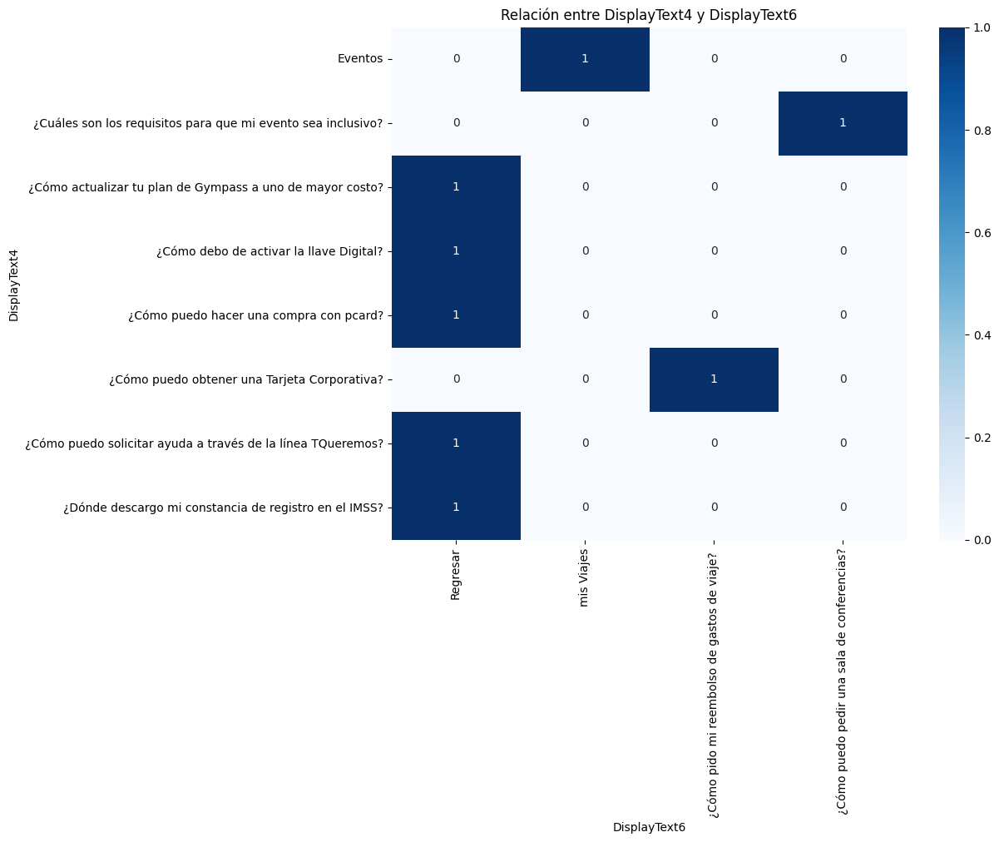


Tabla de contingencia entre 'DisplayText4' y 'DisplayText7':
DisplayText7                                        Bienestar y Flexibilidad  \
DisplayText4                                                                   
Eventos                                                                    1   
¿Cuáles son los requisitos para que mi evento s...                         0   
¿Cómo puedo obtener una Tarjeta Corporativa?                               0   

DisplayText7                                        Regresar  
DisplayText4                                                  
Eventos                                                    0  
¿Cuáles son los requisitos para que mi evento s...         1  
¿Cómo puedo obtener una Tarjeta Corporativa?               1  


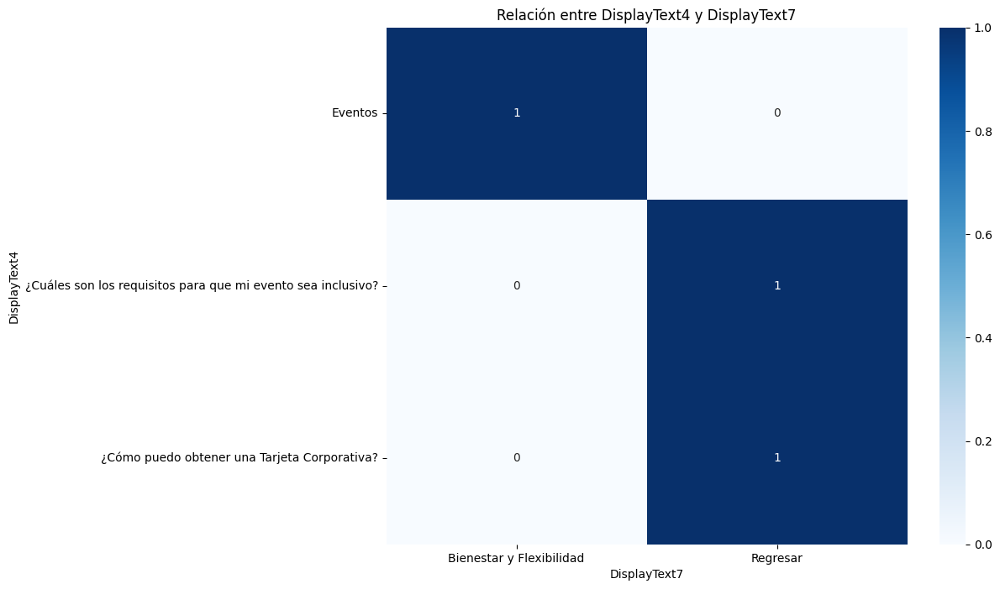


Tabla de contingencia entre 'DisplayText4' y 'DisplayText8':
DisplayText8  Regresar
DisplayText4          
Eventos              1


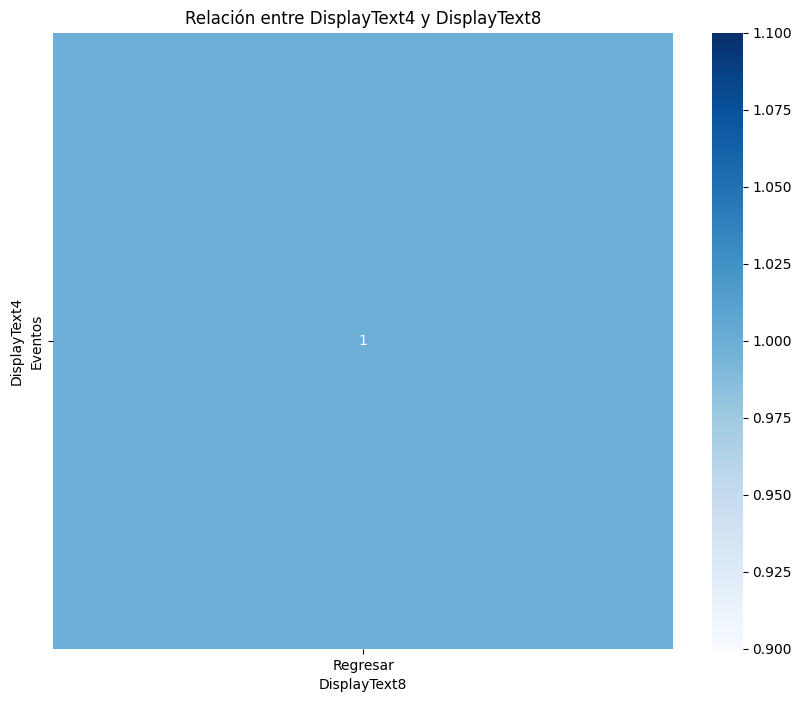


Tabla de contingencia entre 'DisplayText5' y 'DisplayText6':
DisplayText6                                        Regresar  mis Viajes  \
DisplayText5                                                               
mis Constancias                                            0           1   
¿Cómo consigo una constancia para trámtiar VISA?           1           0   
¿Cómo hago para que mi contraseña sea segura?              1           0   
¿Dónde puedo solicitar un Anticipo de viajes?              0           0   
¿Dónde reporto que no me aparece mi orden de co...         1           0   
¿Hay algún espacio para meditar en mi campus?              1           0   
¿Puedo pausar o cancelar mi plan de Gympass?               1           0   
¿Qué guía me ayudará a implementar acciones sos...         0           0   

DisplayText6                                        ¿Cómo pido mi reembolso de gastos de viaje?   \
DisplayText5                                                                 

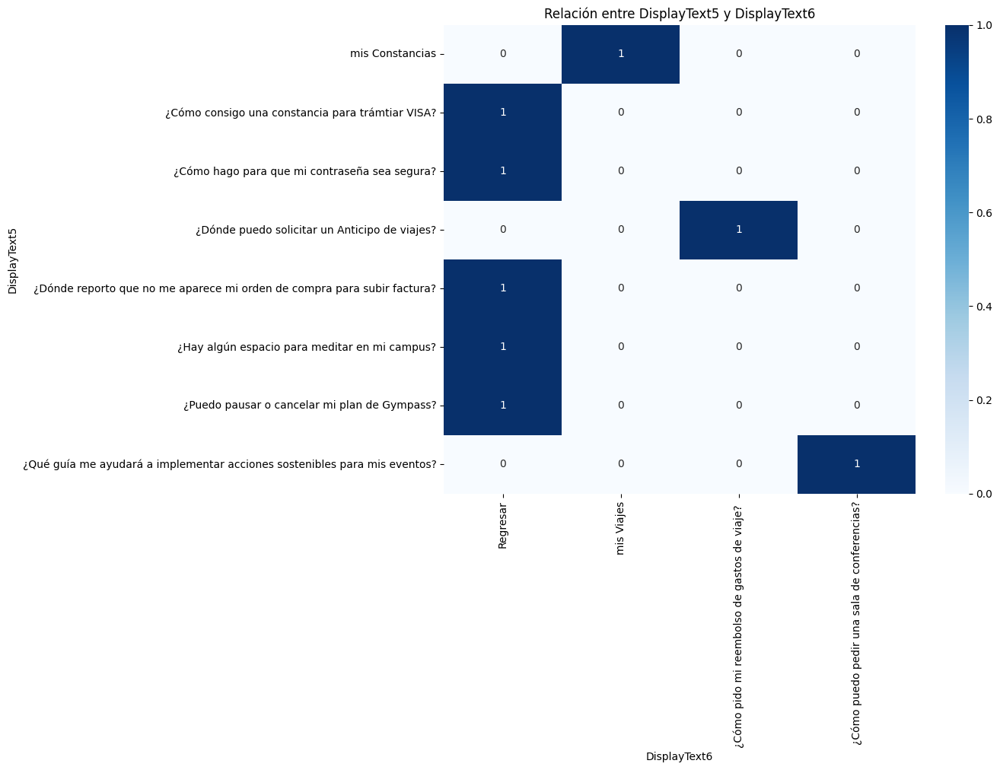


Tabla de contingencia entre 'DisplayText5' y 'DisplayText7':
DisplayText7                                        Bienestar y Flexibilidad  \
DisplayText5                                                                   
mis Constancias                                                            1   
¿Dónde puedo solicitar un Anticipo de viajes?                              0   
¿Qué guía me ayudará a implementar acciones sos...                         0   

DisplayText7                                        Regresar  
DisplayText5                                                  
mis Constancias                                            0  
¿Dónde puedo solicitar un Anticipo de viajes?              1  
¿Qué guía me ayudará a implementar acciones sos...         1  


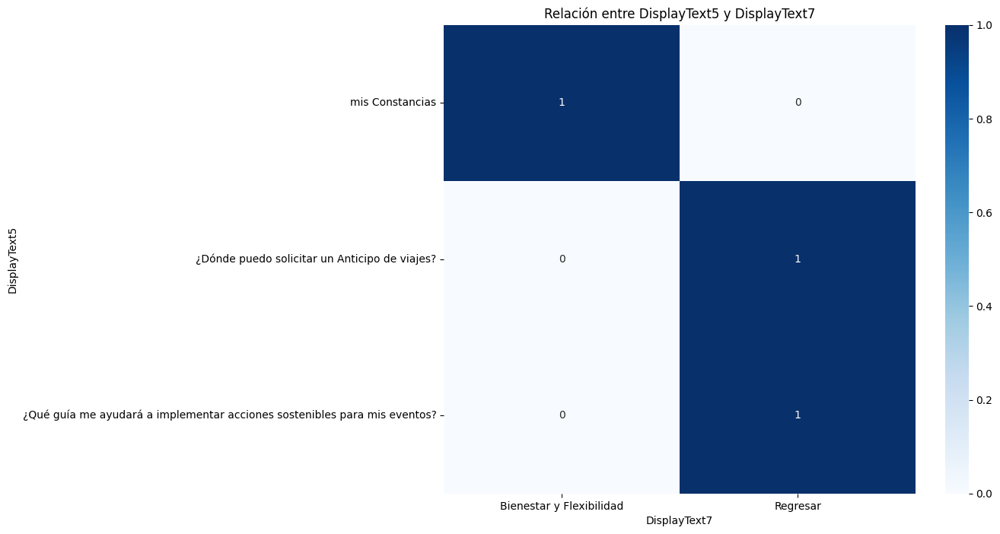


Tabla de contingencia entre 'DisplayText5' y 'DisplayText8':
DisplayText8     Regresar
DisplayText5             
mis Constancias         1


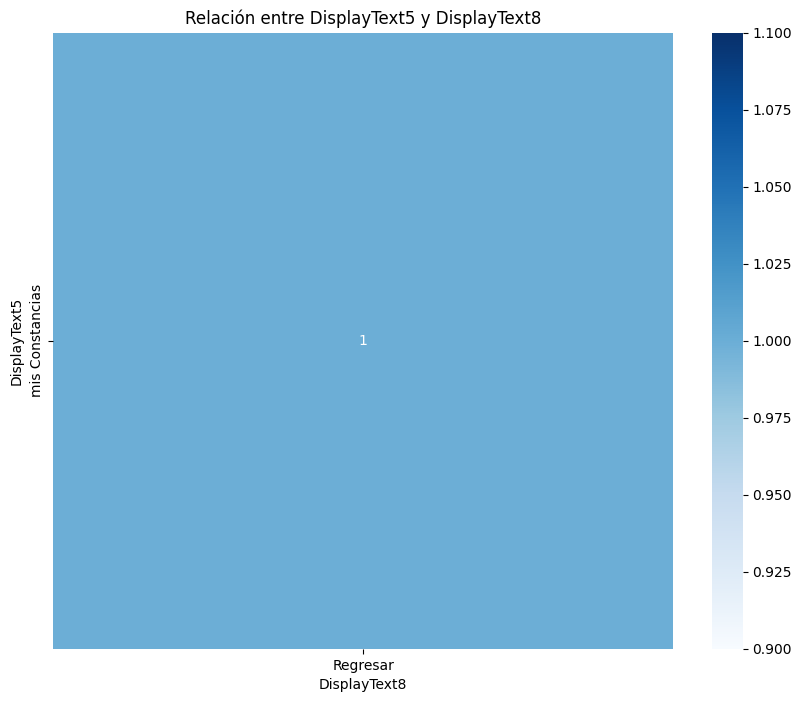


Tabla de contingencia entre 'DisplayText6' y 'DisplayText7':
DisplayText7                                  Bienestar y Flexibilidad  \
DisplayText6                                                             
mis Viajes                                                           1   
¿Cómo pido mi reembolso de gastos de viaje?                          0   
¿Cómo puedo pedir una sala de conferencias?                          0   

DisplayText7                                  Regresar  
DisplayText6                                            
mis Viajes                                           0  
¿Cómo pido mi reembolso de gastos de viaje?          1  
¿Cómo puedo pedir una sala de conferencias?          1  


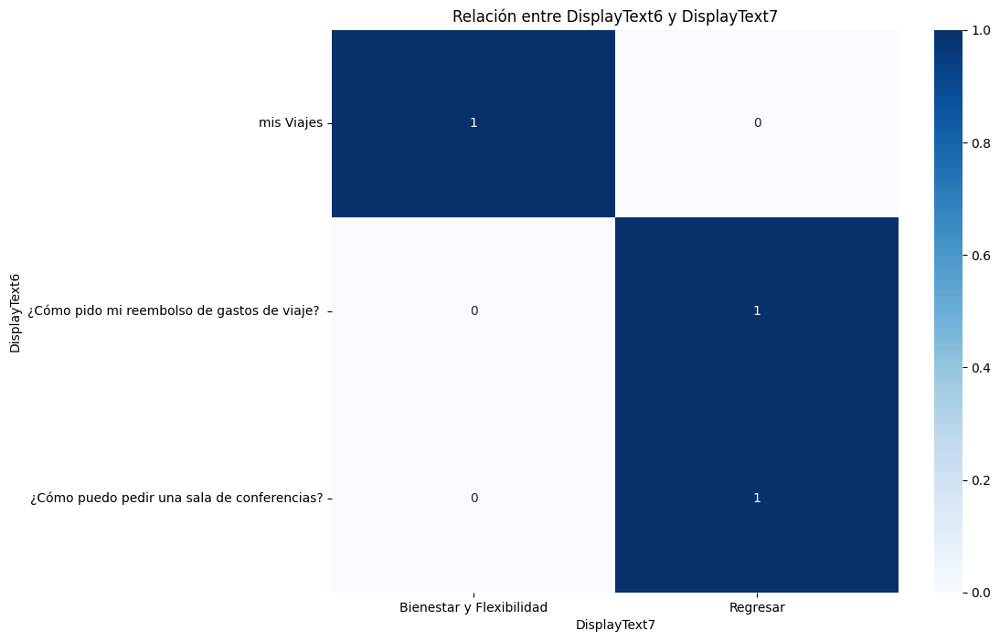


Tabla de contingencia entre 'DisplayText6' y 'DisplayText8':
DisplayText8  Regresar
DisplayText6          
mis Viajes           1


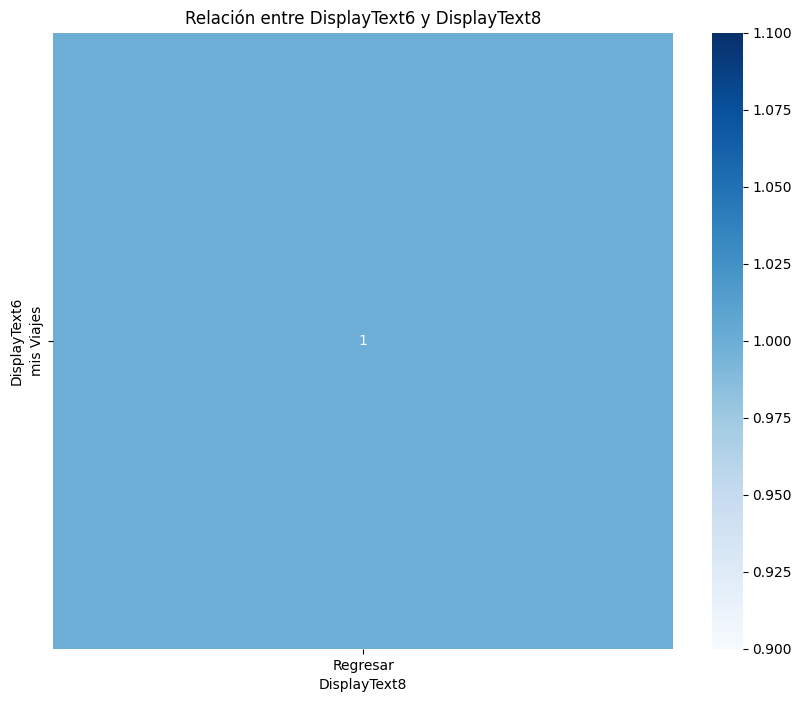


Tabla de contingencia entre 'DisplayText7' y 'DisplayText8':
DisplayText8              Regresar
DisplayText7                      
Bienestar y Flexibilidad         1


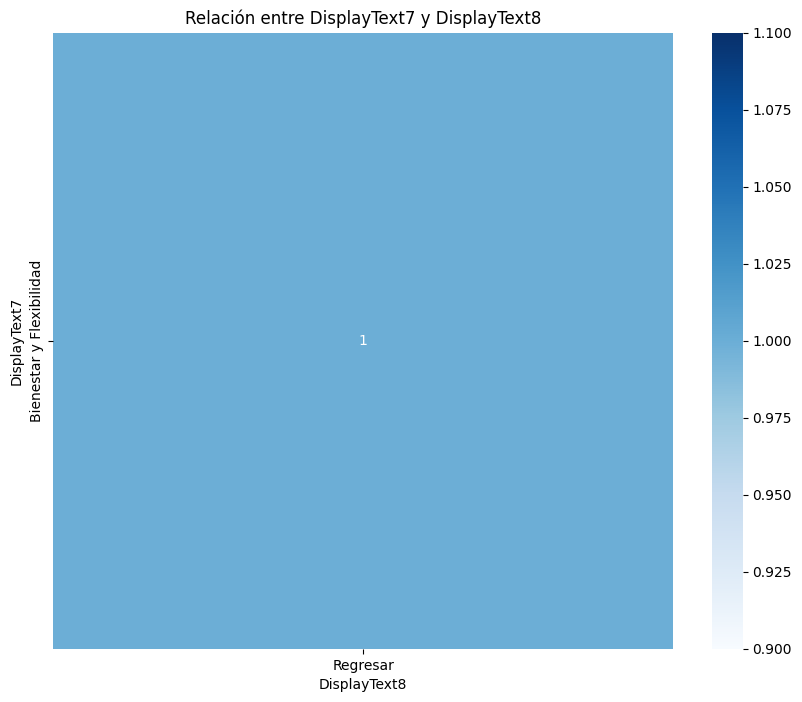

In [ ]:
# 6. Análisis de relación entre variables categóricas
categorical_columns = df.select_dtypes(include=['object']).columns.tolist()

if len(categorical_columns) > 1:  # Asegurarse de que haya al menos dos columnas categóricas
    for i in range(len(categorical_columns)):
        for j in range(i + 1, len(categorical_columns)):
            col1 = categorical_columns[i]
            col2 = categorical_columns[j]

            # Crear una tabla de contingencia
            contingency_table = pd.crosstab(df[col1], df[col2])
            print(f"\nTabla de contingencia entre '{col1}' y '{col2}':")
            print(contingency_table)

            # Visualizar la relación con un gráfico de calor
            plt.figure(figsize=(10, 8))
            sns.heatmap(contingency_table, annot=True, cmap='Blues', fmt='d')
            plt.title(f'Relación entre {col1} y {col2}')
            plt.xlabel(col2)
            plt.ylabel(col1)
            plt.show()
else:
    print("No hay suficientes columnas categóricas para realizar el análisis de relación.")


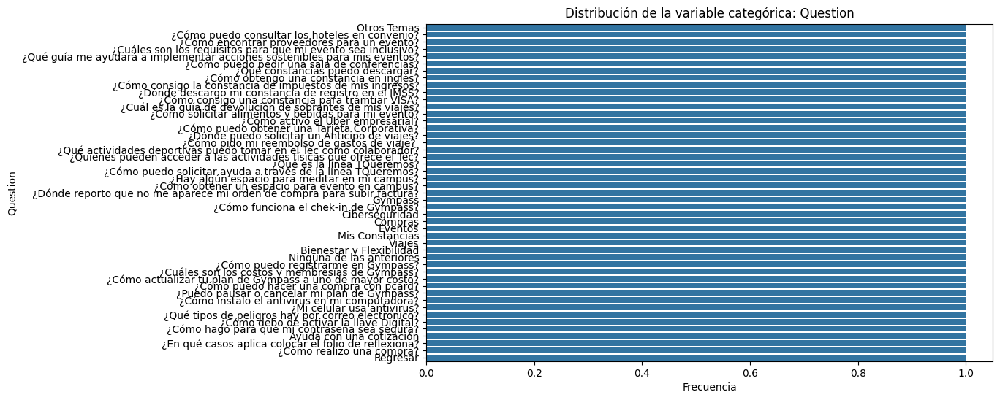


Distribución de la columna categórica: 'Question'
Question
Otros Temas                                                                  1
¿Cómo puedo consultar los hoteles en convenio?                               1
¿Cómo encontrar proveedores para un evento?                                  1
¿Cuáles son los requisitos para que mi evento sea inclusivo?                 1
¿Qué guía me ayudará a implementar acciones sostenibles para mis eventos?    1
¿Cómo puedo pedir una sala de conferencias?                                  1
¿Qué constancias puedo descargar?                                            1
¿Cómo obtengo una constancia en inglés?                                      1
¿Cómo consigo la constancia de impuestos de mis ingresos?                    1
¿Dónde descargo mi constancia de registro en el IMSS?                        1
¿Cómo consigo una constancia para trámtiar VISA?                             1
¿Cuál es la guía de devolución de sobrantes de mis viajes?             

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127976 (\N{HOTEL}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129488 (\N{FACE WITH MONOCLE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128072 (\N{WHITE LEFT POINTING BACKHAND INDEX}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129303 (\N{HUGGING FACE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127979 (\N{SCHOOL}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pyl

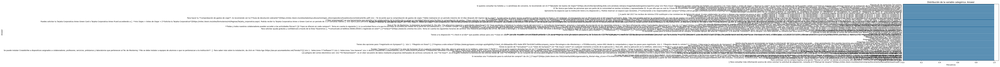


Distribución de la columna categórica: 'Answer'
Answer
Algunas de las preguntas frecuentes:                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            

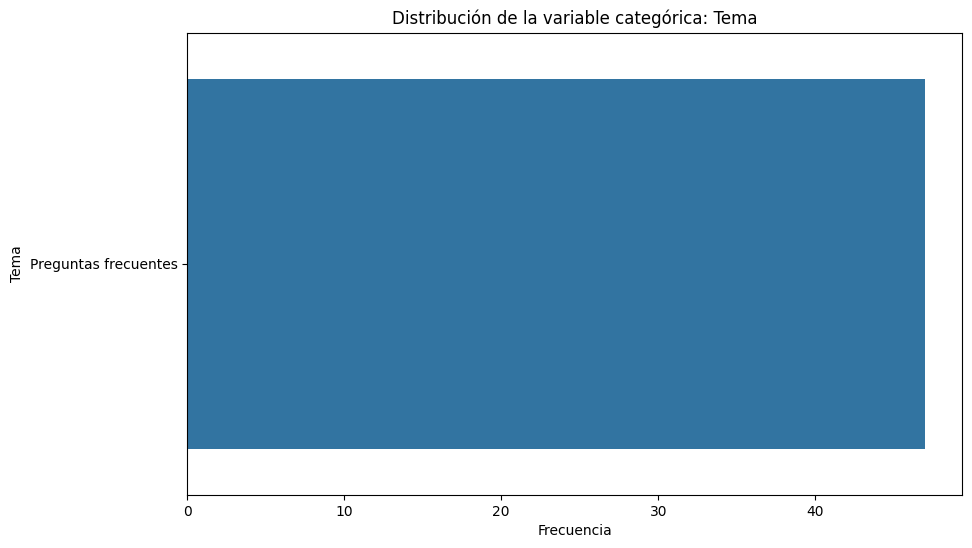


Distribución de la columna categórica: 'Tema'
Tema
Preguntas frecuentes    47
Name: count, dtype: int64


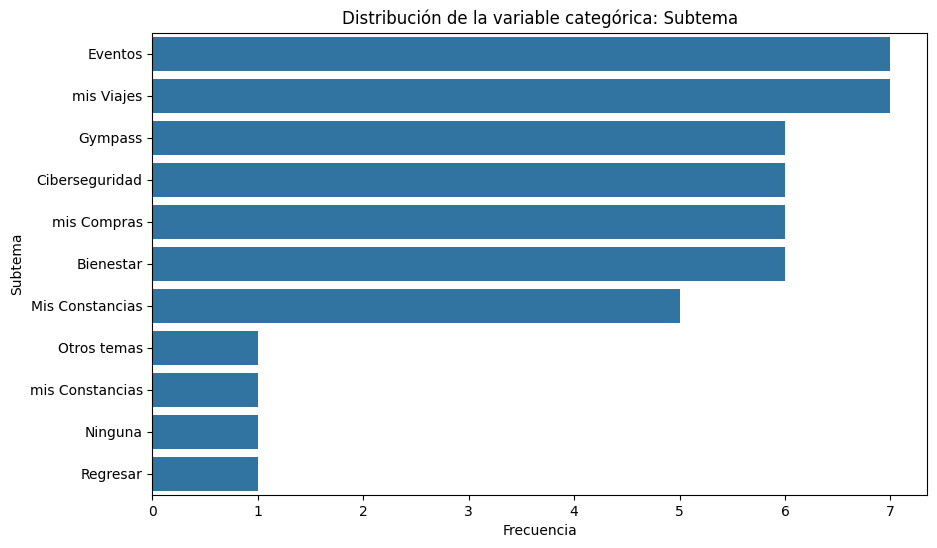


Distribución de la columna categórica: 'Subtema'
Subtema
Eventos            7
mis Viajes         7
Gympass            6
Ciberseguridad     6
mis Compras        6
Bienestar          6
Mis Constancias    5
Otros temas        1
mis Constancias    1
Ninguna            1
Regresar           1
Name: count, dtype: int64


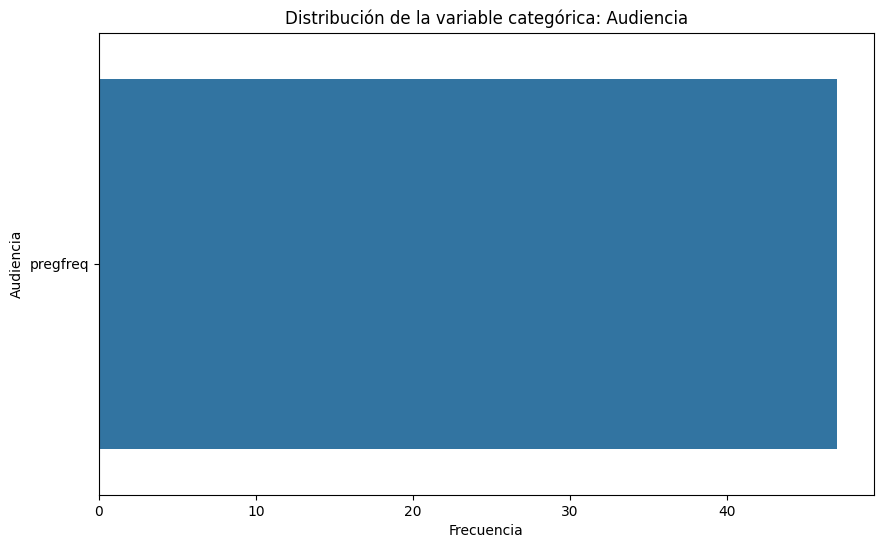


Distribución de la columna categórica: 'Audiencia'
Audiencia
pregfreq    47
Name: count, dtype: int64


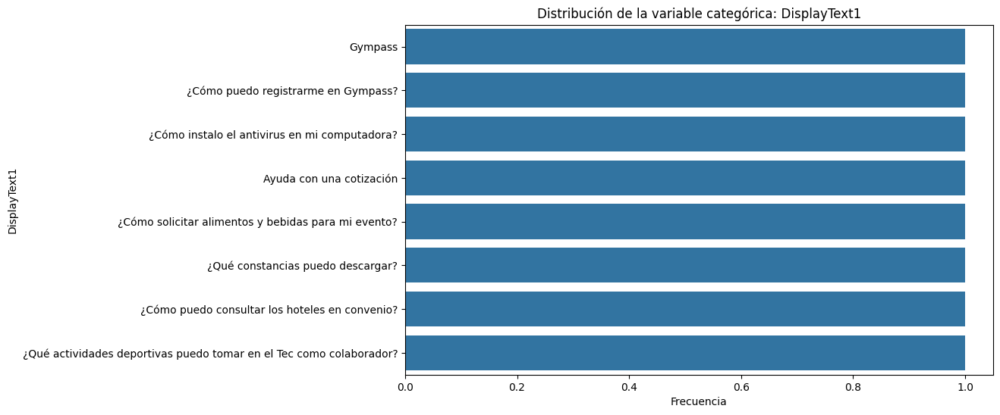


Distribución de la columna categórica: 'DisplayText1'
DisplayText1
Gympass                                                                1
¿Cómo puedo registrarme en Gympass?                                    1
¿Cómo instalo el antivirus en mi computadora?                          1
Ayuda con una cotización                                               1
¿Cómo solicitar alimentos y bebidas para mi evento?                    1
¿Qué constancias puedo descargar?                                      1
¿Cómo puedo consultar los hoteles en convenio?                         1
¿Qué actividades deportivas puedo tomar en el Tec como colaborador?    1
Name: count, dtype: int64


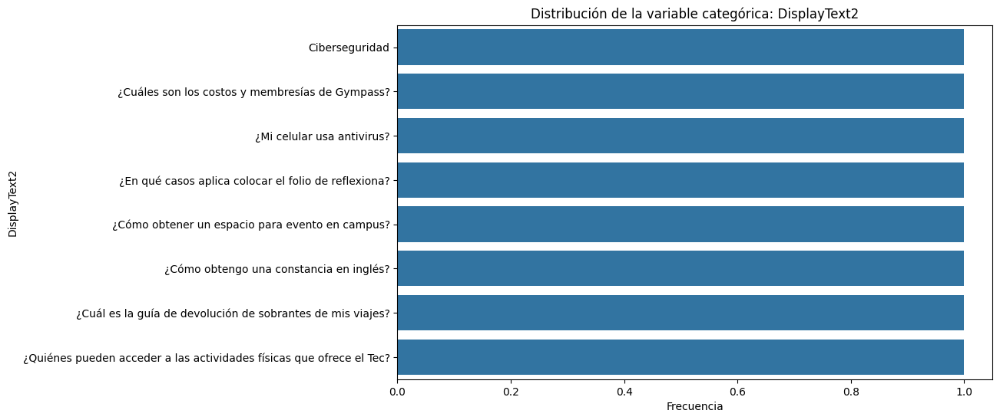


Distribución de la columna categórica: 'DisplayText2'
DisplayText2
Ciberseguridad                                                          1
¿Cuáles son los costos y membresías de Gympass?                         1
¿Mi celular usa antivirus?                                              1
¿En qué casos aplica colocar el folio de reflexiona?                    1
¿Cómo obtener un espacio para evento en campus?                         1
¿Cómo obtengo una constancia en inglés?                                 1
¿Cuál es la guía de devolución de sobrantes de mis viajes?              1
¿Quiénes pueden acceder a las actividades físicas que ofrece el Tec?    1
Name: count, dtype: int64


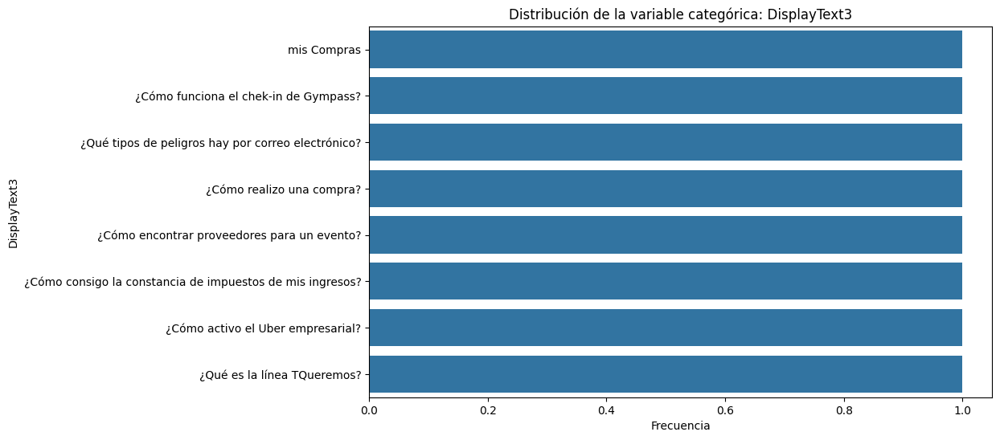


Distribución de la columna categórica: 'DisplayText3'
DisplayText3
mis Compras                                                  1
¿Cómo funciona el chek-in de Gympass?                        1
¿Qué tipos de peligros hay por correo electrónico?           1
¿Cómo realizo una compra?                                    1
¿Cómo encontrar proveedores para un evento?                  1
¿Cómo consigo la constancia de impuestos de mis ingresos?    1
¿Cómo activo el Uber empresarial?                            1
¿Qué es la línea TQueremos?                                  1
Name: count, dtype: int64


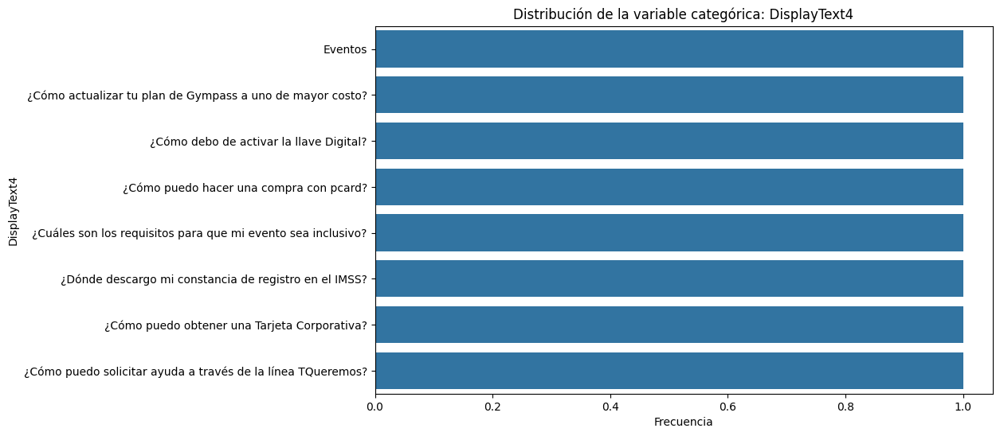


Distribución de la columna categórica: 'DisplayText4'
DisplayText4
Eventos                                                         1
¿Cómo actualizar tu plan de Gympass a uno de mayor costo?       1
¿Cómo debo de activar la llave Digital?                         1
¿Cómo puedo hacer una compra con pcard?                         1
¿Cuáles son los requisitos para que mi evento sea inclusivo?    1
¿Dónde descargo mi constancia de registro en el IMSS?           1
¿Cómo puedo obtener una Tarjeta Corporativa?                    1
¿Cómo puedo solicitar ayuda a través de la línea TQueremos?     1
Name: count, dtype: int64


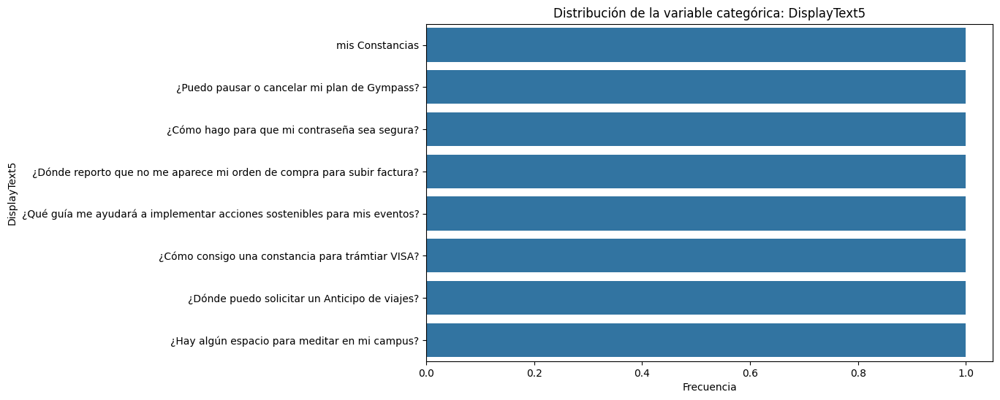


Distribución de la columna categórica: 'DisplayText5'
DisplayText5
mis Constancias                                                              1
¿Puedo pausar o cancelar mi plan de Gympass?                                 1
¿Cómo hago para que mi contraseña sea segura?                                1
¿Dónde reporto que no me aparece mi orden de compra para subir factura?      1
¿Qué guía me ayudará a implementar acciones sostenibles para mis eventos?    1
¿Cómo consigo una constancia para trámtiar VISA?                             1
¿Dónde puedo solicitar un Anticipo de viajes?                                1
¿Hay algún espacio para meditar en mi campus?                                1
Name: count, dtype: int64


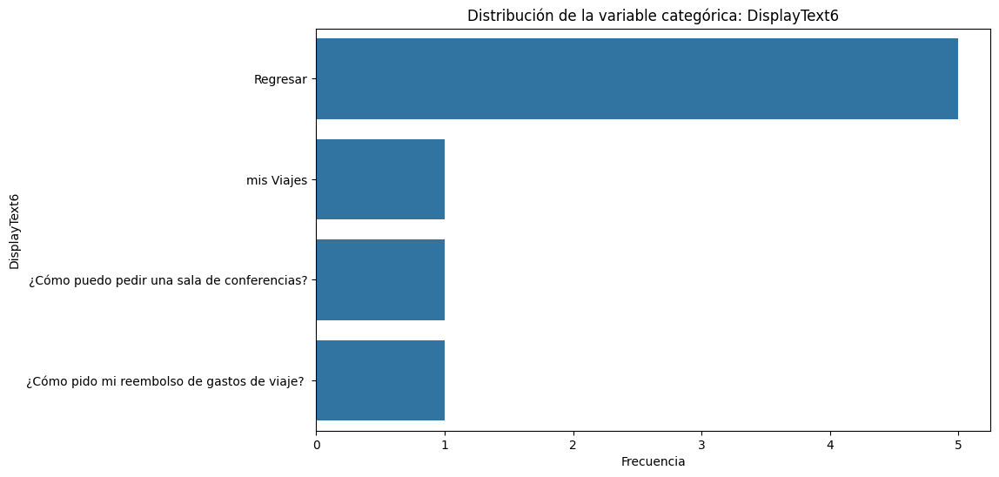


Distribución de la columna categórica: 'DisplayText6'
DisplayText6
Regresar                                        5
mis Viajes                                      1
¿Cómo puedo pedir una sala de conferencias?     1
¿Cómo pido mi reembolso de gastos de viaje?     1
Name: count, dtype: int64


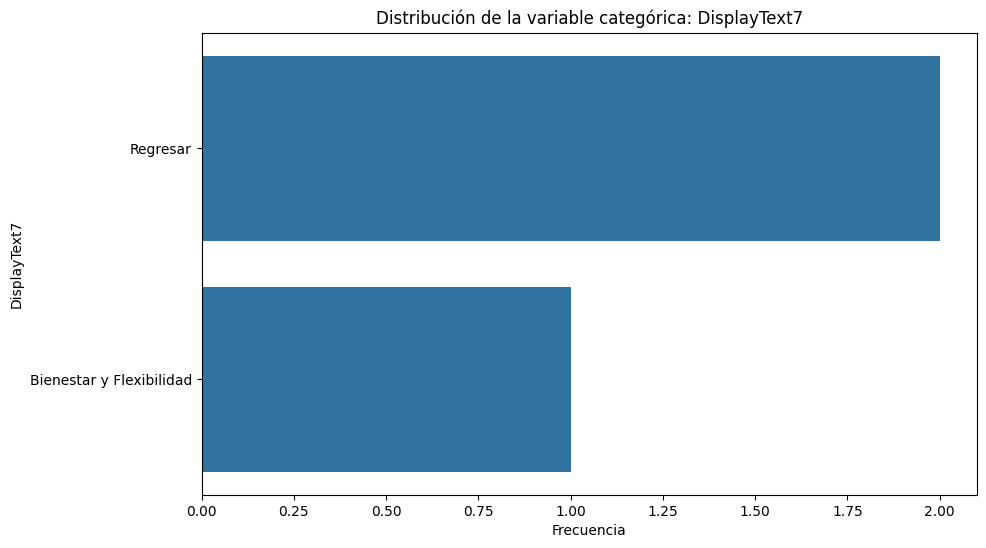


Distribución de la columna categórica: 'DisplayText7'
DisplayText7
Regresar                    2
Bienestar y Flexibilidad    1
Name: count, dtype: int64


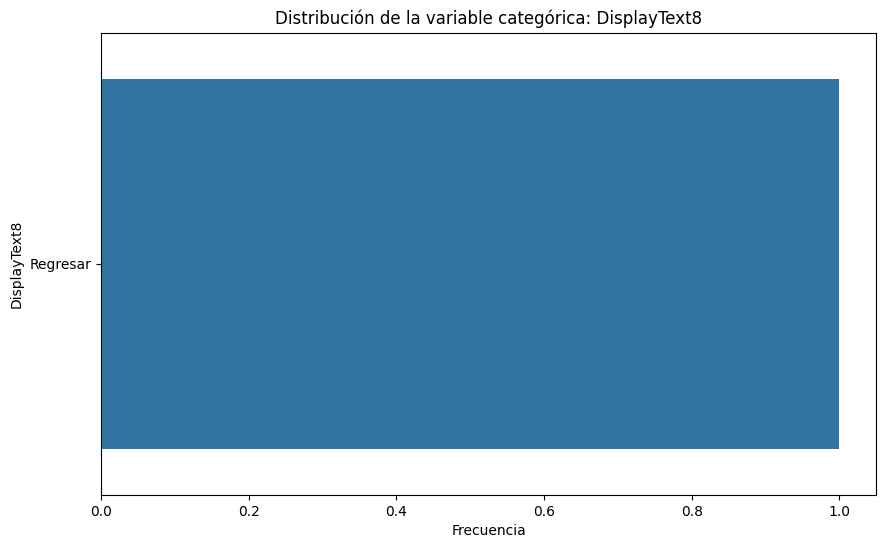


Distribución de la columna categórica: 'DisplayText8'
DisplayText8
Regresar    1
Name: count, dtype: int64


In [ ]:
# 7. Distribución en función de todas las columnas categóricas - Imprimir cada gráfico por separado
categorical_columns = df.select_dtypes(include=['object', 'category']).columns  # Seleccionar todas las columnas categóricas

for col in categorical_columns:
    plt.figure(figsize=(10, 6))
    sns.countplot(data=df, y=col, order=df[col].value_counts().index)
    plt.title(f'Distribución de la variable categórica: {col}')
    plt.xlabel('Frecuencia')
    plt.ylabel(col)
    plt.show()

    print(f"\nDistribución de la columna categórica: '{col}'")
    print(df[col].value_counts())


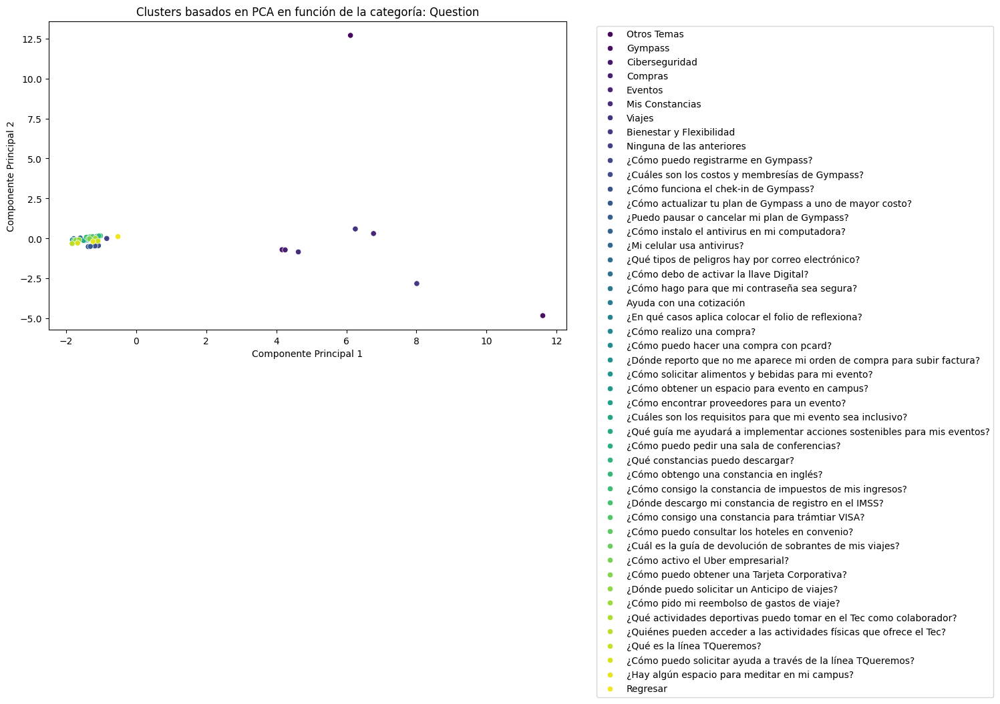


Gráfico de clusters para la categoría: 'Question'


/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128077 (\N{THUMBS UP SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128071 (\N{WHITE DOWN POINTING BACKHAND INDEX}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128187 (\N{PERSONAL COMPUTER}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128241 (\N{MOBILE PHONE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128231 (\N{E-MAIL SYMBOL}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/

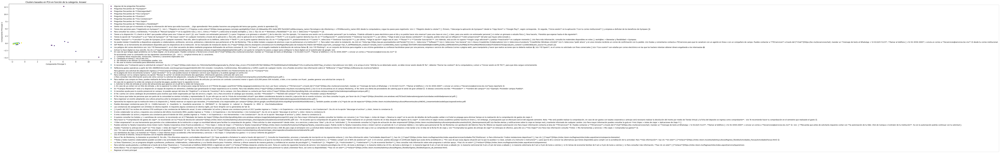


Gráfico de clusters para la categoría: 'Answer'


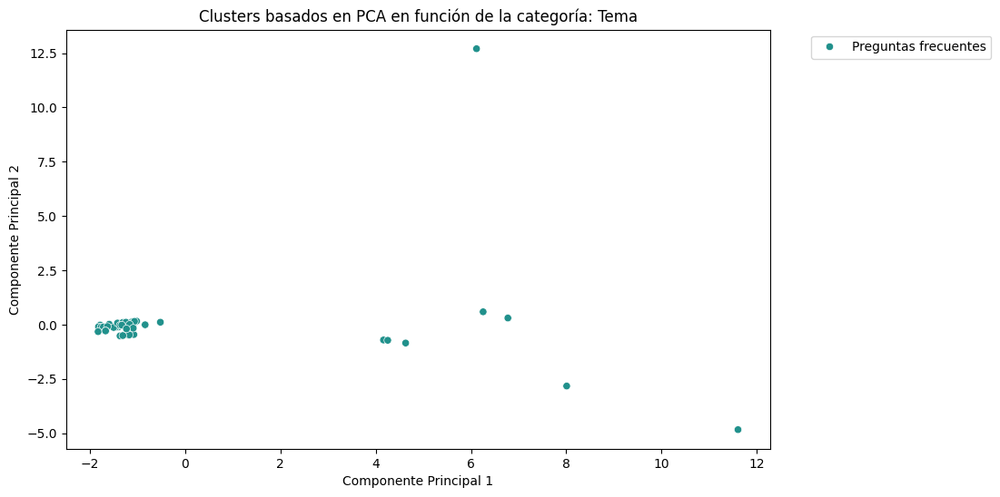


Gráfico de clusters para la categoría: 'Tema'


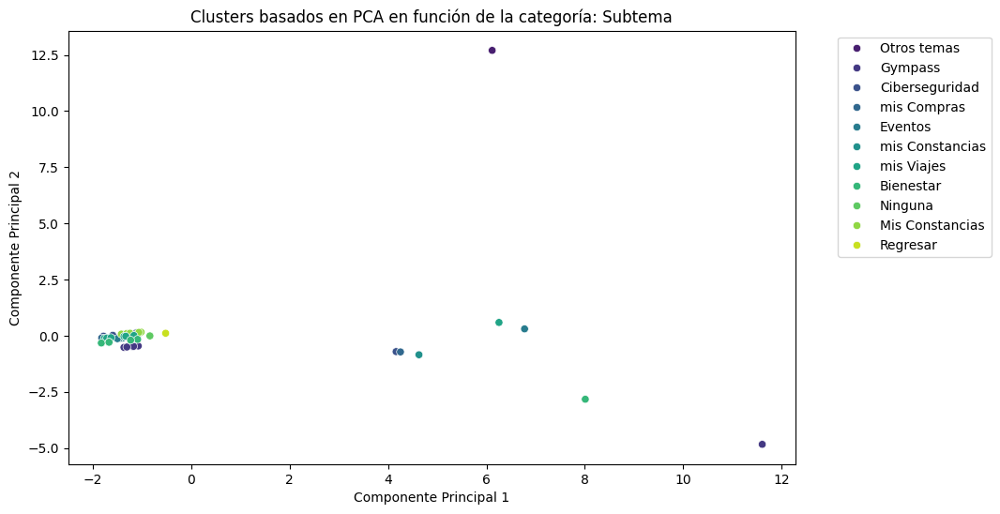


Gráfico de clusters para la categoría: 'Subtema'


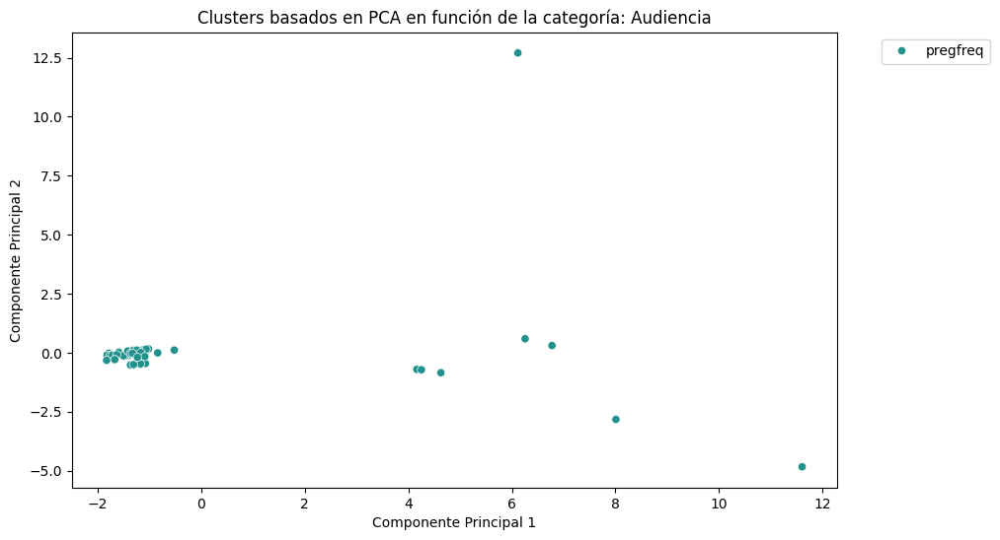


Gráfico de clusters para la categoría: 'Audiencia'


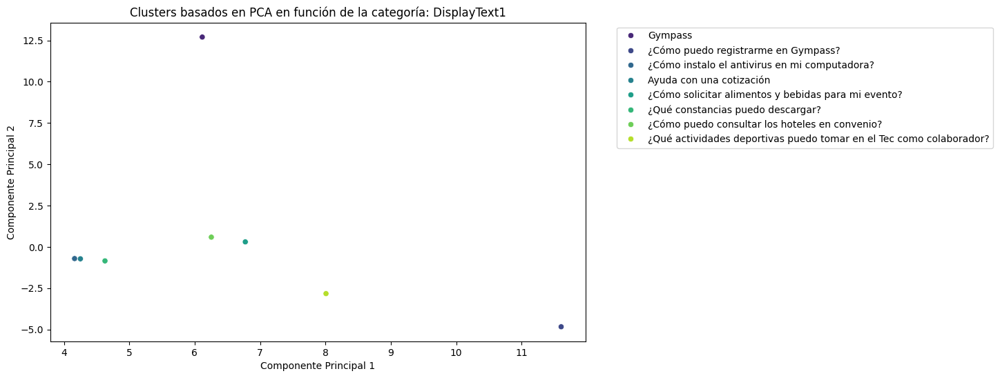


Gráfico de clusters para la categoría: 'DisplayText1'


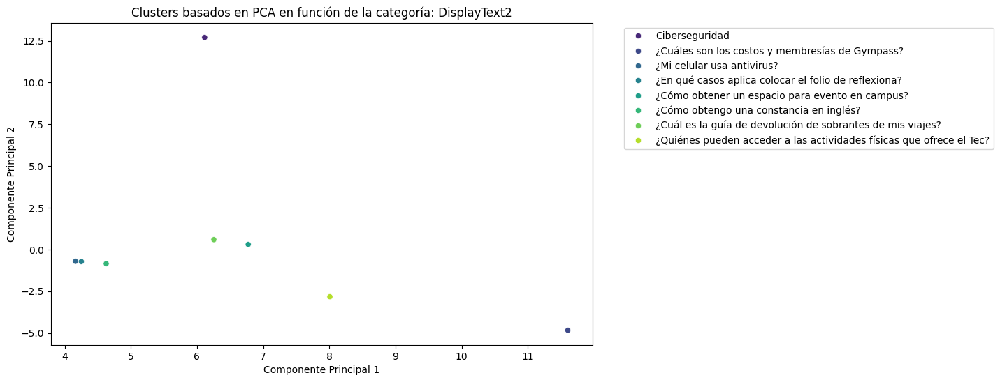


Gráfico de clusters para la categoría: 'DisplayText2'


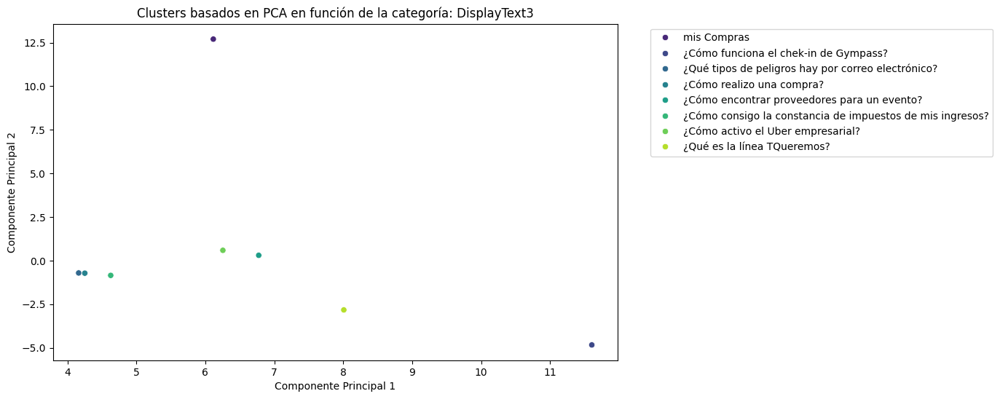


Gráfico de clusters para la categoría: 'DisplayText3'


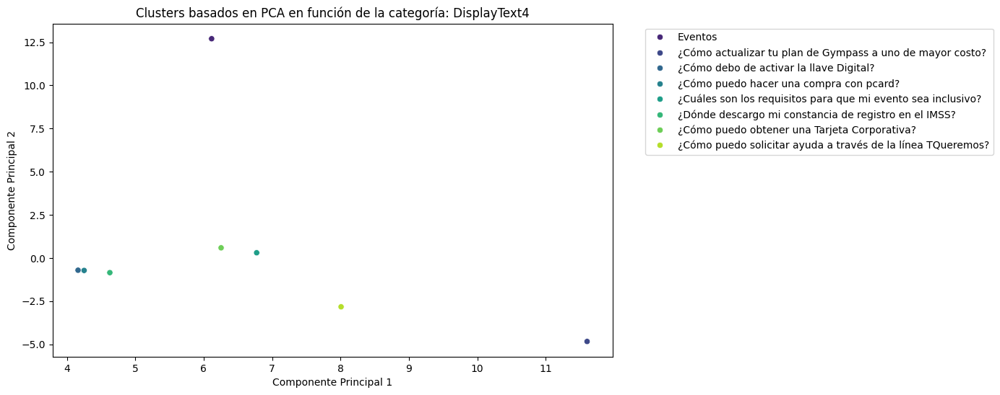


Gráfico de clusters para la categoría: 'DisplayText4'


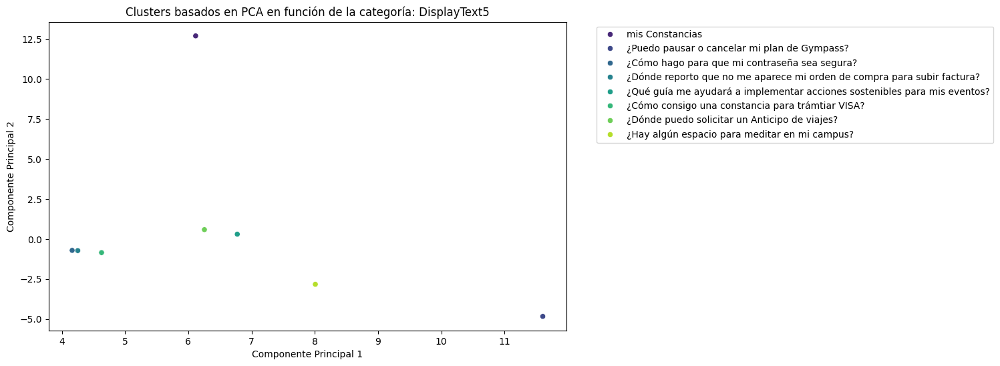


Gráfico de clusters para la categoría: 'DisplayText5'


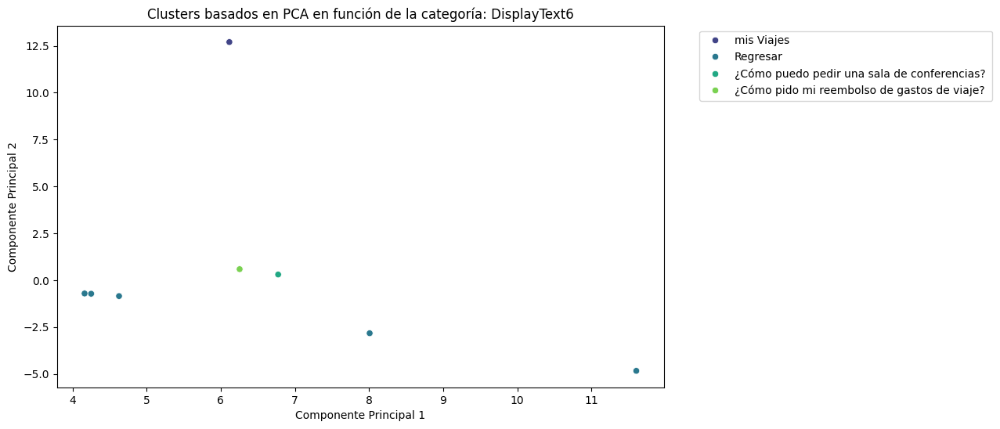


Gráfico de clusters para la categoría: 'DisplayText6'


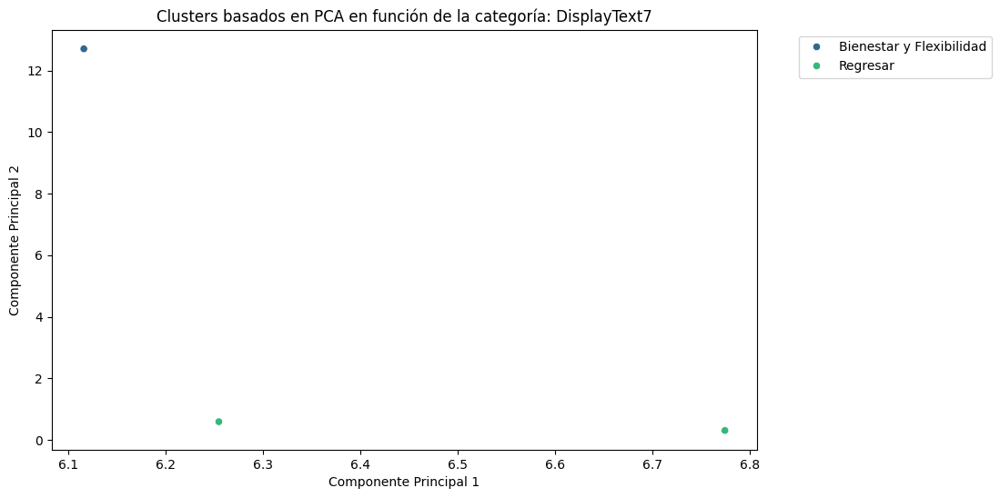


Gráfico de clusters para la categoría: 'DisplayText7'


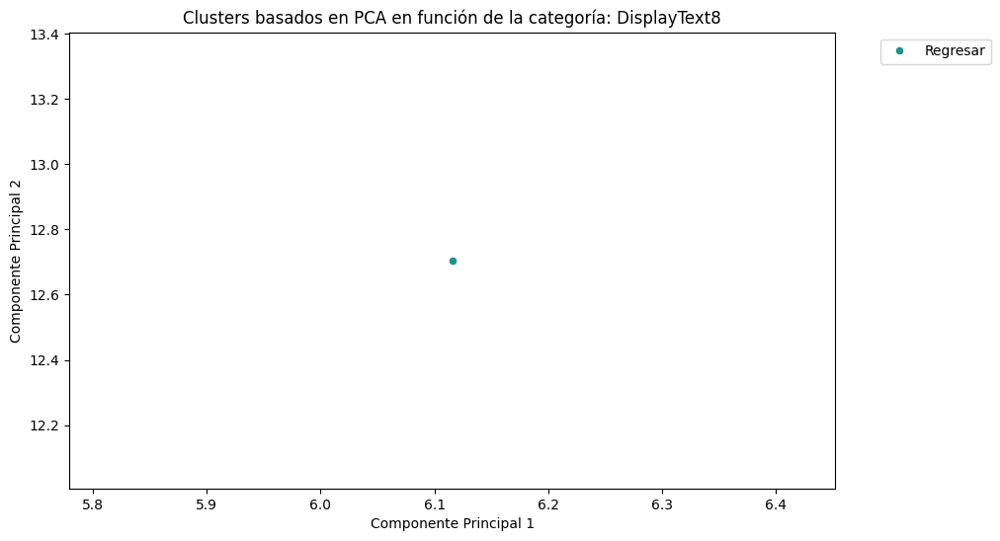


Gráfico de clusters para la categoría: 'DisplayText8'


In [ ]:
# 8. Identificación de clusters (agrupaciones) - Imprimir cada gráfico de dispersión por separado
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Estandarizar los datos numéricos
numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df[numeric_columns].fillna(0))

# Reducción de dimensionalidad utilizando PCA
pca = PCA(n_components=2)
df_pca = pca.fit_transform(df_scaled)
df['PCA1'] = df_pca[:, 0]
df['PCA2'] = df_pca[:, 1]

# Crear un gráfico de dispersión para cada columna categórica relevante con respecto a las componentes principales
#categorical_columns = ['Tema', 'Subtema', 'Audiencia']  # Puedes ajustar estas columnas según tu caso
categorical_columns = df.select_dtypes(include=['object', 'category']).columns  # Seleccionar todas las columnas categóricas

for category in categorical_columns:
    plt.figure(figsize=(10, 6))

    if category in df.columns:
        sns.scatterplot(x='PCA1', y='PCA2', data=df, hue=category, palette='viridis', legend='full')
        plt.title(f'Clusters basados en PCA en función de la categoría: {category}')
        plt.xlabel('Componente Principal 1')
        plt.ylabel('Componente Principal 2')
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.show()

        print(f"\nGráfico de clusters para la categoría: '{category}'")
    else:
        print(f"La columna '{category}' no está presente en el DataFrame.")


In [ ]:
# Conclusiones del EDA
print("\nConclusiones del Análisis Exploratorio de Datos:")
print(f"- El conjunto de datos tiene {df.shape[0]} filas y {df.shape[1]} columnas.")
print(f"- Hay {missing_values.sum()} valores faltantes en total. Las columnas con más valores faltantes son: {missing_values[missing_values > 0].index.tolist()}")
print("- Las columnas con alta cardinalidad son:", [col for col in categorical_columns if df[col].nunique() > 10])
print("- Se han detectado valores atípicos en las siguientes columnas:", outliers.columns.tolist())
print("- La variable 'Tema' muestra múltiples categorías, se recomienda realizar un análisis más detallado de estas.")



Conclusiones del Análisis Exploratorio de Datos:
- El conjunto de datos tiene 47 filas y 50 columnas.
- Hay 1682 valores faltantes en total. Las columnas con más valores faltantes son: ['idQuestion', 'Responsable', 'QnaId1', 'DisplayText1', 'QnaId2', 'DisplayText2', 'QnaId3', 'DisplayText3', 'QnaId4', 'DisplayText4', 'QnaId5', 'DisplayText5', 'QnaId6', 'DisplayText6', 'QnaId7', 'DisplayText7', 'QnaId8', 'DisplayText8', 'QnaId9', 'DisplayText9', 'QnaId10', 'DisplayText10', 'QnaId11', 'DisplayText11', 'QnaId12', 'DisplayText12', 'QnaId13', 'DisplayText13', 'QnaId14', 'DisplayText14', 'QnaId15', 'DisplayText15', 'QnaId16', 'DisplayText16', 'QnaId17', 'DisplayText17', 'QnaId18', 'DisplayText18']
- Las columnas con alta cardinalidad son: ['Question', 'Answer', 'Subtema']
- Se han detectado valores atípicos en las siguientes columnas: ['Question', 'idAnswer', 'Answer', 'Tema', 'Subtema', 'Audiencia', 'QnaId1', 'DisplayText1', 'QnaId2', 'DisplayText2', 'QnaId3', 'DisplayText3', 'QnaId4', 'Di

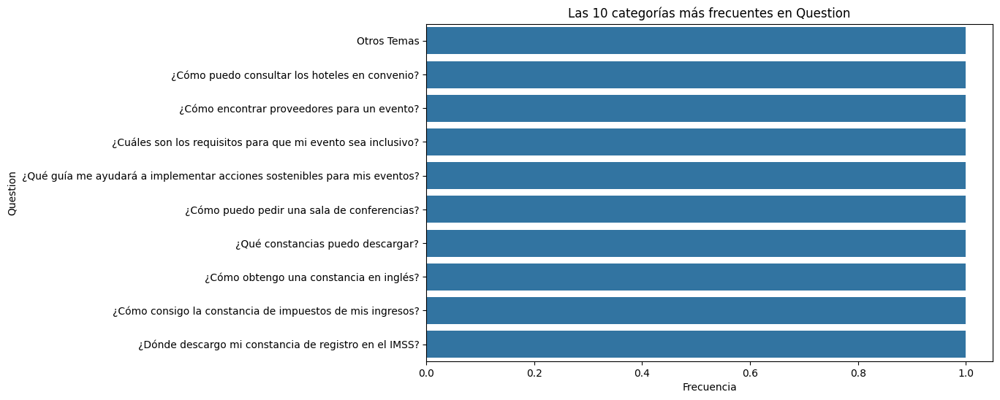

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127976 (\N{HOTEL}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129488 (\N{FACE WITH MONOCLE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128072 (\N{WHITE LEFT POINTING BACKHAND INDEX}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129303 (\N{HUGGING FACE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127979 (\N{SCHOOL}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pyl

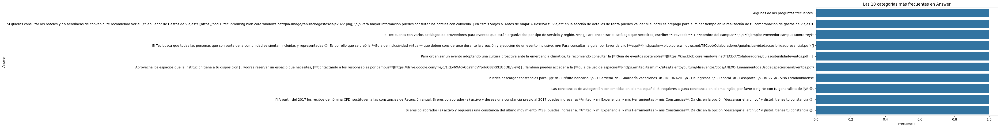

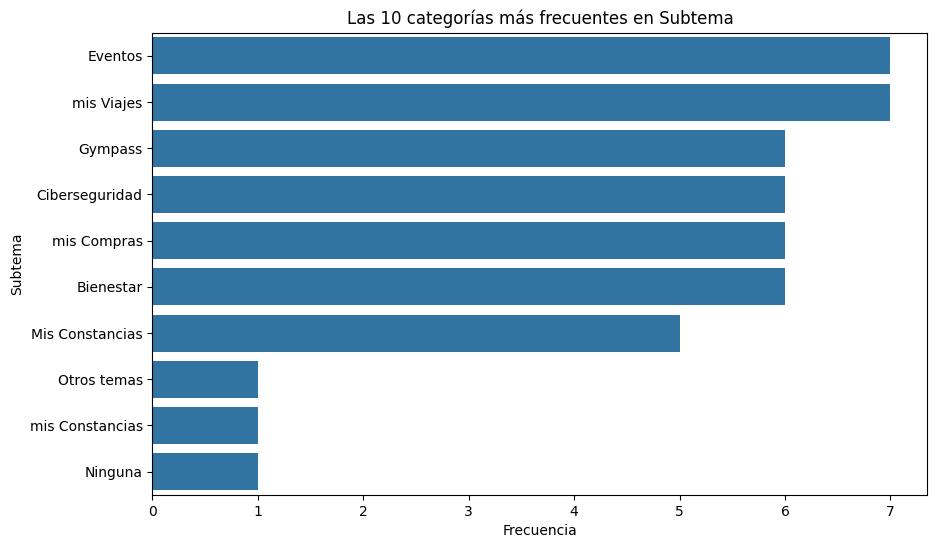

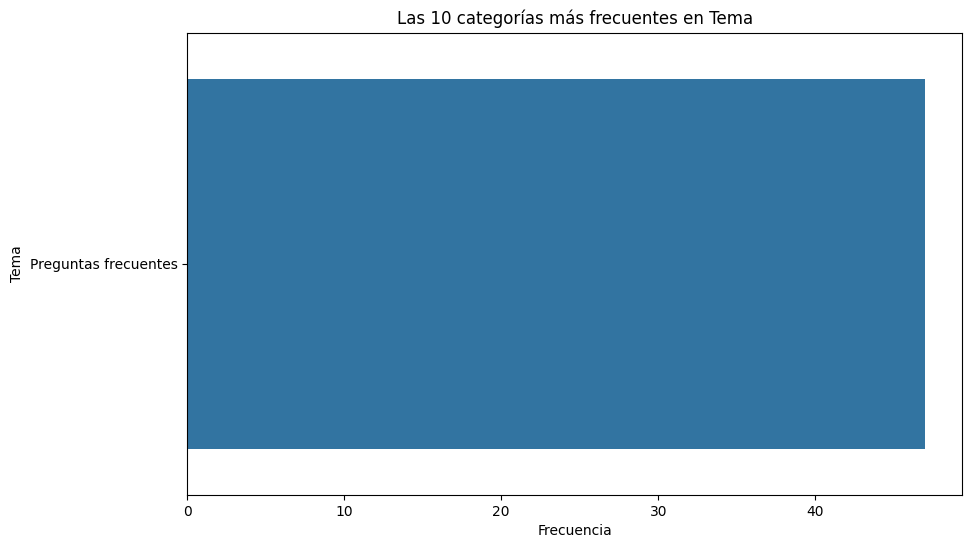

In [ ]:
# Columnas de alta cardinalidad seleccionadas
high_cardinality_cols = ['Question', 'Answer', 'Subtema', 'Tema']

# Gráfico de barras para las columnas con alta cardinalidad
for col in high_cardinality_cols:
    plt.figure(figsize=(10, 6))
    # Mostrar las 10 categorías más frecuentes
    sns.countplot(y=df[col], order=df[col].value_counts().index[:10])
    plt.title(f'Las 10 categorías más frecuentes en {col}')
    plt.xlabel('Frecuencia')
    plt.ylabel(col)
    plt.show()


In [ ]:
df

,Question,idAnswer,Answer,Tema,Subtema,Audiencia,QnaId1,DisplayText1,QnaId2,DisplayText2,...,DisplayText1_length,DisplayText2_length,DisplayText3_length,DisplayText4_length,DisplayText5_length,DisplayText6_length,DisplayText7_length,DisplayText8_length,PCA1,PCA2
0,Otros Temas,5000,Algunas de las preguntas frecuentes:,Preguntas frecuentes,Otros temas,pregfreq,90150.0,Gympass,5100.0,Ciberseguridad,...,7,14,11,7,15,10,24,8,6.115700,12.705181
1,Gympass,90150,Preguntas frecuentes de **Gympass**,Preguntas frecuentes,Gympass,pregfreq,90151.0,¿Cómo puedo registrarme en Gympass?,90152.0,¿Cuáles son los costos y membresías de Gympass?,...,35,47,37,57,44,8,0,0,11.605953,-4.838227
2,Ciberseguridad,5100,Preguntas frecuentes de **Ciberseguridad**,Preguntas frecuentes,Ciberseguridad,pregfreq,5101.0,¿Cómo instalo el antivirus en mi computadora?,5102.0,¿Mi celular usa antivirus?,...,45,26,50,39,45,8,0,0,4.162603,-0.709641
3,Compras,5300,Preguntas frecuentes de **mis Compras**,Preguntas frecuentes,mis Compras,pregfreq,5301.0,Ayuda con una cotización,5302.0,¿En qué casos aplica colocar el folio de refle...,...,24,52,25,39,71,8,0,0,4.251429,-0.722538
4,Eventos,5600,Preguntas frecuentes de **Eventos**,Preguntas frecuentes,Eventos,pregfreq,5601.0,¿Cómo solicitar alimentos y bebidas para mi ev...,5602.0,¿Cómo obtener un espacio para evento en campus?,...,51,47,43,60,73,43,8,0,6.774096,0.302464
5,Mis Constancias,6000,Preguntas frecuentes de **mis Constancias**,Preguntas frecuentes,mis Constancias,pregfreq,6001.0,¿Qué constancias puedo descargar?,6002.0,¿Cómo obtengo una constancia en inglés?,...,33,39,57,53,48,8,0,0,4.627450,-0.848750
6,Viajes,6600,Preguntas frecuentes de **mis Viajes**,Preguntas frecuentes,mis Viajes,pregfreq,6601.0,¿Cómo puedo consultar los hoteles en convenio?,6602.0,¿Cuál es la guía de devolución de sobrantes de...,...,46,58,33,44,45,44,8,0,6.254365,0.588251
7,Bienestar y Flexibilidad,40684,Preguntas frecuentes de **Bienestar y Flexibil...,Preguntas frecuentes,Bienestar,pregfreq,40685.0,¿Qué actividades deportivas puedo tomar en el ...,40686.0,¿Quiénes pueden acceder a las actividades físi...,...,67,68,27,59,45,8,0,0,8.008615,-2.830193
8,Ninguna de las anteriores,10000,Siento mucho que por el momento no tengo la in...,Preguntas frecuentes,Ninguna,pregfreq,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,-0.842321,-0.008090
9,¿Cómo puedo registrarme en Gympass?,90151,Tienes dos opciones para **registrarte en Gymp...,Preguntas frecuentes,Gympass,pregfreq,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,-1.196131,-0.479352


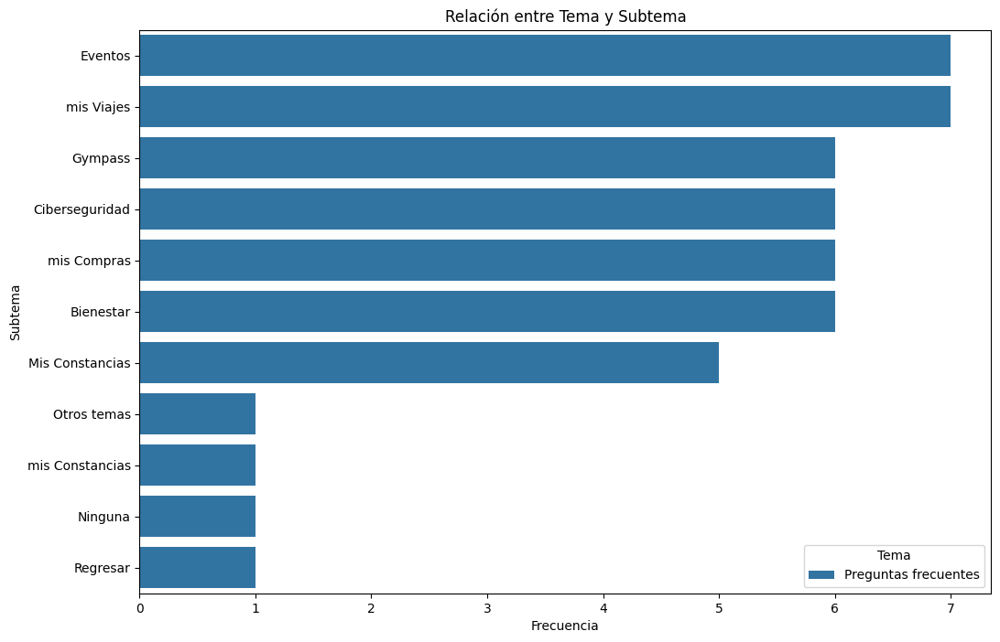

In [ ]:
# Visualización de la relación entre Tema y Subtema
if 'Tema' in df.columns and 'Subtema' in df.columns:
    plt.figure(figsize=(12, 8))

    # Contar la frecuencia de Subtemas por Tema
    sns.countplot(y='Subtema', hue='Tema', data=df, order=df['Subtema'].value_counts().index)

    plt.title('Relación entre Tema y Subtema')
    plt.xlabel('Frecuencia')
    plt.ylabel('Subtema')
    plt.legend(title='Tema')
    plt.show()
